In [1]:
## DGE for each time point to control (only old mice)
## MA Script to find the error
import ma_codes as codes
from ma_codes import mysize, mymap, gray_red

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sb

## Some Plotting Parameters
plt.rcParams["figure.figsize"] = (6, 5)
plt.rcParams.update({'font.size': 14})
plt.rcParams['pdf.fonttype'] = 42
sb.set_style("ticks")
rocket = sb.color_palette("rocket", as_cmap = True)

#pd.set_option("display.max_columns", 100)

#import diffxpy.api as de
#print(de.__version__)  ## before: v0.7.4

import diffxpy.api as de
print(de.__version__)  ## before: v0.7.4
sc.logging.print_version_and_date()

2024-08-15 09:35:25.770391: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-15 09:35:25.772982: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-15 09:35:25.779937: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1723707325.790877 2434442 cuda_dnn.cc:8430] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1723707325.794206 2434442 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-15 09:35:25.805954: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

v0.7.4
Running Scanpy 1.10.2, on 2024-08-15 09:35.


In [2]:
import sparse
sparse.__version__

'0.9.1'

In [3]:
object_folder = "/media/HDD_1/Janine/Aging_SingleCell/data_objects/"

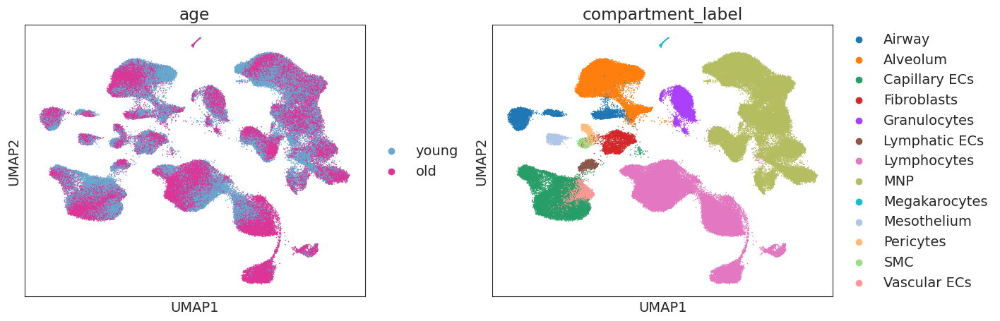

In [4]:
adata = sc.read(object_folder + "230111_Bleo_Ageing_annotated_final.h5ad", cache = False)
sc.pl.umap(adata, color = ["age", "compartment_label"], size = 5, wspace = 0.25)

In [5]:
adata

AnnData object with n_obs × n_vars = 160477 × 29814
    obs: 'age', 'barcode', 'batch', 'day', 'name', 'sex', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'doublet_scores', 'size_factors', 'S_score', 'G2M_score', 'phase', 'time_point', 'leiden_1', 'leiden_2', 'domain', 'cell_type', 'ct_level2', 'compartment_label', 'meta_label', 'age_treatment', 'age_day'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'age_colors', 'age_day_colors', 'age_treatment_colors', 'batch_colors', 'cell_type_colors', 'compartment_label_colors', 'ct_level2_colors', 'day_colors', 'dendrogram_cell_type', 'domain_colors', 'hvg', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'meta_label_colors', 'name_colors', 'neighbors', 'pca', 'sex_colors', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connect

In [6]:
### Scaling of counts is recommended for diffxpy
adata.obs["n_counts_scaled"] = adata.obs["n_counts"] / adata.obs["n_counts"].mean()

In [7]:
adata.obs.meta_label.value_counts()

meta_label
Macrophages       31129
T cells           23547
Capillary ECs     19975
Alveolum          19746
B cells           17254
DC                12899
Monocytes          8024
Granulocytes       5941
Airway             4747
Plasma cells       4641
Vascular ECs       3089
Fibroblasts        3046
NK                 2247
Lymphatic ECs      1200
Mesothelium        1066
Pericytes          1057
SMC                 717
Megakaryocytes      152
Name: count, dtype: int64

In [8]:
list(adata.obs.meta_label.unique())

['Airway',
 'Mesothelium',
 'Macrophages',
 'T cells',
 'Alveolum',
 'DC',
 'Vascular ECs',
 'Plasma cells',
 'Lymphatic ECs',
 'Fibroblasts',
 'Capillary ECs',
 'B cells',
 'Monocytes',
 'SMC',
 'Pericytes',
 'NK',
 'Granulocytes',
 'Megakaryocytes']

### Write it into function finally

In [9]:
def dge(a, ct = "Airway", ct_label = "meta_label", condition = "age", ref = "young", 
        pct_thresh = 0.05, subset = ["young", "old"], min_cells = 10, do_return = None, 
        suffix = "", myofib = None):
    
    if myofib:
        cells = a.obs.loc[:, ct_label].isin(subset)
    else:
        cells = a.obs.loc[:, ct_label] == ct
    
    count = a[cells].obs.loc[:, condition].value_counts()
    if (len(count) < 2) or (count[0] < min_cells) or (count[1] < min_cells):
        print("Too few cells in one condition (%s)\n%s" %(ct, count))
        return
        
    ## As threshold, take 5% of all cells in cell type per group
    tab = pd.DataFrame(index = a.var_names)
    tab = codes.add_pct(a[cells], tab = tab, group_by = condition,
                        gene_label = "index", ids = subset)
    test_genes = tab[(tab.loc[:, "pct.%s" %subset[0]] > pct_thresh) | (tab.loc[:, "pct.%s" %subset[1]] > pct_thresh)].index

    if myofib:
        print("Running Myofibroblast Version")
        adata_raw = codes.generate_count_object(a[:, test_genes], condition = condition,
                                                cell_type_label = ct_label, cell_type = subset, 
                                                ref = ref, min_cells = 5, subset = subset)
    
    else:
        adata_raw = codes.generate_count_object(a[:, test_genes], condition = condition,
                                                cell_type_label = ct_label, cell_type = [ct], 
                                                ref = ref, min_cells = 5, subset = subset)

    print("Started Diffxpy Calculation:\t%s" %codes.timestamp())

    de_test = de.test.wald(data = adata_raw.X, formula_loc = "~ 1 + %s" %condition,
                           factor_loc_totest = condition,
                           training_strategy = [{"max_steps": 100, "update_b_freq": 5,
                                                "ftol_b": 1e-8, "max_iter_b": 100}],
                           gene_names = adata_raw.var_names, sample_description = adata_raw.obs,
                           noise_model = "nb", size_factors = "n_counts_scaled")

    print("Finished Diffxpy Calculation:\t%s" %codes.timestamp())

    ## Export Table
    res = codes.tidy_table(de_test, a, cells = adata_raw.obs_names, ids = subset,
                           group_by = condition, qval_thresh = 1.0)


    filename = "diffxpy_%s_vs_%s_%s_%s%s.txt" %(subset[0], subset[1], ct.replace(" ", "_"), time.replace(" ", ""), suffix)
    print("Saving to %s\n" %filename)
    res.to_csv("%s%s" %(out_folder, filename), sep = "\t", index = False)
    
    if do_return:
        return res
    

In [10]:
cell_types = ['Alveolum','Airway','Macrophages','Monocytes','DC','B cells',
              'Plasma cells','T cells','NK','Granulocytes','Fibroblasts',
              'Pericytes','SMC','Mesothelium','Capillary ECs', 'Vascular ECs','Lymphatic ECs']

In [11]:
pd.crosstab(adata.obs.meta_label, adata.obs.age_day)

age_day,young_d0,young_d3,young_d10,young_d20,young_d30,young_d37,old_d0,old_d3,old_d10,old_d20,old_d30,old_d37
meta_label,,,,,,,,,,,,
Alveolum,7531,1777,698,563,867,1111,4019,1259,552,505,304,560
Airway,1103,194,249,312,370,369,769,229,265,413,195,279
Macrophages,3576,1294,3903,3421,2818,1745,2233,1093,2653,3868,2633,1892
Monocytes,1898,741,149,370,457,307,1741,846,425,144,857,89
DC,1415,495,1552,1303,1191,824,1395,498,1395,1221,726,884
B cells,2484,1443,1093,950,928,857,3481,1391,1686,1311,743,887
Plasma cells,75,36,35,95,138,163,1643,263,213,490,718,772
T cells,2770,1419,1946,1674,1577,1266,3599,1911,3029,2309,1162,885
NK,667,340,95,105,219,141,297,194,104,22,46,17


### day 0

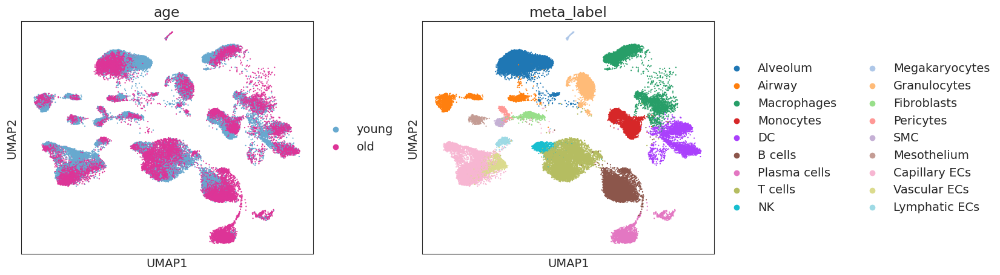

Alveolum - d0
(11550, 3102)


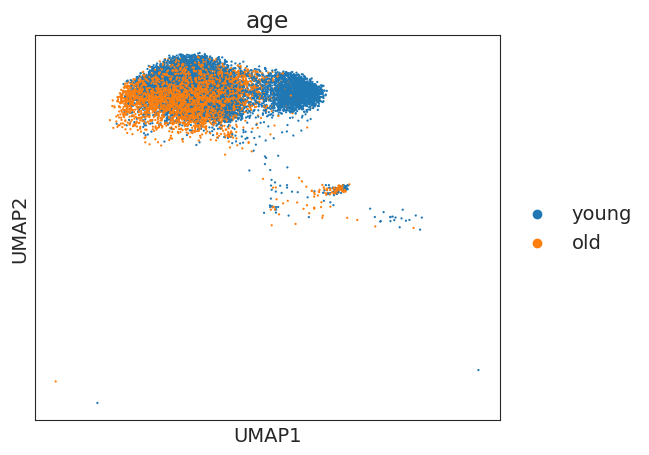

Started Diffxpy Calculation:	15-08-2024 09:35:41
training location model: True
training scale model: True
iter   0: ll=18970247.053424
iter   1: ll=17013962.448539, converged: 0.00% (loc: 0.00%, scale update: False), in 4.21sec
iter   2: ll=16595996.688459, converged: 0.00% (loc: 0.00%, scale update: False), in 4.52sec
iter   3: ll=16573585.321542, converged: 0.00% (loc: 0.00%, scale update: False), in 4.50sec
iter   4: ll=16573456.268062, converged: 0.00% (loc: 0.00%, scale update: False), in 4.20sec
iter   5: ll=16573456.120067, converged: 0.00% (loc: 2.55%, scale update: False), in 3.85sec
iter   6: ll=16374301.729695, converged: 0.00% (loc: 0.00%, scale update: True), in 40.72sec
iter   7: ll=16373232.993113, converged: 0.00% (loc: 0.03%, scale update: False), in 4.27sec
iter   8: ll=16373228.271389, converged: 0.00% (loc: 1.45%, scale update: False), in 4.31sec
iter   9: ll=16373228.256257, converged: 0.00% (loc: 18.89%, scale update: False), in 4.09sec
iter  10: ll=16373228.25620

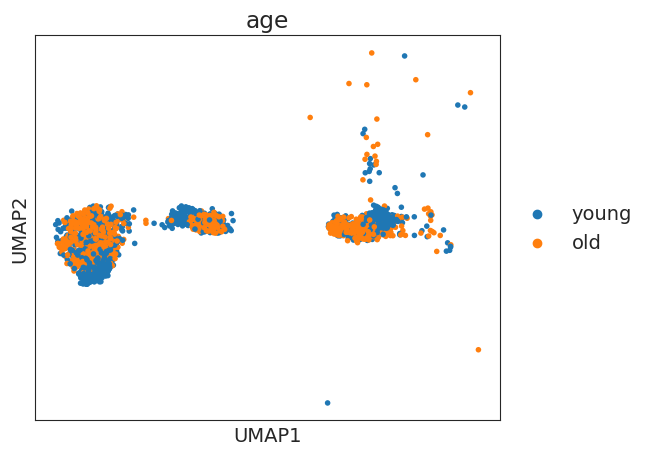

Started Diffxpy Calculation:	15-08-2024 09:39:41
training location model: True
training scale model: True
iter   0: ll=15211755.188350
iter   1: ll=14044869.827590, converged: 0.00% (loc: 2.78%, scale update: False), in 2.54sec
iter   2: ll=13648878.157746, converged: 0.00% (loc: 2.78%, scale update: False), in 2.07sec
iter   3: ll=13568982.725850, converged: 0.00% (loc: 2.78%, scale update: False), in 1.86sec
iter   4: ll=13558433.840958, converged: 0.00% (loc: 2.78%, scale update: False), in 1.53sec
iter   5: ll=13557335.265130, converged: 0.00% (loc: 2.78%, scale update: False), in 1.89sec
iter   6: ll=6447457.756474, converged: 0.00% (loc: 0.00%, scale update: True), in 21.33sec
iter   7: ll=6426083.246736, converged: 0.00% (loc: 0.00%, scale update: False), in 3.20sec
iter   8: ll=6424338.905536, converged: 0.00% (loc: 0.31%, scale update: False), in 2.36sec
iter   9: ll=6424144.505890, converged: 0.00% (loc: 1.26%, scale update: False), in 2.12sec
iter  10: ll=6424136.159936, con

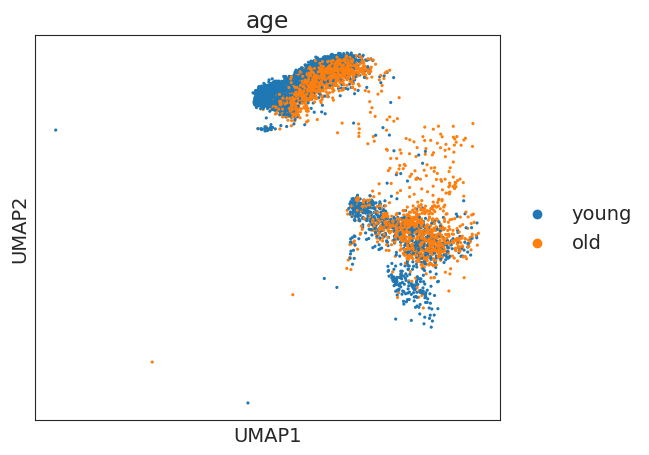

Started Diffxpy Calculation:	15-08-2024 09:42:29
training location model: True
training scale model: True
iter   0: ll=12601029.858266
iter   1: ll=11417155.763355, converged: 0.00% (loc: 0.00%, scale update: False), in 3.17sec
iter   2: ll=11163048.112615, converged: 0.00% (loc: 0.00%, scale update: False), in 4.67sec
iter   3: ll=11149511.541139, converged: 0.00% (loc: 0.00%, scale update: False), in 4.42sec
iter   4: ll=11149436.634504, converged: 0.00% (loc: 0.00%, scale update: False), in 3.64sec
iter   5: ll=11149436.542652, converged: 0.00% (loc: 3.21%, scale update: False), in 4.20sec
iter   6: ll=11011324.593823, converged: 0.00% (loc: 0.00%, scale update: True), in 33.65sec
iter   7: ll=11010611.276868, converged: 0.00% (loc: 0.07%, scale update: False), in 2.48sec
iter   8: ll=11010606.773778, converged: 0.00% (loc: 3.53%, scale update: False), in 2.40sec
iter   9: ll=11010606.750749, converged: 0.00% (loc: 19.86%, scale update: False), in 2.06sec
iter  10: ll=11010606.75061

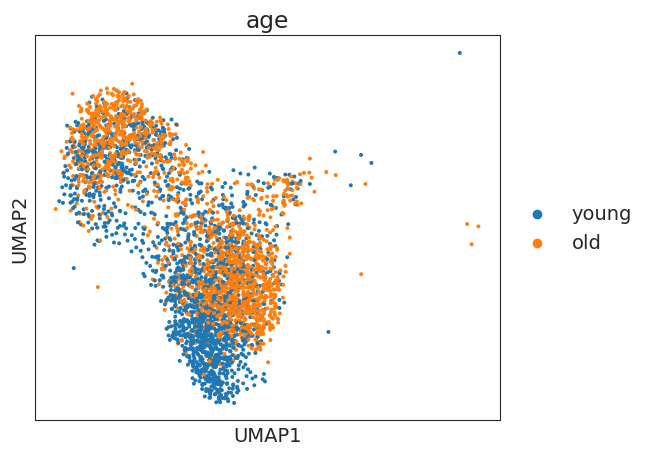

Started Diffxpy Calculation:	15-08-2024 09:45:40
training location model: True
training scale model: True
iter   0: ll=8971565.242917
iter   1: ll=8002439.974465, converged: 0.00% (loc: 0.00%, scale update: False), in 1.76sec
iter   2: ll=7793510.766414, converged: 0.00% (loc: 0.00%, scale update: False), in 1.71sec
iter   3: ll=7781422.758991, converged: 0.00% (loc: 0.00%, scale update: False), in 2.80sec
iter   4: ll=7781306.614672, converged: 0.00% (loc: 0.00%, scale update: False), in 2.06sec
iter   5: ll=7781306.052067, converged: 0.00% (loc: 1.26%, scale update: False), in 2.58sec
iter   6: ll=7726593.409616, converged: 0.00% (loc: 0.00%, scale update: True), in 23.77sec
iter   7: ll=7725974.279073, converged: 0.00% (loc: 0.05%, scale update: False), in 1.60sec
iter   8: ll=7725967.487569, converged: 0.00% (loc: 1.23%, scale update: False), in 1.52sec
iter   9: ll=7725967.427279, converged: 0.00% (loc: 12.16%, scale update: False), in 1.57sec
iter  10: ll=7725967.426697, converge

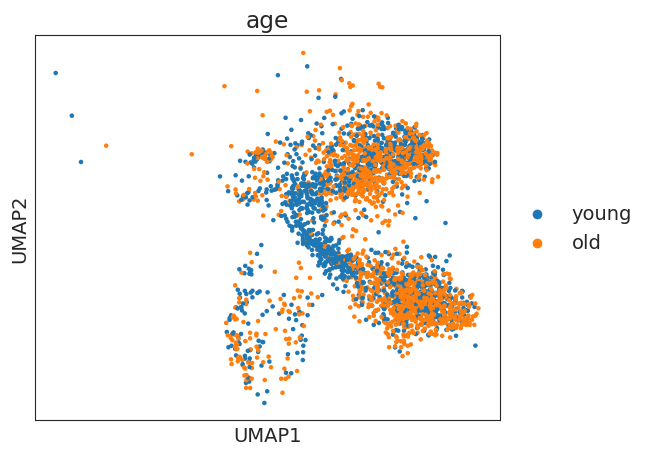

Started Diffxpy Calculation:	15-08-2024 09:47:42
training location model: True
training scale model: True
iter   0: ll=6578209.814688
iter   1: ll=5888784.672404, converged: 0.00% (loc: 0.00%, scale update: False), in 2.45sec
iter   2: ll=5742403.313898, converged: 0.00% (loc: 0.00%, scale update: False), in 2.65sec
iter   3: ll=5734268.663165, converged: 0.00% (loc: 0.00%, scale update: False), in 2.86sec
iter   4: ll=5734208.835366, converged: 0.00% (loc: 0.00%, scale update: False), in 2.09sec
iter   5: ll=5734208.705134, converged: 0.00% (loc: 1.48%, scale update: False), in 3.23sec
iter   6: ll=5704614.019768, converged: 0.00% (loc: 0.00%, scale update: True), in 16.17sec
iter   7: ll=5704380.128080, converged: 0.00% (loc: 0.05%, scale update: False), in 2.10sec
iter   8: ll=5704378.706301, converged: 0.00% (loc: 3.71%, scale update: False), in 1.78sec
iter   9: ll=5704378.699182, converged: 0.00% (loc: 28.36%, scale update: False), in 1.46sec
iter  10: ll=5704378.699143, converge

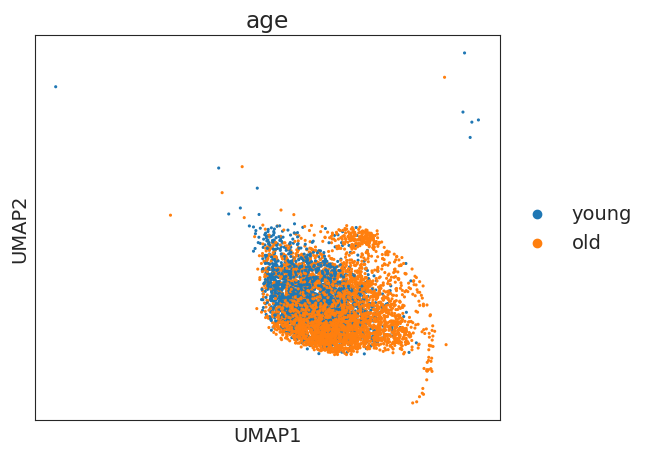

Started Diffxpy Calculation:	15-08-2024 09:49:22
training location model: True
training scale model: True
iter   0: ll=9415042.882640
iter   1: ll=8544853.770007, converged: 0.00% (loc: 0.00%, scale update: False), in 2.11sec
iter   2: ll=8340732.220338, converged: 0.00% (loc: 0.00%, scale update: False), in 2.30sec
iter   3: ll=8329106.118976, converged: 0.00% (loc: 0.00%, scale update: False), in 2.26sec
iter   4: ll=8329048.164322, converged: 0.00% (loc: 0.00%, scale update: False), in 2.90sec
iter   5: ll=8329048.101672, converged: 0.00% (loc: 18.57%, scale update: False), in 2.35sec
iter   6: ll=8172174.928245, converged: 0.00% (loc: 0.00%, scale update: True), in 24.51sec
iter   7: ll=8171815.864612, converged: 0.00% (loc: 0.03%, scale update: False), in 3.08sec
iter   8: ll=8171812.324782, converged: 0.00% (loc: 4.65%, scale update: False), in 2.72sec
iter   9: ll=8171812.285144, converged: 0.00% (loc: 49.13%, scale update: False), in 2.81sec
iter  10: ll=8171812.283848, converg

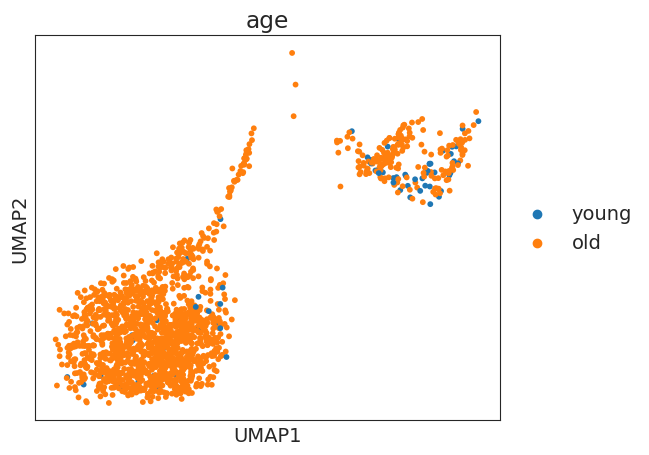

Started Diffxpy Calculation:	15-08-2024 09:51:31
training location model: True
training scale model: True
iter   0: ll=2943580.172132
caught 6 linalg singular matrix errors
iter   1: ll=2666142.111827, converged: 0.00% (loc: 1.97%, scale update: False), in 1.07sec
iter   2: ll=2599697.333782, converged: 0.00% (loc: 1.97%, scale update: False), in 1.11sec
iter   3: ll=2593804.050935, converged: 0.00% (loc: 1.97%, scale update: False), in 1.08sec
iter   4: ll=2593621.116353, converged: 0.00% (loc: 1.97%, scale update: False), in 1.16sec
iter   5: ll=2593615.237155, converged: 0.00% (loc: 2.70%, scale update: False), in 1.26sec
iter   6: ll=1766368.394041, converged: 0.00% (loc: 0.00%, scale update: True), in 6.27sec
caught 6 linalg singular matrix errors
iter   7: ll=1764846.764946, converged: 0.00% (loc: 0.41%, scale update: False), in 0.95sec
iter   8: ll=1764685.501071, converged: 0.00% (loc: 2.20%, scale update: False), in 0.83sec
iter   9: ll=1764678.323074, converged: 0.00% (loc: 1

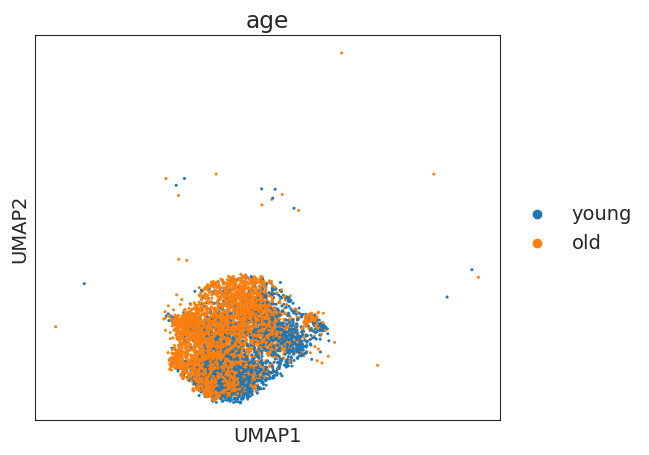

Started Diffxpy Calculation:	15-08-2024 09:52:24
training location model: True
training scale model: True
iter   0: ll=10048419.073053
iter   1: ll=9107514.562675, converged: 0.00% (loc: 0.00%, scale update: False), in 2.71sec
iter   2: ll=8902872.651733, converged: 0.00% (loc: 0.00%, scale update: False), in 2.84sec
iter   3: ll=8892950.308716, converged: 0.00% (loc: 0.00%, scale update: False), in 3.14sec
iter   4: ll=8892922.149806, converged: 0.00% (loc: 0.00%, scale update: False), in 2.60sec
iter   5: ll=8892922.146022, converged: 0.00% (loc: 40.70%, scale update: False), in 2.74sec
iter   6: ll=8752677.729823, converged: 0.00% (loc: 0.00%, scale update: True), in 27.30sec
iter   7: ll=8752578.334319, converged: 0.00% (loc: 0.21%, scale update: False), in 1.77sec
iter   8: ll=8752578.145593, converged: 0.00% (loc: 15.41%, scale update: False), in 1.57sec
iter   9: ll=8752578.145079, converged: 0.00% (loc: 95.25%, scale update: False), in 1.44sec
iter  10: ll=8752578.145076, conve

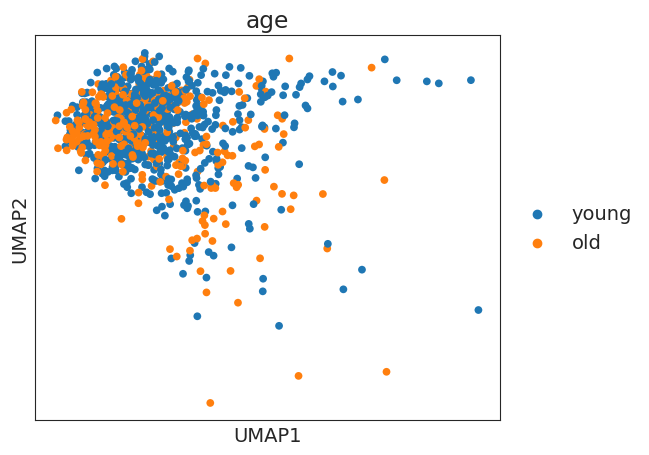

Started Diffxpy Calculation:	15-08-2024 09:54:25
training location model: True
training scale model: True
iter   0: ll=1475841.639404
iter   1: ll=1338027.160037, converged: 0.00% (loc: 0.00%, scale update: False), in 0.31sec
iter   2: ll=1307748.345851, converged: 0.00% (loc: 0.00%, scale update: False), in 0.31sec
iter   3: ll=1306244.439006, converged: 0.00% (loc: 0.00%, scale update: False), in 0.30sec
iter   4: ll=1306239.687578, converged: 0.00% (loc: 0.00%, scale update: False), in 0.31sec
iter   5: ll=1306239.686072, converged: 0.00% (loc: 34.54%, scale update: False), in 0.31sec
iter   6: ll=1283190.765034, converged: 0.00% (loc: 0.00%, scale update: True), in 4.99sec
iter   7: ll=1283162.962539, converged: 0.00% (loc: 0.07%, scale update: False), in 0.32sec
iter   8: ll=1283162.899177, converged: 0.00% (loc: 12.94%, scale update: False), in 0.31sec
iter   9: ll=1283162.899052, converged: 0.00% (loc: 89.29%, scale update: False), in 0.29sec
iter  10: ll=1283162.899051, converg

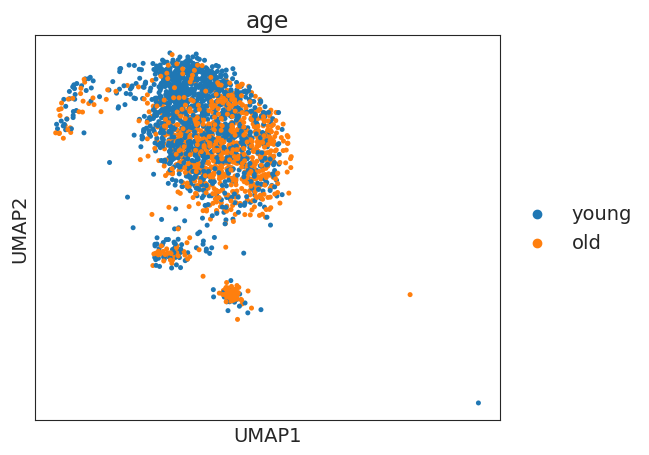

Started Diffxpy Calculation:	15-08-2024 09:54:52
training location model: True
training scale model: True
iter   0: ll=2426028.794971
iter   1: ll=2170888.426944, converged: 0.00% (loc: 0.00%, scale update: False), in 0.78sec
iter   2: ll=2105884.405423, converged: 0.00% (loc: 0.00%, scale update: False), in 0.76sec
iter   3: ll=2101710.061155, converged: 0.00% (loc: 0.00%, scale update: False), in 0.73sec
iter   4: ll=2101690.351799, converged: 0.00% (loc: 0.00%, scale update: False), in 0.76sec
iter   5: ll=2101690.349574, converged: 0.00% (loc: 23.82%, scale update: False), in 0.67sec
iter   6: ll=2061181.978513, converged: 0.00% (loc: 0.00%, scale update: True), in 5.53sec
iter   7: ll=2061164.866594, converged: 0.00% (loc: 0.00%, scale update: False), in 0.97sec
iter   8: ll=2061164.854651, converged: 0.00% (loc: 24.54%, scale update: False), in 0.86sec
iter   9: ll=2061164.854642, converged: 0.00% (loc: 98.27%, scale update: False), in 0.67sec
iter  10: ll=2061164.854642, converg

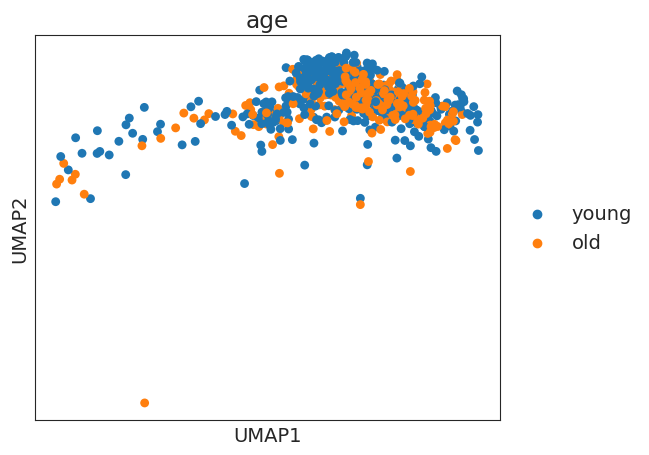

Started Diffxpy Calculation:	15-08-2024 09:55:25
training location model: True
training scale model: True
iter   0: ll=1659745.369663
iter   1: ll=1509631.400301, converged: 0.00% (loc: 0.00%, scale update: False), in 0.40sec
iter   2: ll=1475970.826184, converged: 0.00% (loc: 0.00%, scale update: False), in 0.38sec
iter   3: ll=1473907.456785, converged: 0.00% (loc: 0.00%, scale update: False), in 0.39sec
iter   4: ll=1473887.503064, converged: 0.00% (loc: 0.00%, scale update: False), in 0.41sec
iter   5: ll=1473887.424190, converged: 0.00% (loc: 2.80%, scale update: False), in 0.39sec
iter   6: ll=1457548.141318, converged: 0.00% (loc: 0.00%, scale update: True), in 6.17sec
iter   7: ll=1457378.057227, converged: 0.00% (loc: 0.05%, scale update: False), in 0.65sec
iter   8: ll=1457375.832371, converged: 0.00% (loc: 2.84%, scale update: False), in 1.36sec
iter   9: ll=1457375.806952, converged: 0.00% (loc: 19.57%, scale update: False), in 0.61sec
iter  10: ll=1457375.806622, converged

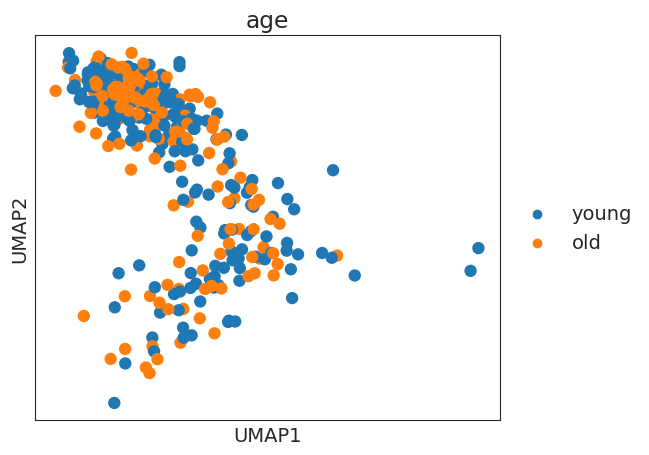

Started Diffxpy Calculation:	15-08-2024 09:56:11
training location model: True
training scale model: True
iter   0: ll=772667.174675
caught 1 linalg singular matrix errors
iter   1: ll=702174.844971, converged: 0.00% (loc: 0.05%, scale update: False), in 0.36sec
iter   2: ll=687101.876172, converged: 0.00% (loc: 0.05%, scale update: False), in 0.36sec
iter   3: ll=686324.712319, converged: 0.00% (loc: 0.05%, scale update: False), in 0.35sec
iter   4: ll=686320.628264, converged: 0.00% (loc: 0.05%, scale update: False), in 0.36sec
iter   5: ll=686320.621232, converged: 0.00% (loc: 19.42%, scale update: False), in 0.38sec
iter   6: ll=671602.782505, converged: 0.00% (loc: 0.00%, scale update: True), in 4.02sec
caught 1 linalg singular matrix errors
iter   7: ll=671555.063957, converged: 0.00% (loc: 0.20%, scale update: False), in 0.53sec
iter   8: ll=671554.658573, converged: 0.00% (loc: 5.66%, scale update: False), in 0.38sec
iter   9: ll=671554.656765, converged: 0.00% (loc: 59.50%, sc

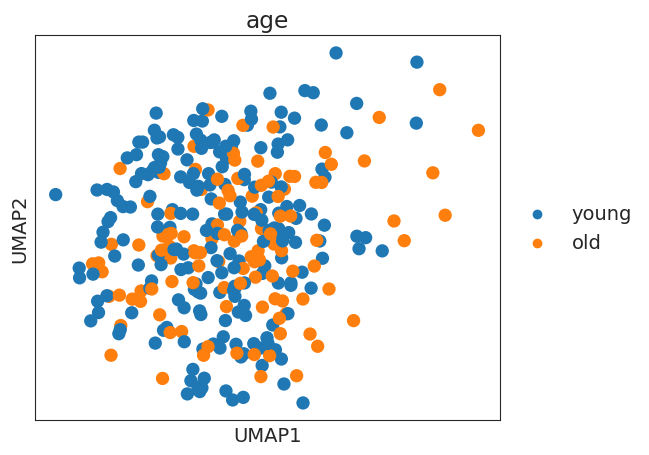

Started Diffxpy Calculation:	15-08-2024 09:56:47
training location model: True
training scale model: True
iter   0: ll=877684.940956
caught 5 linalg singular matrix errors
iter   1: ll=789860.217341, converged: 0.00% (loc: 0.43%, scale update: False), in 0.41sec
iter   2: ll=769519.696307, converged: 0.00% (loc: 0.43%, scale update: False), in 0.43sec
iter   3: ll=768052.764962, converged: 0.00% (loc: 0.43%, scale update: False), in 0.47sec
iter   4: ll=768027.677661, converged: 0.00% (loc: 0.43%, scale update: False), in 0.42sec
iter   5: ll=768027.402068, converged: 0.00% (loc: 0.88%, scale update: False), in 0.42sec
iter   6: ll=693784.634313, converged: 0.00% (loc: 0.00%, scale update: True), in 5.10sec
caught 5 linalg singular matrix errors
iter   7: ll=693522.609893, converged: 0.00% (loc: 0.34%, scale update: False), in 0.39sec
iter   8: ll=693504.208636, converged: 0.00% (loc: 2.53%, scale update: False), in 0.39sec
iter   9: ll=693503.597768, converged: 0.00% (loc: 15.27%, sca

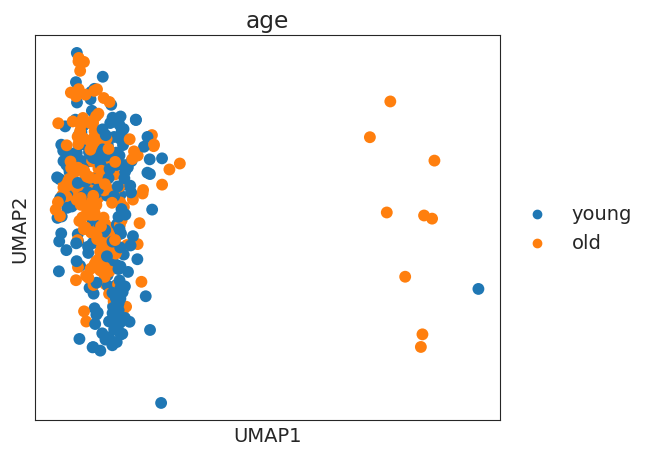

Started Diffxpy Calculation:	15-08-2024 09:57:52
training location model: True
training scale model: True
iter   0: ll=1226739.688285
caught 1 linalg singular matrix errors
iter   1: ll=1108282.427464, converged: 0.00% (loc: 0.54%, scale update: False), in 0.54sec
iter   2: ll=1079633.942523, converged: 0.00% (loc: 0.54%, scale update: False), in 0.75sec
iter   3: ll=1077236.427952, converged: 0.00% (loc: 0.54%, scale update: False), in 1.15sec
iter   4: ll=1077176.973101, converged: 0.00% (loc: 0.54%, scale update: False), in 0.42sec
iter   5: ll=1077175.941263, converged: 0.00% (loc: 0.63%, scale update: False), in 0.40sec
iter   6: ll=937090.894396, converged: 0.00% (loc: 0.00%, scale update: True), in 4.96sec
caught 1 linalg singular matrix errors
iter   7: ll=936488.648121, converged: 0.00% (loc: 0.09%, scale update: False), in 0.69sec
iter   8: ll=936396.234753, converged: 0.00% (loc: 1.30%, scale update: False), in 0.59sec
iter   9: ll=936376.825397, converged: 0.00% (loc: 12.31

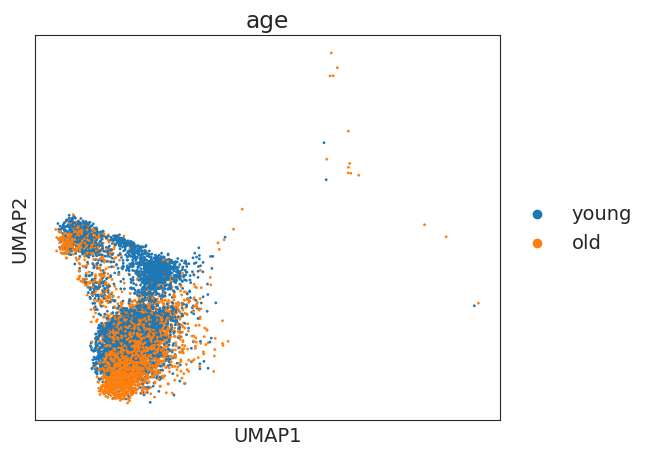

Started Diffxpy Calculation:	15-08-2024 09:58:38
training location model: True
training scale model: True
iter   0: ll=14625036.509987
iter   1: ll=13348946.255571, converged: 0.00% (loc: 0.00%, scale update: False), in 2.41sec
iter   2: ll=13059789.484823, converged: 0.00% (loc: 0.00%, scale update: False), in 2.21sec
iter   3: ll=13044072.368595, converged: 0.00% (loc: 0.00%, scale update: False), in 2.31sec
iter   4: ll=13044005.858547, converged: 0.00% (loc: 0.00%, scale update: False), in 3.32sec
iter   5: ll=13044005.837844, converged: 0.00% (loc: 7.08%, scale update: False), in 3.60sec
iter   6: ll=12768032.306333, converged: 0.00% (loc: 0.00%, scale update: True), in 33.48sec
iter   7: ll=12767431.267779, converged: 0.00% (loc: 0.03%, scale update: False), in 2.35sec
iter   8: ll=12767429.078819, converged: 0.00% (loc: 3.40%, scale update: False), in 2.25sec
iter   9: ll=12767429.072789, converged: 0.00% (loc: 39.86%, scale update: False), in 2.23sec
iter  10: ll=12767429.07277

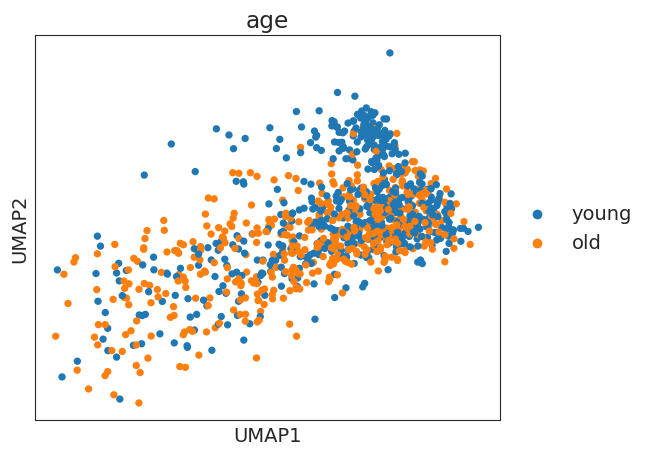

Started Diffxpy Calculation:	15-08-2024 10:01:31
training location model: True
training scale model: True
iter   0: ll=2645609.276381
iter   1: ll=2395571.955317, converged: 0.00% (loc: 0.00%, scale update: False), in 1.80sec
iter   2: ll=2338163.460032, converged: 0.00% (loc: 0.00%, scale update: False), in 1.81sec
iter   3: ll=2334394.695823, converged: 0.00% (loc: 0.00%, scale update: False), in 2.10sec
iter   4: ll=2334352.533597, converged: 0.00% (loc: 0.00%, scale update: False), in 1.58sec
iter   5: ll=2334352.345904, converged: 0.00% (loc: 0.74%, scale update: False), in 1.62sec
iter   6: ll=2311663.888306, converged: 0.00% (loc: 0.00%, scale update: True), in 7.74sec
iter   7: ll=2311402.069695, converged: 0.00% (loc: 0.02%, scale update: False), in 0.99sec
iter   8: ll=2311398.399464, converged: 0.00% (loc: 2.11%, scale update: False), in 1.23sec
iter   9: ll=2311398.354624, converged: 0.00% (loc: 13.55%, scale update: False), in 0.93sec
iter  10: ll=2311398.354000, converged

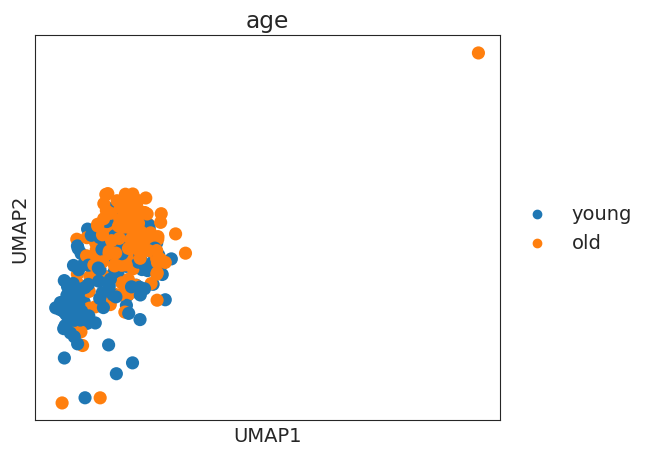

Started Diffxpy Calculation:	15-08-2024 10:02:31
training location model: True
training scale model: True
iter   0: ll=1433686.948999
caught 8 linalg singular matrix errors
iter   1: ll=1321568.081756, converged: 0.00% (loc: 1.42%, scale update: False), in 0.60sec
iter   2: ll=1293730.160064, converged: 0.00% (loc: 1.42%, scale update: False), in 0.50sec
iter   3: ll=1291123.060259, converged: 0.00% (loc: 1.42%, scale update: False), in 0.47sec
iter   4: ll=1291027.795721, converged: 0.00% (loc: 1.42%, scale update: False), in 0.44sec
iter   5: ll=1291024.813188, converged: 0.00% (loc: 1.46%, scale update: False), in 1.27sec
iter   6: ll=900590.691985, converged: 0.00% (loc: 0.00%, scale update: True), in 6.63sec
caught 8 linalg singular matrix errors
iter   7: ll=899471.823970, converged: 0.00% (loc: 0.36%, scale update: False), in 0.67sec
iter   8: ll=899301.728776, converged: 0.00% (loc: 1.14%, scale update: False), in 0.62sec
iter   9: ll=899294.051245, converged: 0.00% (loc: 7.52%

In [12]:
out_folder = "/media/HDD_1/Janine/Aging_SingleCell/data/DGE_data/dge_meta_label_young_vs_old/"

subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d0"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")

### day 3

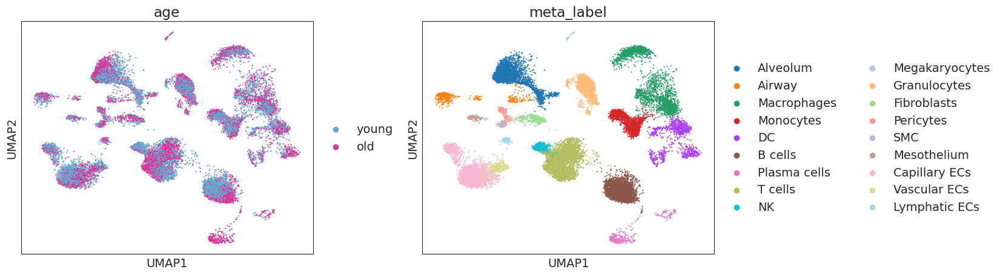

Alveolum - d3
(3036, 5151)


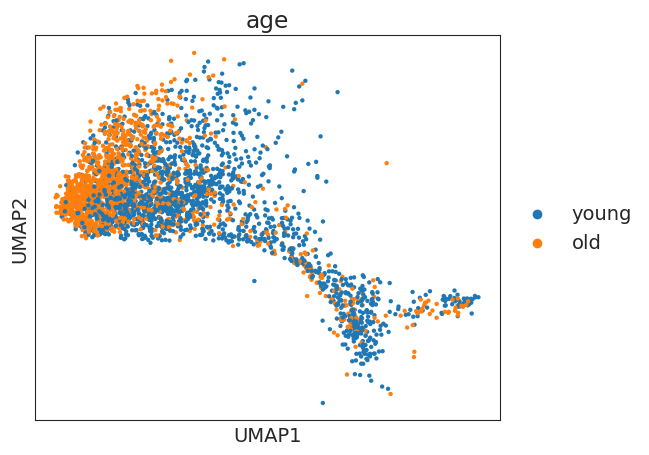

Started Diffxpy Calculation:	15-08-2024 10:03:37
training location model: True
training scale model: True
iter   0: ll=44921788.992982
iter   1: ll=43090700.413840, converged: 0.00% (loc: 8.31%, scale update: False), in 1.77sec
iter   2: ll=42548859.215557, converged: 0.00% (loc: 8.31%, scale update: False), in 1.77sec
iter   3: ll=42469586.849036, converged: 0.00% (loc: 8.31%, scale update: False), in 1.70sec
iter   4: ll=42464320.904024, converged: 0.00% (loc: 8.31%, scale update: False), in 1.66sec
iter   5: ll=42464123.248469, converged: 0.00% (loc: 8.31%, scale update: False), in 1.81sec
iter   6: ll=8354292.401478, converged: 0.00% (loc: 0.00%, scale update: True), in 21.26sec
iter   7: ll=8309104.945085, converged: 0.00% (loc: 0.00%, scale update: False), in 2.32sec
iter   8: ll=8301434.122274, converged: 0.00% (loc: 0.76%, scale update: False), in 2.06sec
iter   9: ll=8300749.421250, converged: 0.00% (loc: 4.50%, scale update: False), in 1.96sec
iter  10: ll=8300735.043292, con

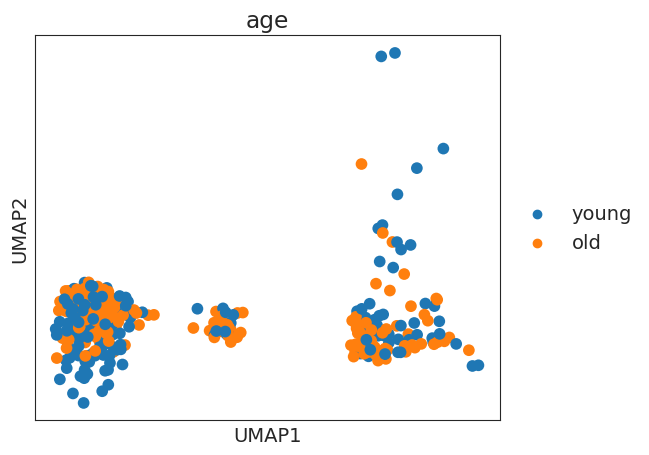

Started Diffxpy Calculation:	15-08-2024 10:06:20
training location model: True
training scale model: True
iter   0: ll=89265102.670444
caught 4 linalg singular matrix errors
iter   1: ll=88618492.612827, converged: 0.00% (loc: 51.38%, scale update: False), in 1.17sec
iter   2: ll=88308177.880316, converged: 0.00% (loc: 51.38%, scale update: False), in 1.45sec
iter   3: ll=88193180.844870, converged: 0.00% (loc: 51.38%, scale update: False), in 1.91sec
iter   4: ll=88161290.000390, converged: 0.00% (loc: 51.38%, scale update: False), in 1.62sec
iter   5: ll=88155104.088016, converged: 0.00% (loc: 51.38%, scale update: False), in 0.80sec
iter   6: ll=2337294.416936, converged: 0.00% (loc: 0.00%, scale update: True), in 8.14sec
caught 4 linalg singular matrix errors
iter   7: ll=2266245.511568, converged: 0.00% (loc: 0.35%, scale update: False), in 0.60sec
iter   8: ll=2246339.686915, converged: 0.00% (loc: 0.53%, scale update: False), in 0.60sec
iter   9: ll=2242725.111441, converged: 0.

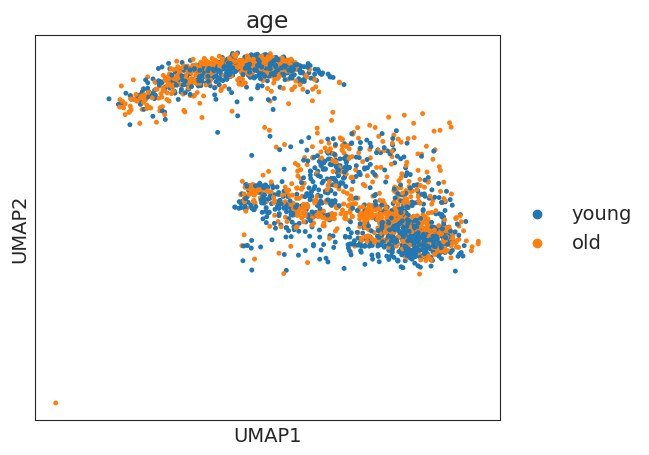

Started Diffxpy Calculation:	15-08-2024 10:08:05
training location model: True
training scale model: True
iter   0: ll=20268023.808615
iter   1: ll=18717284.644054, converged: 0.00% (loc: 3.21%, scale update: False), in 3.32sec
iter   2: ll=18256054.417844, converged: 0.00% (loc: 3.21%, scale update: False), in 3.07sec
iter   3: ll=18189743.442006, converged: 0.00% (loc: 3.21%, scale update: False), in 2.92sec
iter   4: ll=18185332.251515, converged: 0.00% (loc: 3.21%, scale update: False), in 3.20sec
iter   5: ll=18185148.787652, converged: 0.00% (loc: 3.21%, scale update: False), in 2.50sec
iter   6: ll=7880646.034237, converged: 0.00% (loc: 0.00%, scale update: True), in 19.36sec
iter   7: ll=7859339.334581, converged: 0.00% (loc: 0.00%, scale update: False), in 1.63sec
iter   8: ll=7856085.741254, converged: 0.00% (loc: 0.94%, scale update: False), in 1.73sec
iter   9: ll=7855794.374745, converged: 0.00% (loc: 4.48%, scale update: False), in 2.41sec
iter  10: ll=7855789.408183, con

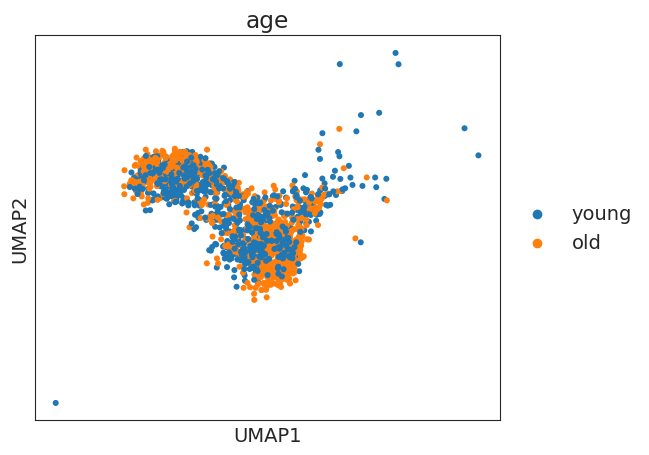

Started Diffxpy Calculation:	15-08-2024 10:10:49
training location model: True
training scale model: True
iter   0: ll=3495600.512012
iter   1: ll=3146912.838068, converged: 0.00% (loc: 0.00%, scale update: False), in 1.48sec
iter   2: ll=3075235.927611, converged: 0.00% (loc: 0.00%, scale update: False), in 1.67sec
iter   3: ll=3071852.669853, converged: 0.00% (loc: 0.00%, scale update: False), in 1.13sec
iter   4: ll=3071839.259953, converged: 0.00% (loc: 0.00%, scale update: False), in 1.12sec
iter   5: ll=3071839.246948, converged: 0.00% (loc: 27.57%, scale update: False), in 1.55sec
iter   6: ll=3016918.188675, converged: 0.00% (loc: 0.00%, scale update: True), in 13.06sec
iter   7: ll=3016775.827575, converged: 0.00% (loc: 0.00%, scale update: False), in 1.78sec
iter   8: ll=3016775.405289, converged: 0.00% (loc: 5.36%, scale update: False), in 1.52sec
iter   9: ll=3016775.404382, converged: 0.00% (loc: 65.82%, scale update: False), in 1.66sec
iter  10: ll=3016775.404379, converg

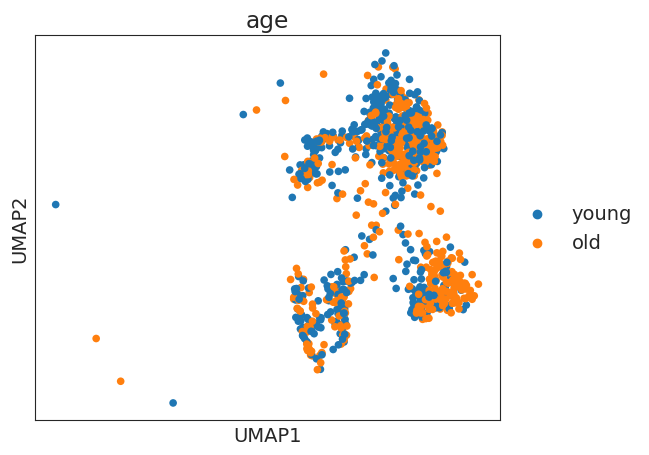

Started Diffxpy Calculation:	15-08-2024 10:11:53
training location model: True
training scale model: True
iter   0: ll=5334453.723118
iter   1: ll=4898703.446385, converged: 0.00% (loc: 1.97%, scale update: False), in 0.91sec
iter   2: ll=4782666.656028, converged: 0.00% (loc: 1.97%, scale update: False), in 0.48sec
iter   3: ll=4769925.268222, converged: 0.00% (loc: 1.97%, scale update: False), in 0.67sec
iter   4: ll=4769375.614910, converged: 0.00% (loc: 1.97%, scale update: False), in 1.77sec
iter   5: ll=4769359.515154, converged: 0.00% (loc: 2.05%, scale update: False), in 1.22sec
iter   6: ll=2815397.835624, converged: 0.00% (loc: 0.00%, scale update: True), in 9.71sec
iter   7: ll=2811379.225649, converged: 0.00% (loc: 0.06%, scale update: False), in 1.70sec
iter   8: ll=2810906.634463, converged: 0.00% (loc: 1.48%, scale update: False), in 0.97sec
iter   9: ll=2810885.015974, converged: 0.00% (loc: 9.78%, scale update: False), in 0.88sec
iter  10: ll=2810884.676507, converged:

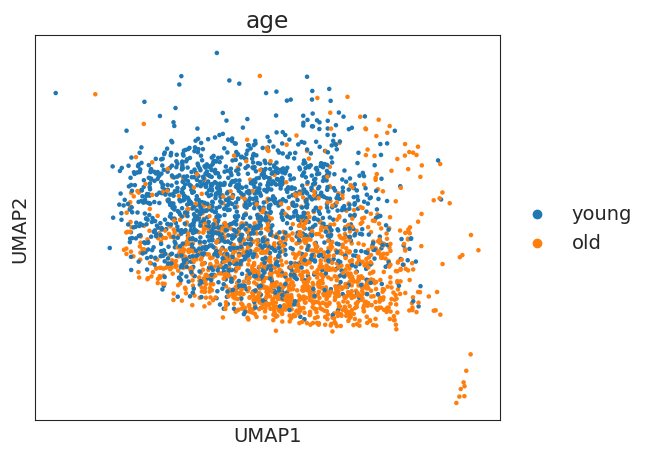

Started Diffxpy Calculation:	15-08-2024 10:13:05
training location model: True
training scale model: True
iter   0: ll=4093217.812073
iter   1: ll=3688115.655784, converged: 0.00% (loc: 0.00%, scale update: False), in 1.23sec
iter   2: ll=3593375.878730, converged: 0.00% (loc: 0.00%, scale update: False), in 1.11sec
iter   3: ll=3588085.364716, converged: 0.00% (loc: 0.00%, scale update: False), in 1.11sec
iter   4: ll=3588064.903235, converged: 0.00% (loc: 0.00%, scale update: False), in 1.15sec
iter   5: ll=3588064.898113, converged: 0.00% (loc: 21.14%, scale update: False), in 1.25sec
iter   6: ll=3517489.868197, converged: 0.00% (loc: 0.00%, scale update: True), in 10.13sec
iter   7: ll=3517399.803817, converged: 0.00% (loc: 0.00%, scale update: False), in 1.16sec
iter   8: ll=3517399.399327, converged: 0.00% (loc: 9.04%, scale update: False), in 1.19sec
iter   9: ll=3517399.396926, converged: 0.00% (loc: 81.69%, scale update: False), in 1.08sec
iter  10: ll=3517399.396888, converg

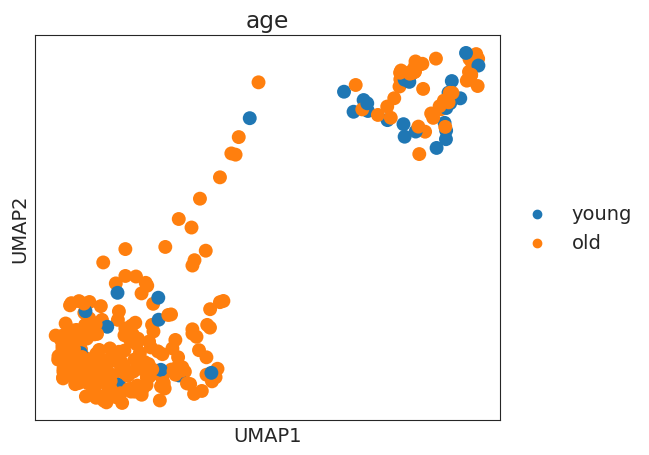

Started Diffxpy Calculation:	15-08-2024 10:14:03
training location model: True
training scale model: True
iter   0: ll=14704277.424613
caught 23 linalg singular matrix errors
iter   1: ll=14637350.999811, converged: 0.00% (loc: 53.10%, scale update: False), in 0.47sec
iter   2: ll=14614028.936832, converged: 0.00% (loc: 53.10%, scale update: False), in 0.51sec
iter   3: ll=14609551.142225, converged: 0.00% (loc: 53.10%, scale update: False), in 0.47sec
iter   4: ll=14609137.153503, converged: 0.00% (loc: 53.10%, scale update: False), in 0.48sec
iter   5: ll=14609115.476663, converged: 0.00% (loc: 53.20%, scale update: False), in 0.41sec
iter   6: ll=651702.210891, converged: 0.00% (loc: 0.00%, scale update: True), in 3.70sec
caught 23 linalg singular matrix errors
iter   7: ll=640040.237167, converged: 0.00% (loc: 9.09%, scale update: False), in 0.34sec
iter   8: ll=636918.936354, converged: 0.00% (loc: 10.66%, scale update: False), in 0.32sec
iter   9: ll=636541.758512, converged: 0.0

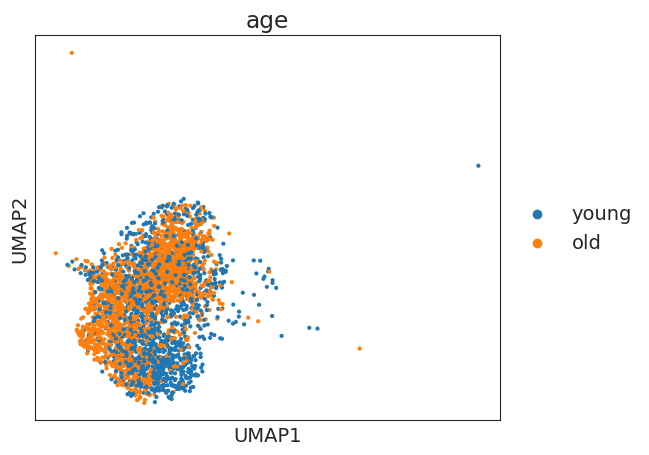

Started Diffxpy Calculation:	15-08-2024 10:14:59
training location model: True
training scale model: True
iter   0: ll=5415322.165843
iter   1: ll=4907242.874545, converged: 0.00% (loc: 0.00%, scale update: False), in 1.48sec
iter   2: ll=4794619.680915, converged: 0.00% (loc: 0.00%, scale update: False), in 1.25sec
iter   3: ll=4788927.821615, converged: 0.00% (loc: 0.00%, scale update: False), in 1.27sec
iter   4: ll=4788909.907217, converged: 0.00% (loc: 0.00%, scale update: False), in 1.39sec
iter   5: ll=4788909.903004, converged: 0.00% (loc: 26.99%, scale update: False), in 1.47sec
iter   6: ll=4700008.131805, converged: 0.00% (loc: 0.00%, scale update: True), in 13.37sec
iter   7: ll=4699886.693220, converged: 0.00% (loc: 0.00%, scale update: False), in 1.54sec
iter   8: ll=4699886.141454, converged: 0.00% (loc: 9.11%, scale update: False), in 1.34sec
iter   9: ll=4699886.138861, converged: 0.00% (loc: 77.57%, scale update: False), in 1.68sec
iter  10: ll=4699886.138836, converg

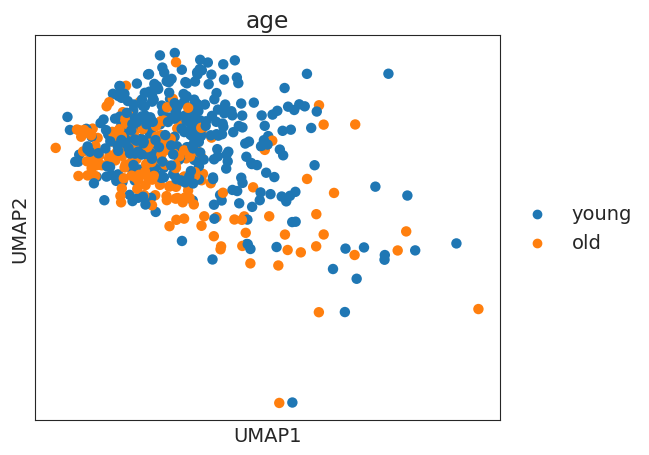

Started Diffxpy Calculation:	15-08-2024 10:16:14
training location model: True
training scale model: True
iter   0: ll=723314.034799
caught 1 linalg singular matrix errors
iter   1: ll=651342.021415, converged: 0.00% (loc: 0.04%, scale update: False), in 0.26sec
iter   2: ll=634705.493058, converged: 0.00% (loc: 0.04%, scale update: False), in 0.28sec
iter   3: ll=633792.967678, converged: 0.00% (loc: 0.04%, scale update: False), in 0.83sec
iter   4: ll=633789.605210, converged: 0.00% (loc: 0.04%, scale update: False), in 0.25sec
iter   5: ll=633789.604196, converged: 0.00% (loc: 23.10%, scale update: False), in 0.27sec
iter   6: ll=618893.270320, converged: 0.00% (loc: 0.00%, scale update: True), in 3.52sec
caught 1 linalg singular matrix errors
iter   7: ll=618867.276652, converged: 0.00% (loc: 0.30%, scale update: False), in 0.71sec
iter   8: ll=618867.222186, converged: 0.00% (loc: 9.10%, scale update: False), in 0.46sec
iter   9: ll=618867.222093, converged: 0.00% (loc: 87.34%, sc

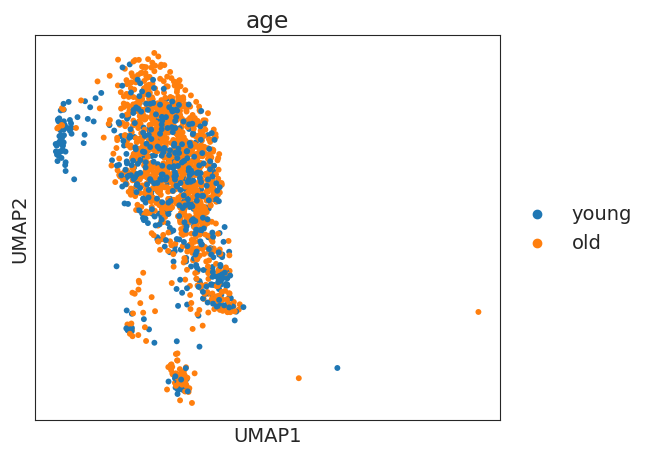

Started Diffxpy Calculation:	15-08-2024 10:16:35
training location model: True
training scale model: True
iter   0: ll=1562684.270451
iter   1: ll=1386171.193582, converged: 0.00% (loc: 0.00%, scale update: False), in 0.67sec
iter   2: ll=1335817.149489, converged: 0.00% (loc: 0.00%, scale update: False), in 0.70sec
iter   3: ll=1331835.473128, converged: 0.00% (loc: 0.00%, scale update: False), in 0.78sec
iter   4: ll=1331808.883555, converged: 0.00% (loc: 0.00%, scale update: False), in 0.82sec
iter   5: ll=1331808.881898, converged: 0.00% (loc: 14.92%, scale update: False), in 0.67sec
iter   6: ll=1301983.541737, converged: 0.00% (loc: 0.00%, scale update: True), in 6.44sec
iter   7: ll=1301972.861470, converged: 0.00% (loc: 0.00%, scale update: False), in 0.87sec
iter   8: ll=1301972.856591, converged: 0.00% (loc: 27.63%, scale update: False), in 0.90sec
iter   9: ll=1301972.856586, converged: 0.00% (loc: 99.69%, scale update: False), in 0.84sec
iter  10: ll=1301972.856586, converg

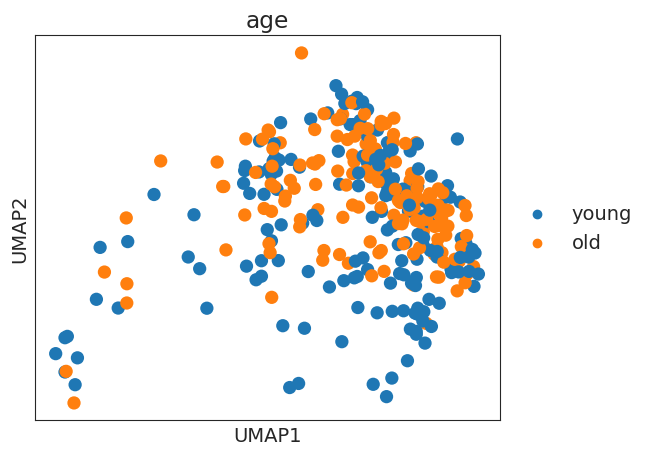

Started Diffxpy Calculation:	15-08-2024 10:17:05
training location model: True
training scale model: True
iter   0: ll=4861979.412223
caught 2 linalg singular matrix errors
iter   1: ll=4722046.927935, converged: 0.00% (loc: 8.11%, scale update: False), in 0.50sec
iter   2: ll=4680842.623251, converged: 0.00% (loc: 8.11%, scale update: False), in 0.49sec
iter   3: ll=4675331.888842, converged: 0.00% (loc: 8.11%, scale update: False), in 0.50sec
iter   4: ll=4675000.697877, converged: 0.00% (loc: 8.11%, scale update: False), in 0.49sec
iter   5: ll=4674986.610673, converged: 0.00% (loc: 8.21%, scale update: False), in 0.64sec
iter   6: ll=1087654.026384, converged: 0.00% (loc: 0.00%, scale update: True), in 7.03sec
caught 2 linalg singular matrix errors
iter   7: ll=1080496.305505, converged: 0.00% (loc: 1.22%, scale update: False), in 1.40sec
iter   8: ll=1079335.544007, converged: 0.00% (loc: 2.47%, scale update: False), in 0.97sec
iter   9: ll=1079216.302823, converged: 0.00% (loc: 7

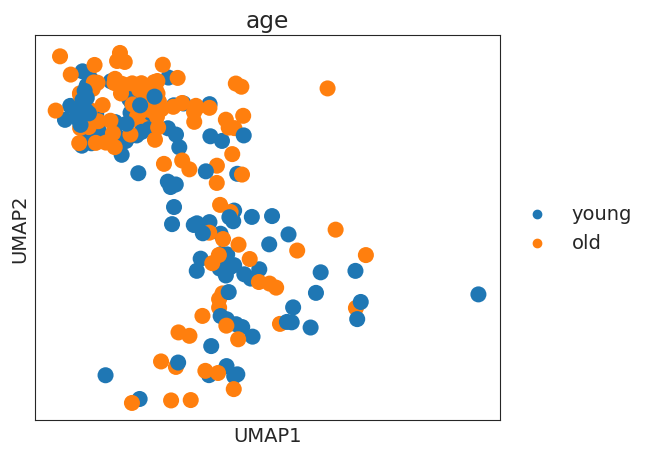

Started Diffxpy Calculation:	15-08-2024 10:18:27
training location model: True
training scale model: True
iter   0: ll=563078.997621
caught 35 linalg singular matrix errors
iter   1: ll=513364.339749, converged: 0.00% (loc: 0.88%, scale update: False), in 0.42sec
iter   2: ll=502305.624996, converged: 0.00% (loc: 0.88%, scale update: False), in 0.43sec
iter   3: ll=501611.201996, converged: 0.00% (loc: 0.88%, scale update: False), in 0.39sec
iter   4: ll=501602.430880, converged: 0.00% (loc: 0.88%, scale update: False), in 0.41sec
iter   5: ll=501602.337157, converged: 0.00% (loc: 5.67%, scale update: False), in 0.40sec
iter   6: ll=468418.663742, converged: 0.00% (loc: 0.00%, scale update: True), in 4.27sec
caught 35 linalg singular matrix errors
iter   7: ll=468297.479888, converged: 0.00% (loc: 0.82%, scale update: False), in 0.43sec
iter   8: ll=468292.049440, converged: 0.00% (loc: 3.60%, scale update: False), in 0.42sec
iter   9: ll=468291.889920, converged: 0.00% (loc: 25.11%, s

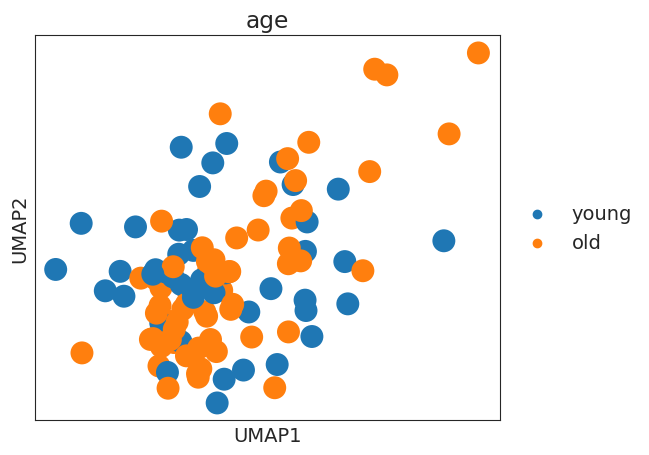

Started Diffxpy Calculation:	15-08-2024 10:19:24
training location model: True
training scale model: True
iter   0: ll=4841514.677351
caught 66 linalg singular matrix errors
iter   1: ll=4784671.379932, converged: 0.00% (loc: 25.79%, scale update: False), in 0.81sec
iter   2: ll=4769006.893539, converged: 0.00% (loc: 25.79%, scale update: False), in 0.83sec
iter   3: ll=4766477.384924, converged: 0.00% (loc: 25.79%, scale update: False), in 0.86sec
iter   4: ll=4766126.546227, converged: 0.00% (loc: 25.79%, scale update: False), in 0.85sec
iter   5: ll=4766081.490666, converged: 0.00% (loc: 25.79%, scale update: False), in 0.58sec
iter   6: ll=452394.866754, converged: 0.00% (loc: 0.00%, scale update: True), in 4.82sec
caught 65 linalg singular matrix errors
iter   7: ll=439922.196906, converged: 0.00% (loc: 2.67%, scale update: False), in 0.41sec
iter   8: ll=436719.000594, converged: 0.00% (loc: 3.67%, scale update: False), in 0.64sec
iter   9: ll=436224.630078, converged: 0.00% (loc

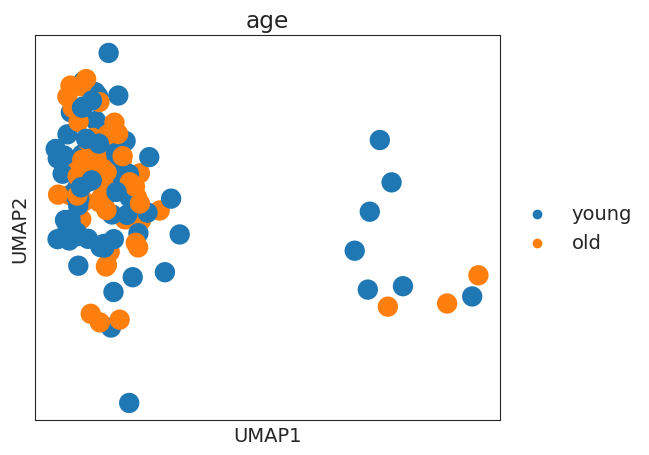

Started Diffxpy Calculation:	15-08-2024 10:20:36
training location model: True
training scale model: True
iter   0: ll=3083309.333746
caught 167 linalg singular matrix errors
iter   1: ll=3026068.221965, converged: 0.00% (loc: 16.92%, scale update: False), in 0.86sec
iter   2: ll=3010298.239307, converged: 0.00% (loc: 16.92%, scale update: False), in 0.73sec
iter   3: ll=3008273.192527, converged: 0.00% (loc: 16.92%, scale update: False), in 0.49sec
iter   4: ll=3008124.011164, converged: 0.00% (loc: 16.92%, scale update: False), in 0.47sec
iter   5: ll=3008113.598986, converged: 0.00% (loc: 16.99%, scale update: False), in 0.77sec
iter   6: ll=472025.532608, converged: 0.00% (loc: 0.00%, scale update: True), in 5.61sec
caught 166 linalg singular matrix errors
iter   7: ll=464397.158730, converged: 0.00% (loc: 4.09%, scale update: False), in 0.82sec
iter   8: ll=462777.812171, converged: 0.00% (loc: 5.28%, scale update: False), in 0.51sec
iter   9: ll=462573.397388, converged: 0.00% (l

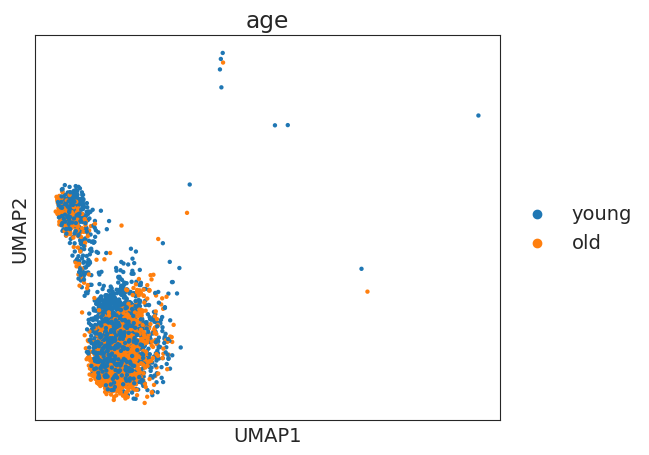

Started Diffxpy Calculation:	15-08-2024 10:21:46
training location model: True
training scale model: True
iter   0: ll=6206957.275164
iter   1: ll=5639764.122644, converged: 0.00% (loc: 0.00%, scale update: False), in 2.75sec
iter   2: ll=5514410.574012, converged: 0.00% (loc: 0.00%, scale update: False), in 2.71sec
iter   3: ll=5507800.834210, converged: 0.00% (loc: 0.00%, scale update: False), in 2.62sec
iter   4: ll=5507773.189537, converged: 0.00% (loc: 0.00%, scale update: False), in 2.43sec
iter   5: ll=5507773.177280, converged: 0.00% (loc: 13.67%, scale update: False), in 2.44sec
iter   6: ll=5394490.712103, converged: 0.00% (loc: 0.00%, scale update: True), in 14.01sec
iter   7: ll=5394222.773543, converged: 0.00% (loc: 0.05%, scale update: False), in 2.22sec
iter   8: ll=5394221.643306, converged: 0.00% (loc: 3.91%, scale update: False), in 1.49sec
iter   9: ll=5394221.639515, converged: 0.00% (loc: 44.91%, scale update: False), in 2.06sec
iter  10: ll=5394221.639500, converg

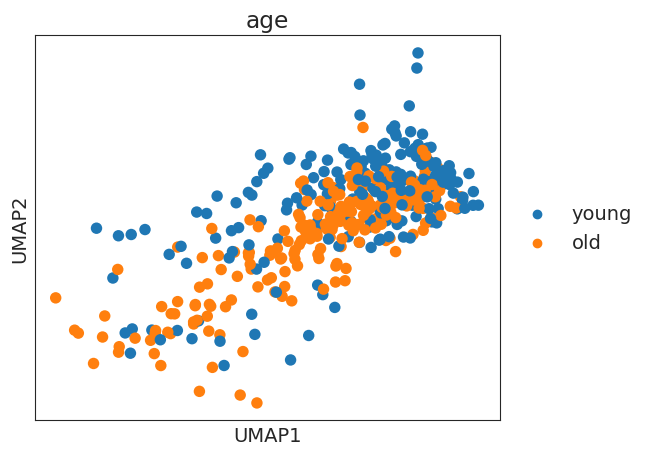

Started Diffxpy Calculation:	15-08-2024 10:23:20
training location model: True
training scale model: True
iter   0: ll=2179452.995601
caught 1 linalg singular matrix errors
iter   1: ll=2033413.380964, converged: 0.00% (loc: 1.98%, scale update: False), in 0.49sec
iter   2: ll=1996717.472511, converged: 0.00% (loc: 1.98%, scale update: False), in 0.50sec
iter   3: ll=1993364.179585, converged: 0.00% (loc: 1.98%, scale update: False), in 0.49sec
iter   4: ll=1993256.272554, converged: 0.00% (loc: 1.98%, scale update: False), in 0.50sec
iter   5: ll=1993253.138352, converged: 0.00% (loc: 2.13%, scale update: False), in 0.66sec
iter   6: ll=1210108.015320, converged: 0.00% (loc: 0.00%, scale update: True), in 5.02sec
caught 1 linalg singular matrix errors
iter   7: ll=1206633.210213, converged: 0.00% (loc: 0.19%, scale update: False), in 0.46sec
iter   8: ll=1205925.941373, converged: 0.00% (loc: 1.70%, scale update: False), in 0.46sec
iter   9: ll=1205883.985136, converged: 0.00% (loc: 1

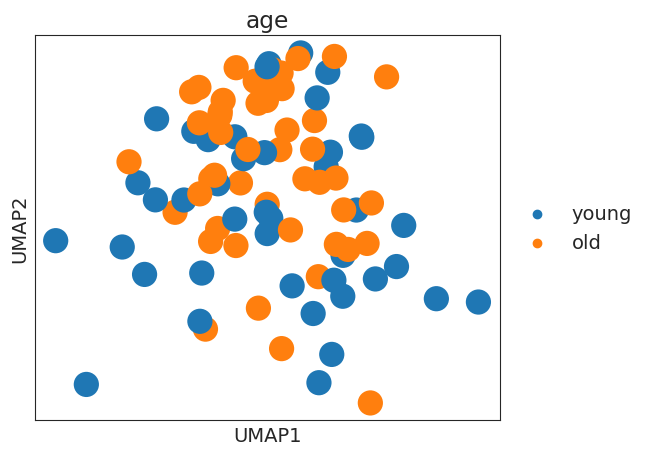

Started Diffxpy Calculation:	15-08-2024 10:24:11
training location model: True
training scale model: True
iter   0: ll=2290454.887614
caught 68 linalg singular matrix errors
iter   1: ll=2249201.658777, converged: 0.00% (loc: 14.35%, scale update: False), in 0.46sec
iter   2: ll=2238663.347277, converged: 0.00% (loc: 14.35%, scale update: False), in 0.42sec
iter   3: ll=2237510.987557, converged: 0.00% (loc: 14.35%, scale update: False), in 0.44sec
iter   4: ll=2237452.503383, converged: 0.00% (loc: 14.35%, scale update: False), in 0.45sec
iter   5: ll=2237450.025724, converged: 0.00% (loc: 14.56%, scale update: False), in 0.45sec
iter   6: ll=359797.850853, converged: 0.00% (loc: 0.00%, scale update: True), in 4.11sec
caught 68 linalg singular matrix errors
iter   7: ll=356798.842820, converged: 0.00% (loc: 4.38%, scale update: False), in 0.43sec
iter   8: ll=356323.606829, converged: 0.00% (loc: 5.88%, scale update: False), in 0.55sec
iter   9: ll=356285.876382, converged: 0.00% (loc

iter  88: ll=258722.250548, converged: 99.59% (loc: 100.00%, scale update: False), in 0.15sec
iter  89: ll=258722.250535, converged: 99.78% (loc: 99.78%, scale update: True), in 0.70sec
iter  90: ll=258722.250525, converged: 99.78% (loc: 99.85%, scale update: False), in 0.19sec
iter  91: ll=258722.250525, converged: 99.78% (loc: 99.93%, scale update: False), in 0.16sec
iter  92: ll=258722.250525, converged: 99.78% (loc: 100.00%, scale update: False), in 0.13sec
iter  93: ll=258722.250517, converged: 99.83% (loc: 99.83%, scale update: True), in 0.68sec
iter  94: ll=258722.250510, converged: 99.83% (loc: 99.87%, scale update: False), in 0.17sec
iter  95: ll=258722.250510, converged: 99.83% (loc: 99.93%, scale update: False), in 0.15sec
iter  96: ll=258722.250510, converged: 99.83% (loc: 100.00%, scale update: False), in 0.13sec
iter  97: ll=258722.250505, converged: 99.87% (loc: 99.87%, scale update: True), in 0.65sec
iter  98: ll=258722.250501, converged: 99.87% (loc: 99.89%, scale upda

In [13]:
subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d3"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")

### day 10

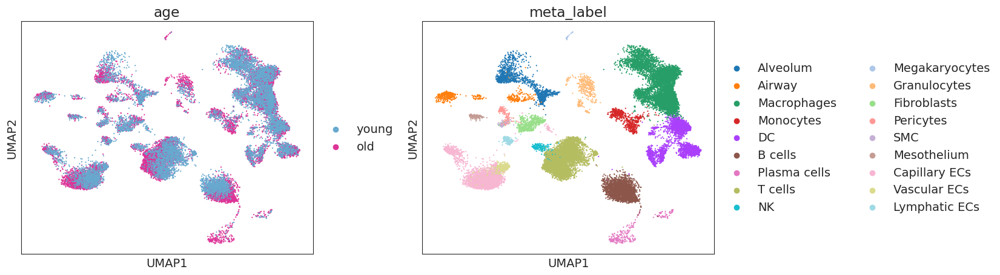

Alveolum - d10
(1250, 5372)


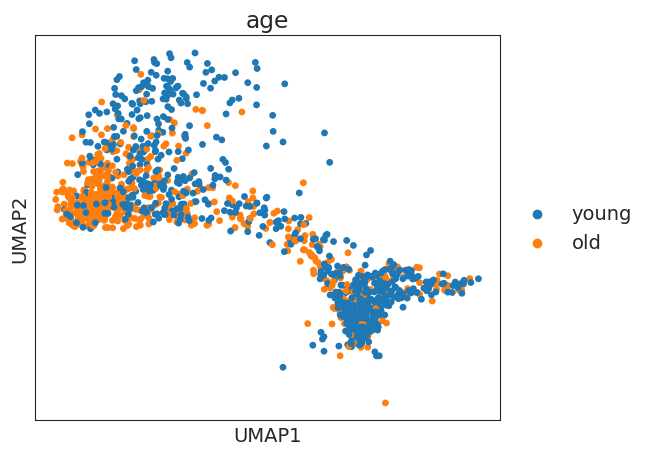

Started Diffxpy Calculation:	15-08-2024 10:25:15
training location model: True
training scale model: True
iter   0: ll=4979602.629433
iter   1: ll=4571831.454730, converged: 0.00% (loc: 0.89%, scale update: False), in 1.39sec
iter   2: ll=4446399.806421, converged: 0.00% (loc: 0.89%, scale update: False), in 1.36sec
iter   3: ll=4429107.534896, converged: 0.00% (loc: 0.89%, scale update: False), in 1.32sec
iter   4: ll=4428093.014373, converged: 0.00% (loc: 0.89%, scale update: False), in 1.37sec
iter   5: ll=4428051.975231, converged: 0.00% (loc: 0.89%, scale update: False), in 1.58sec
iter   6: ll=3377531.942201, converged: 0.00% (loc: 0.00%, scale update: True), in 10.13sec
iter   7: ll=3373854.981331, converged: 0.00% (loc: 0.00%, scale update: False), in 1.30sec
iter   8: ll=3373277.743601, converged: 0.00% (loc: 0.56%, scale update: False), in 1.20sec
iter   9: ll=3373249.312422, converged: 0.00% (loc: 4.80%, scale update: False), in 1.30sec
iter  10: ll=3373248.658513, converged

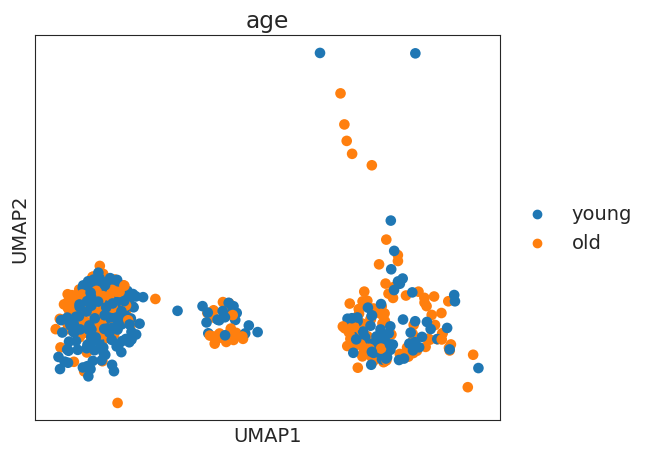

Started Diffxpy Calculation:	15-08-2024 10:26:44
training location model: True
training scale model: True
iter   0: ll=24754848.139110
caught 1 linalg singular matrix errors
iter   1: ll=24221820.446156, converged: 0.00% (loc: 18.33%, scale update: False), in 0.67sec
iter   2: ll=23994058.367202, converged: 0.00% (loc: 18.33%, scale update: False), in 0.64sec
iter   3: ll=23923456.606107, converged: 0.00% (loc: 18.33%, scale update: False), in 0.74sec
iter   4: ll=23907256.958819, converged: 0.00% (loc: 18.33%, scale update: False), in 0.57sec
iter   5: ll=23904506.036870, converged: 0.00% (loc: 18.34%, scale update: False), in 0.60sec
iter   6: ll=2158564.518225, converged: 0.00% (loc: 0.00%, scale update: True), in 9.36sec
caught 1 linalg singular matrix errors
iter   7: ll=2128196.976962, converged: 0.00% (loc: 0.07%, scale update: False), in 0.89sec
iter   8: ll=2122817.014267, converged: 0.00% (loc: 0.37%, scale update: False), in 0.55sec
iter   9: ll=2122004.642220, converged: 0.

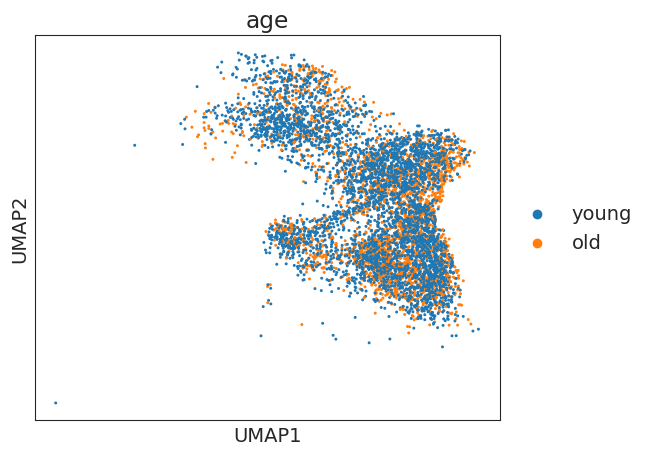

Started Diffxpy Calculation:	15-08-2024 10:28:24
training location model: True
training scale model: True
iter   0: ll=24101524.317856
iter   1: ll=21301527.260269, converged: 0.00% (loc: 0.13%, scale update: False), in 4.04sec
iter   2: ll=20477036.626883, converged: 0.00% (loc: 0.13%, scale update: False), in 2.80sec
iter   3: ll=20372443.255555, converged: 0.00% (loc: 0.13%, scale update: False), in 2.61sec
iter   4: ll=20367384.213888, converged: 0.00% (loc: 0.13%, scale update: False), in 2.81sec
iter   5: ll=20367241.100896, converged: 0.00% (loc: 0.13%, scale update: False), in 2.78sec
iter   6: ll=19451862.746948, converged: 0.00% (loc: 0.00%, scale update: True), in 42.21sec
iter   7: ll=19449197.347492, converged: 0.00% (loc: 0.00%, scale update: False), in 3.07sec
iter   8: ll=19448946.112910, converged: 0.00% (loc: 0.66%, scale update: False), in 3.08sec
iter   9: ll=19448923.209287, converged: 0.00% (loc: 5.71%, scale update: False), in 3.85sec
iter  10: ll=19448922.515612

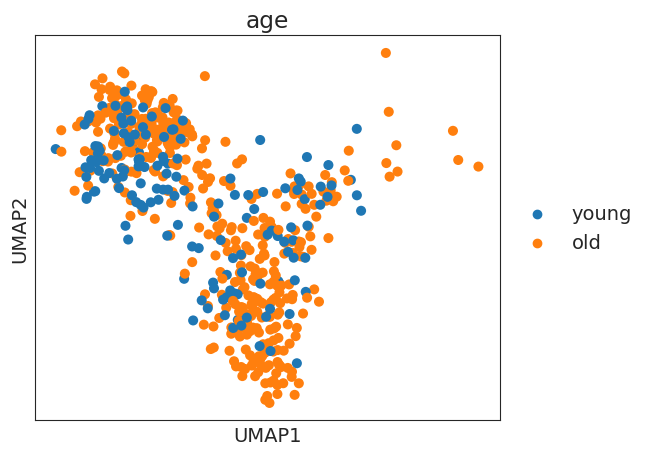

Started Diffxpy Calculation:	15-08-2024 10:32:58
training location model: True
training scale model: True
iter   0: ll=1113974.180267
iter   1: ll=998728.024403, converged: 0.00% (loc: 0.00%, scale update: False), in 0.36sec
iter   2: ll=975302.034201, converged: 0.00% (loc: 0.00%, scale update: False), in 0.40sec
iter   3: ll=974223.218276, converged: 0.00% (loc: 0.00%, scale update: False), in 0.39sec
iter   4: ll=974219.371244, converged: 0.00% (loc: 0.00%, scale update: False), in 0.40sec
iter   5: ll=974219.368040, converged: 0.00% (loc: 31.31%, scale update: False), in 0.38sec
iter   6: ll=958173.137872, converged: 0.00% (loc: 0.00%, scale update: True), in 5.25sec
iter   7: ll=958140.071003, converged: 0.00% (loc: 0.06%, scale update: False), in 0.75sec
iter   8: ll=958139.944823, converged: 0.00% (loc: 7.37%, scale update: False), in 0.65sec
iter   9: ll=958139.944356, converged: 0.00% (loc: 74.12%, scale update: False), in 0.60sec
iter  10: ll=958139.944352, converged: 0.00% (

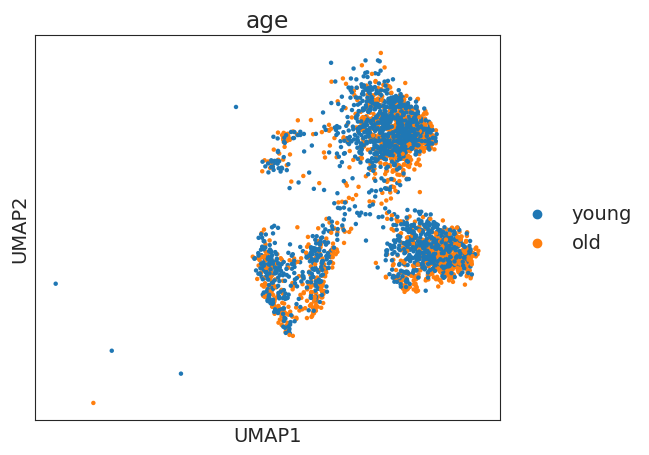

Started Diffxpy Calculation:	15-08-2024 10:33:26
training location model: True
training scale model: True
iter   0: ll=7869514.816295
iter   1: ll=7001709.621704, converged: 0.00% (loc: 0.00%, scale update: False), in 1.47sec
iter   2: ll=6798024.415737, converged: 0.00% (loc: 0.00%, scale update: False), in 1.55sec
iter   3: ll=6783777.360906, converged: 0.00% (loc: 0.00%, scale update: False), in 1.42sec
iter   4: ll=6783595.826176, converged: 0.00% (loc: 0.00%, scale update: False), in 1.70sec
iter   5: ll=6783594.928133, converged: 0.00% (loc: 0.20%, scale update: False), in 1.62sec
iter   6: ll=6742733.993064, converged: 0.00% (loc: 0.00%, scale update: True), in 20.54sec
iter   7: ll=6742067.971787, converged: 0.00% (loc: 0.04%, scale update: False), in 1.45sec
iter   8: ll=6742060.256535, converged: 0.00% (loc: 2.45%, scale update: False), in 1.41sec
iter   9: ll=6742060.185012, converged: 0.00% (loc: 12.33%, scale update: False), in 1.32sec
iter  10: ll=6742060.184306, converge

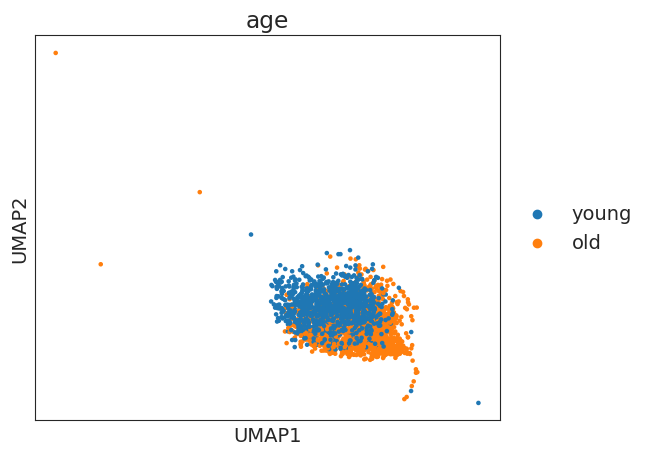

Started Diffxpy Calculation:	15-08-2024 10:35:18
training location model: True
training scale model: True
iter   0: ll=3827822.313597
iter   1: ll=3431981.275950, converged: 0.00% (loc: 0.00%, scale update: False), in 1.76sec
iter   2: ll=3339859.931331, converged: 0.00% (loc: 0.00%, scale update: False), in 1.61sec
iter   3: ll=3334737.073153, converged: 0.00% (loc: 0.00%, scale update: False), in 1.67sec
iter   4: ll=3334718.741476, converged: 0.00% (loc: 0.00%, scale update: False), in 1.45sec
iter   5: ll=3334718.738476, converged: 0.00% (loc: 17.65%, scale update: False), in 1.70sec
iter   6: ll=3259624.520216, converged: 0.00% (loc: 0.00%, scale update: True), in 13.59sec
iter   7: ll=3259527.859432, converged: 0.00% (loc: 0.00%, scale update: False), in 1.37sec
iter   8: ll=3259527.639543, converged: 0.00% (loc: 5.49%, scale update: False), in 1.21sec
iter   9: ll=3259527.639108, converged: 0.00% (loc: 84.88%, scale update: False), in 0.99sec
iter  10: ll=3259527.639106, converg

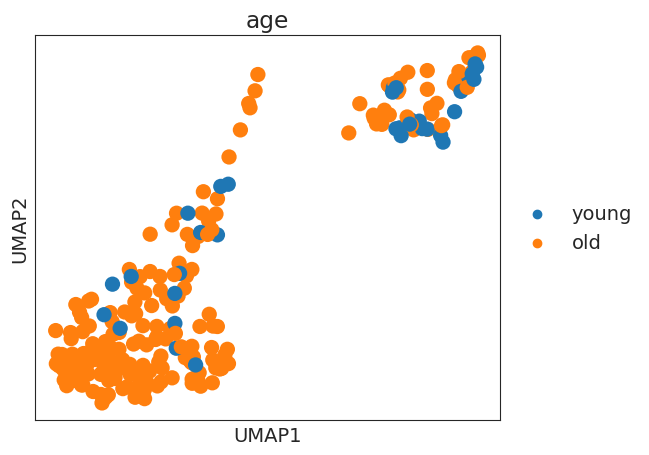

Started Diffxpy Calculation:	15-08-2024 10:36:17
training location model: True
training scale model: True
iter   0: ll=4562859.366031
caught 157 linalg singular matrix errors
iter   1: ll=4501510.790037, converged: 0.00% (loc: 26.90%, scale update: False), in 0.24sec
iter   2: ll=4480797.487160, converged: 0.00% (loc: 26.90%, scale update: False), in 0.23sec
iter   3: ll=4477022.350237, converged: 0.00% (loc: 26.90%, scale update: False), in 0.26sec
iter   4: ll=4476665.957969, converged: 0.00% (loc: 26.90%, scale update: False), in 0.25sec
iter   5: ll=4476639.498644, converged: 0.00% (loc: 27.07%, scale update: False), in 0.26sec
iter   6: ll=445649.065232, converged: 0.00% (loc: 0.00%, scale update: True), in 2.31sec
caught 148 linalg singular matrix errors
iter   7: ll=439633.099126, converged: 0.00% (loc: 8.18%, scale update: False), in 0.27sec
iter   8: ll=438578.972087, converged: 0.00% (loc: 10.33%, scale update: False), in 0.28sec
iter   9: ll=438467.835666, converged: 0.00% (

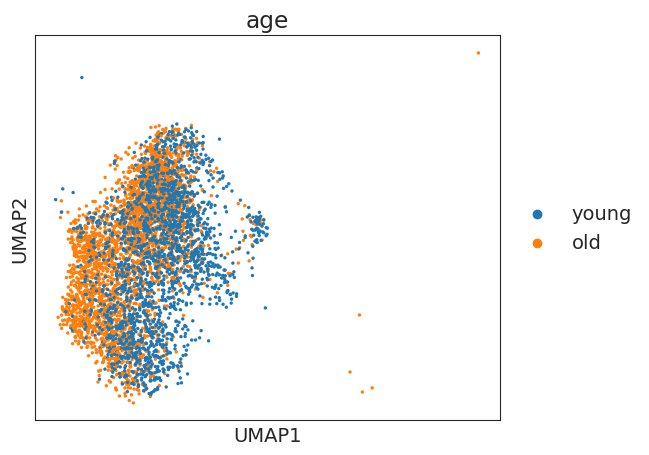

Started Diffxpy Calculation:	15-08-2024 10:36:54
training location model: True
training scale model: True
iter   0: ll=7691185.293338
iter   1: ll=6934097.163608, converged: 0.00% (loc: 0.00%, scale update: False), in 2.29sec
iter   2: ll=6764595.556808, converged: 0.00% (loc: 0.00%, scale update: False), in 1.70sec
iter   3: ll=6755745.754449, converged: 0.00% (loc: 0.00%, scale update: False), in 1.92sec
iter   4: ll=6755715.222517, converged: 0.00% (loc: 0.00%, scale update: False), in 1.76sec
iter   5: ll=6755715.216812, converged: 0.00% (loc: 28.03%, scale update: False), in 1.31sec
iter   6: ll=6628794.370636, converged: 0.00% (loc: 0.00%, scale update: True), in 15.08sec
iter   7: ll=6628643.333176, converged: 0.00% (loc: 0.03%, scale update: False), in 1.56sec
iter   8: ll=6628642.371734, converged: 0.00% (loc: 12.85%, scale update: False), in 1.63sec
iter   9: ll=6628642.361182, converged: 0.00% (loc: 88.01%, scale update: False), in 1.26sec
iter  10: ll=6628642.360873, conver

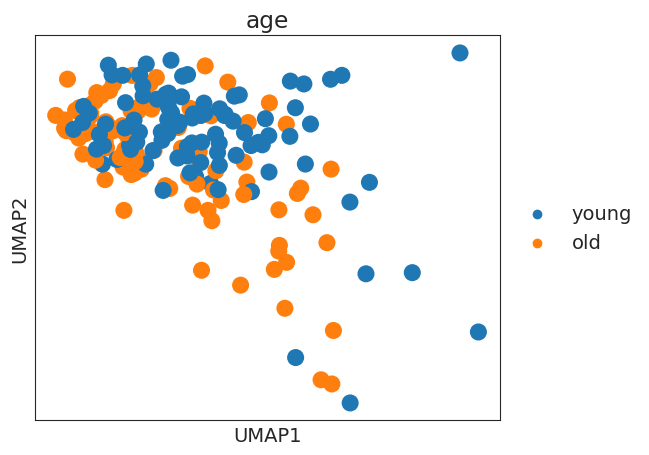

Started Diffxpy Calculation:	15-08-2024 10:38:22
training location model: True
training scale model: True
iter   0: ll=270907.170677
caught 35 linalg singular matrix errors
iter   1: ll=243158.415689, converged: 0.00% (loc: 1.23%, scale update: False), in 0.37sec
iter   2: ll=236589.556136, converged: 0.00% (loc: 1.23%, scale update: False), in 0.65sec
iter   3: ll=236189.656499, converged: 0.00% (loc: 1.23%, scale update: False), in 0.97sec
iter   4: ll=236187.256130, converged: 0.00% (loc: 1.27%, scale update: False), in 0.32sec
iter   5: ll=236187.253380, converged: 0.00% (loc: 15.82%, scale update: False), in 0.31sec
iter   6: ll=225838.558633, converged: 0.04% (loc: 0.04%, scale update: True), in 2.89sec
caught 34 linalg singular matrix errors
iter   7: ll=225810.916804, converged: 0.04% (loc: 4.09%, scale update: False), in 0.28sec
iter   8: ll=225810.774105, converged: 0.04% (loc: 12.47%, scale update: False), in 0.30sec
iter   9: ll=225810.773395, converged: 0.04% (loc: 77.63%,

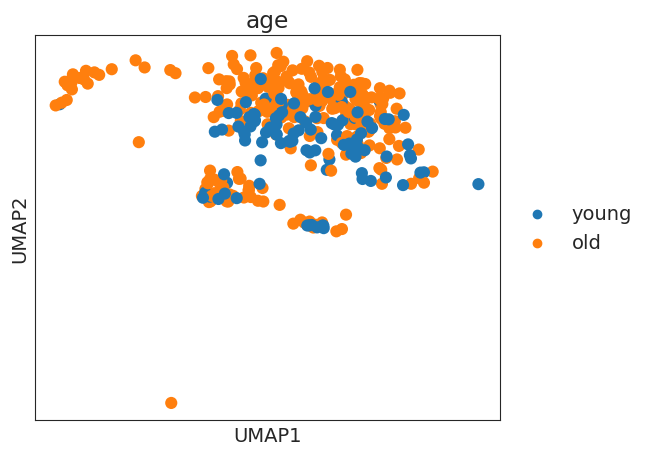

Started Diffxpy Calculation:	15-08-2024 10:38:42
training location model: True
training scale model: True
iter   0: ll=414888.185082
caught 7 linalg singular matrix errors
iter   1: ll=370850.454756, converged: 0.00% (loc: 0.37%, scale update: False), in 0.20sec
iter   2: ll=359381.337463, converged: 0.00% (loc: 0.37%, scale update: False), in 0.21sec
iter   3: ll=358558.290973, converged: 0.00% (loc: 0.37%, scale update: False), in 0.22sec
iter   4: ll=358551.950838, converged: 0.00% (loc: 0.37%, scale update: False), in 0.24sec
iter   5: ll=358551.947501, converged: 0.00% (loc: 5.68%, scale update: False), in 0.25sec
iter   6: ll=349595.416574, converged: 0.00% (loc: 0.00%, scale update: True), in 2.07sec
caught 7 linalg singular matrix errors
iter   7: ll=349583.449977, converged: 0.00% (loc: 0.85%, scale update: False), in 0.26sec
iter   8: ll=349583.404229, converged: 0.00% (loc: 12.47%, scale update: False), in 0.27sec
iter   9: ll=349583.403969, converged: 0.00% (loc: 88.06%, sc

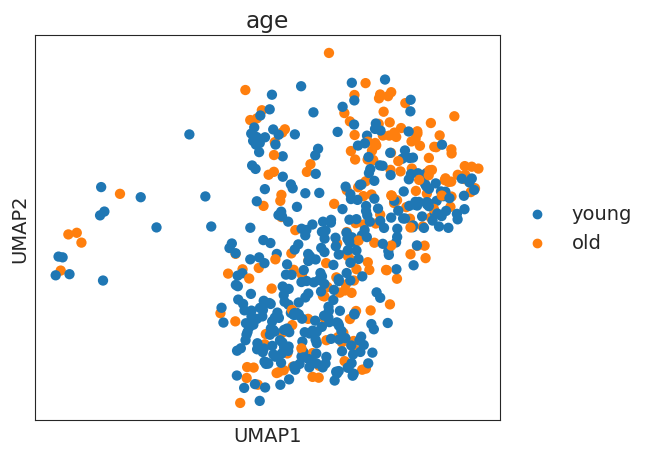

Started Diffxpy Calculation:	15-08-2024 10:38:55
training location model: True
training scale model: True
iter   0: ll=6516595.504752
caught 1 linalg singular matrix errors
iter   1: ll=6228137.691686, converged: 0.00% (loc: 5.68%, scale update: False), in 0.55sec
iter   2: ll=6130116.224063, converged: 0.00% (loc: 5.68%, scale update: False), in 0.60sec
iter   3: ll=6111604.473028, converged: 0.00% (loc: 5.68%, scale update: False), in 0.58sec
iter   4: ll=6109421.308748, converged: 0.00% (loc: 5.68%, scale update: False), in 0.69sec
iter   5: ll=6109194.091473, converged: 0.00% (loc: 5.71%, scale update: False), in 0.53sec
iter   6: ll=1870973.164486, converged: 0.00% (loc: 0.00%, scale update: True), in 6.74sec
caught 1 linalg singular matrix errors
iter   7: ll=1859124.672749, converged: 0.00% (loc: 0.08%, scale update: False), in 0.56sec
iter   8: ll=1857647.952342, converged: 0.00% (loc: 0.93%, scale update: False), in 0.70sec
iter   9: ll=1857511.694231, converged: 0.00% (loc: 3

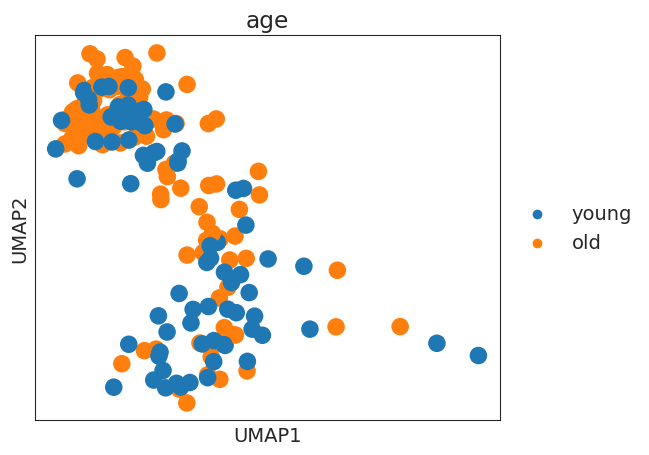

Started Diffxpy Calculation:	15-08-2024 10:40:11
training location model: True
training scale model: True
iter   0: ll=792591.063735
caught 54 linalg singular matrix errors
iter   1: ll=742334.068169, converged: 0.00% (loc: 2.91%, scale update: False), in 1.07sec
iter   2: ll=731015.568008, converged: 0.00% (loc: 2.91%, scale update: False), in 0.77sec
iter   3: ll=730215.843146, converged: 0.00% (loc: 2.91%, scale update: False), in 0.89sec
iter   4: ll=730198.467595, converged: 0.00% (loc: 2.92%, scale update: False), in 0.75sec
iter   5: ll=730197.934620, converged: 0.00% (loc: 5.23%, scale update: False), in 0.49sec
iter   6: ll=451389.925272, converged: 0.00% (loc: 0.00%, scale update: True), in 5.62sec
caught 54 linalg singular matrix errors
iter   7: ll=450561.791580, converged: 0.00% (loc: 1.34%, scale update: False), in 0.60sec
iter   8: ll=450429.992061, converged: 0.00% (loc: 4.23%, scale update: False), in 0.68sec
iter   9: ll=450408.230257, converged: 0.00% (loc: 22.22%, s

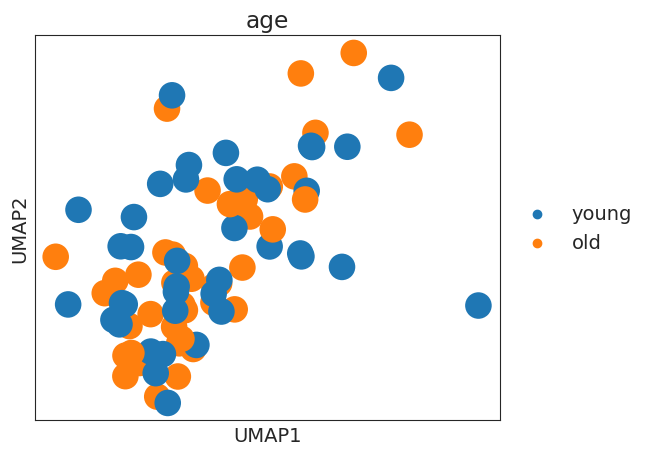

Started Diffxpy Calculation:	15-08-2024 10:41:10
training location model: True
training scale model: True
iter   0: ll=1328820.561985
caught 52 linalg singular matrix errors
iter   1: ll=1300219.567670, converged: 0.00% (loc: 12.34%, scale update: False), in 0.48sec
iter   2: ll=1293931.534641, converged: 0.00% (loc: 12.34%, scale update: False), in 0.58sec
iter   3: ll=1293464.604590, converged: 0.00% (loc: 12.34%, scale update: False), in 0.57sec
iter   4: ll=1293453.363441, converged: 0.00% (loc: 12.34%, scale update: False), in 0.72sec
iter   5: ll=1293453.122542, converged: 0.00% (loc: 13.77%, scale update: False), in 0.67sec
iter   6: ll=231687.318425, converged: 0.00% (loc: 0.00%, scale update: True), in 4.50sec
caught 52 linalg singular matrix errors
iter   7: ll=230515.451645, converged: 0.00% (loc: 5.31%, scale update: False), in 0.74sec
iter   8: ll=230370.921635, converged: 0.00% (loc: 8.85%, scale update: False), in 0.80sec
iter   9: ll=230365.316137, converged: 0.00% (loc

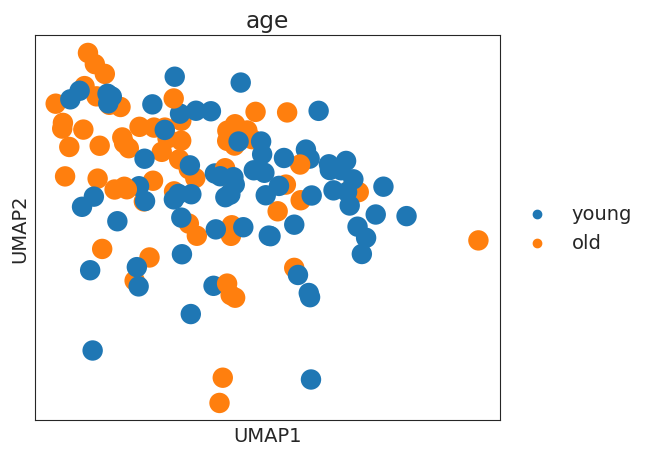

Started Diffxpy Calculation:	15-08-2024 10:41:55
training location model: True
training scale model: True
iter   0: ll=2347952.931518
caught 67 linalg singular matrix errors
iter   1: ll=2292178.061044, converged: 0.00% (loc: 12.25%, scale update: False), in 0.46sec
iter   2: ll=2276777.646610, converged: 0.00% (loc: 12.25%, scale update: False), in 0.46sec
iter   3: ll=2274766.980705, converged: 0.00% (loc: 12.25%, scale update: False), in 0.42sec
iter   4: ll=2274621.668257, converged: 0.00% (loc: 12.25%, scale update: False), in 0.62sec
iter   5: ll=2274612.397475, converged: 0.00% (loc: 12.28%, scale update: False), in 0.50sec
iter   6: ll=437409.993930, converged: 0.00% (loc: 0.00%, scale update: True), in 4.81sec
caught 65 linalg singular matrix errors
iter   7: ll=432657.735553, converged: 0.00% (loc: 2.55%, scale update: False), in 0.55sec
iter   8: ll=431598.918332, converged: 0.00% (loc: 3.18%, scale update: False), in 0.55sec
iter   9: ll=431475.601867, converged: 0.00% (loc

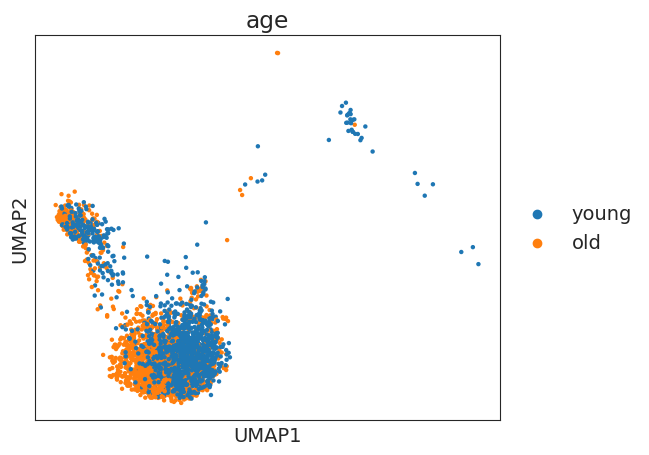

Started Diffxpy Calculation:	15-08-2024 10:43:03
training location model: True
training scale model: True
iter   0: ll=6930124.744444
iter   1: ll=6272821.112619, converged: 0.00% (loc: 0.00%, scale update: False), in 1.53sec
iter   2: ll=6126584.538420, converged: 0.00% (loc: 0.00%, scale update: False), in 1.36sec
iter   3: ll=6118252.787114, converged: 0.00% (loc: 0.00%, scale update: False), in 1.48sec
iter   4: ll=6118201.923475, converged: 0.00% (loc: 0.00%, scale update: False), in 1.48sec
iter   5: ll=6118201.865760, converged: 0.00% (loc: 1.43%, scale update: False), in 1.62sec
iter   6: ll=6008864.906482, converged: 0.00% (loc: 0.00%, scale update: True), in 17.00sec
iter   7: ll=6008161.829706, converged: 0.00% (loc: 0.02%, scale update: False), in 1.34sec
iter   8: ll=6008156.394961, converged: 0.00% (loc: 1.83%, scale update: False), in 1.30sec
iter   9: ll=6008156.363679, converged: 0.00% (loc: 14.22%, scale update: False), in 1.55sec
iter  10: ll=6008156.363485, converge

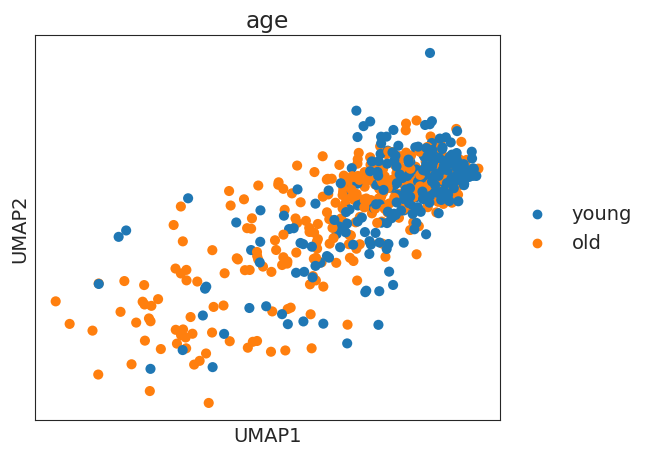

Started Diffxpy Calculation:	15-08-2024 10:44:35
training location model: True
training scale model: True
iter   0: ll=1844668.319671
iter   1: ll=1666028.571117, converged: 0.00% (loc: 0.36%, scale update: False), in 0.52sec
iter   2: ll=1623554.249645, converged: 0.00% (loc: 0.36%, scale update: False), in 0.66sec
iter   3: ll=1620230.853056, converged: 0.00% (loc: 0.36%, scale update: False), in 0.52sec
iter   4: ll=1620163.682372, converged: 0.00% (loc: 0.36%, scale update: False), in 0.44sec
iter   5: ll=1620162.752680, converged: 0.00% (loc: 0.61%, scale update: False), in 0.47sec
iter   6: ll=1439375.004795, converged: 0.00% (loc: 0.00%, scale update: True), in 5.74sec
iter   7: ll=1438593.919168, converged: 0.00% (loc: 0.10%, scale update: False), in 0.45sec
iter   8: ll=1438500.954208, converged: 0.00% (loc: 1.78%, scale update: False), in 0.64sec
iter   9: ll=1438498.770166, converged: 0.00% (loc: 11.16%, scale update: False), in 0.48sec
iter  10: ll=1438498.759276, converged

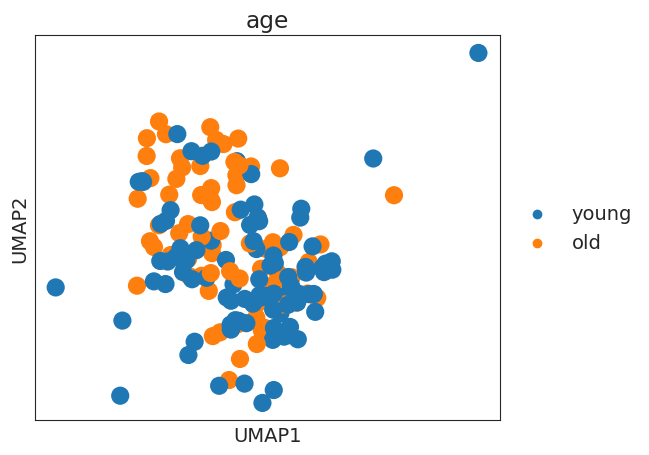

Started Diffxpy Calculation:	15-08-2024 10:45:21
training location model: True
training scale model: True
iter   0: ll=3259098.056876
caught 72 linalg singular matrix errors
iter   1: ll=3161015.612557, converged: 0.00% (loc: 10.45%, scale update: False), in 0.52sec
iter   2: ll=3128938.150954, converged: 0.00% (loc: 10.45%, scale update: False), in 0.73sec
iter   3: ll=3123067.227613, converged: 0.00% (loc: 10.45%, scale update: False), in 0.56sec
iter   4: ll=3122372.085191, converged: 0.00% (loc: 10.45%, scale update: False), in 0.56sec
iter   5: ll=3122298.922459, converged: 0.00% (loc: 10.45%, scale update: False), in 0.57sec
iter   6: ll=702455.396414, converged: 0.00% (loc: 0.00%, scale update: True), in 4.82sec
caught 72 linalg singular matrix errors
iter   7: ll=695832.344647, converged: 0.00% (loc: 1.82%, scale update: False), in 0.59sec
iter   8: ll=694345.852954, converged: 0.00% (loc: 2.24%, scale update: False), in 0.61sec
iter   9: ll=694181.122173, converged: 0.00% (loc

iter  87: ll=616452.047406, converged: 99.74% (loc: 99.95%, scale update: False), in 0.17sec
iter  88: ll=616452.047406, converged: 99.74% (loc: 99.97%, scale update: False), in 0.12sec
iter  89: ll=616452.047406, converged: 99.74% (loc: 99.98%, scale update: False), in 0.12sec
iter  90: ll=616452.047101, converged: 99.80% (loc: 99.80%, scale update: True), in 0.82sec
iter  91: ll=616452.046854, converged: 99.80% (loc: 99.85%, scale update: False), in 0.20sec
iter  92: ll=616452.046848, converged: 99.80% (loc: 99.89%, scale update: False), in 0.17sec
iter  93: ll=616452.046847, converged: 99.80% (loc: 99.95%, scale update: False), in 0.17sec
iter  94: ll=616452.046847, converged: 99.80% (loc: 99.97%, scale update: False), in 0.11sec
iter  95: ll=616452.046847, converged: 99.80% (loc: 99.98%, scale update: False), in 0.12sec
iter  96: ll=616452.046634, converged: 99.85% (loc: 99.85%, scale update: True), in 0.78sec
iter  97: ll=616452.046459, converged: 99.85% (loc: 99.88%, scale update

In [14]:
subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d10"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")
    

 ## day 20

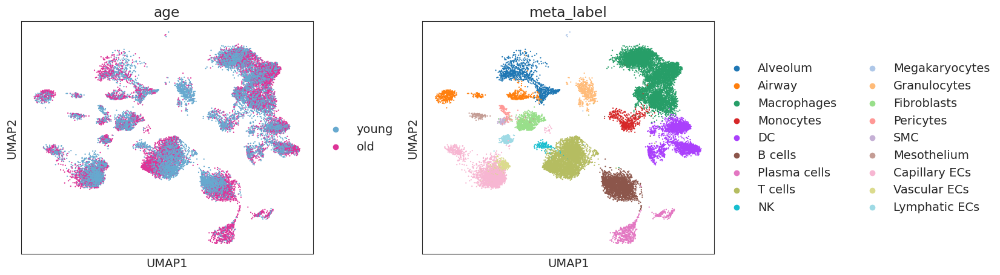

Alveolum - d20
(1068, 4746)


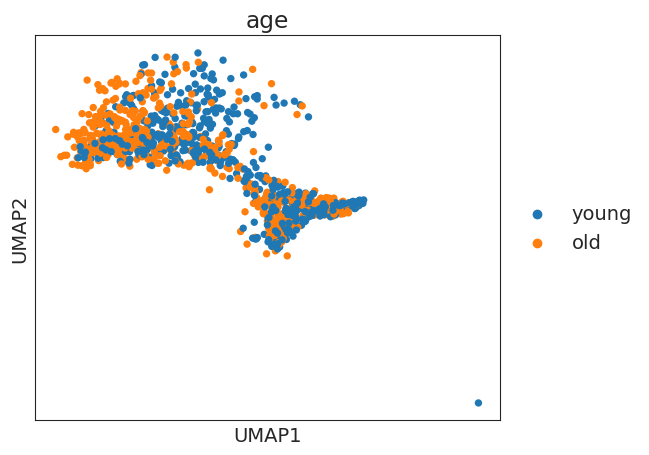

Started Diffxpy Calculation:	15-08-2024 10:46:36
training location model: True
training scale model: True
iter   0: ll=4051899.364964
iter   1: ll=3707141.403223, converged: 0.00% (loc: 0.97%, scale update: False), in 1.04sec
iter   2: ll=3610283.939651, converged: 0.00% (loc: 0.97%, scale update: False), in 1.38sec
iter   3: ll=3598274.909128, converged: 0.00% (loc: 0.97%, scale update: False), in 0.99sec
iter   4: ll=3597560.792087, converged: 0.00% (loc: 0.97%, scale update: False), in 1.14sec
iter   5: ll=3597523.593699, converged: 0.00% (loc: 1.12%, scale update: False), in 1.78sec
iter   6: ll=2637549.137287, converged: 0.00% (loc: 0.00%, scale update: True), in 8.72sec
iter   7: ll=2634032.573910, converged: 0.00% (loc: 0.02%, scale update: False), in 1.06sec
iter   8: ll=2633585.884025, converged: 0.00% (loc: 1.16%, scale update: False), in 1.30sec
iter   9: ll=2633562.587847, converged: 0.00% (loc: 6.83%, scale update: False), in 1.37sec
iter  10: ll=2633559.429390, converged:

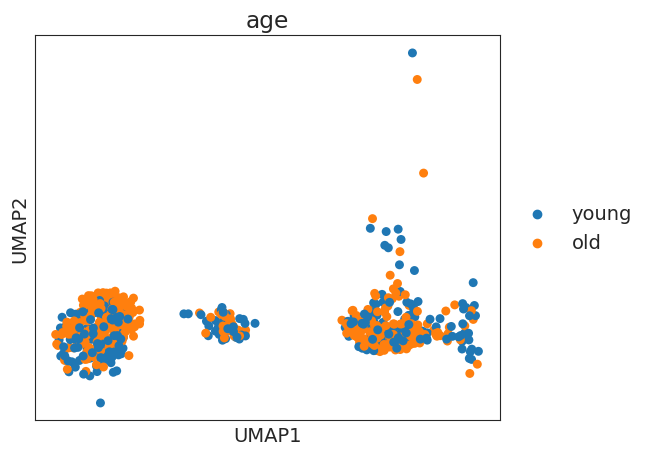

Started Diffxpy Calculation:	15-08-2024 10:47:58
training location model: True
training scale model: True
iter   0: ll=11253840.461122
iter   1: ll=10762733.191271, converged: 0.00% (loc: 6.96%, scale update: False), in 0.54sec
iter   2: ll=10582394.206697, converged: 0.00% (loc: 6.96%, scale update: False), in 0.70sec
iter   3: ll=10540201.813624, converged: 0.00% (loc: 6.96%, scale update: False), in 0.54sec
iter   4: ll=10533514.150121, converged: 0.00% (loc: 6.96%, scale update: False), in 0.55sec
iter   5: ll=10532706.950849, converged: 0.00% (loc: 6.96%, scale update: False), in 0.55sec
iter   6: ll=2549580.909499, converged: 0.00% (loc: 0.00%, scale update: True), in 10.19sec
iter   7: ll=2528658.469117, converged: 0.00% (loc: 0.00%, scale update: False), in 1.40sec
iter   8: ll=2525774.882989, converged: 0.00% (loc: 0.46%, scale update: False), in 1.21sec
iter   9: ll=2525538.620127, converged: 0.00% (loc: 1.47%, scale update: False), in 1.65sec
iter  10: ll=2525526.064418, con

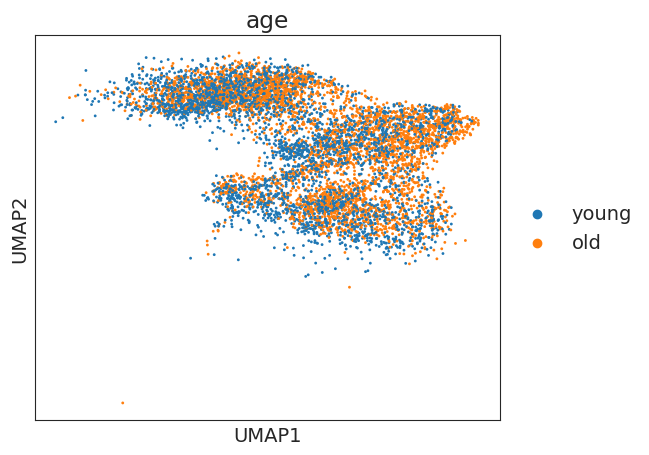

Started Diffxpy Calculation:	15-08-2024 10:49:20
training location model: True
training scale model: True
iter   0: ll=20780675.911365
iter   1: ll=18493799.118918, converged: 0.00% (loc: 0.00%, scale update: False), in 2.75sec
iter   2: ll=17918659.678732, converged: 0.00% (loc: 0.00%, scale update: False), in 2.82sec
iter   3: ll=17867767.635309, converged: 0.00% (loc: 0.00%, scale update: False), in 2.43sec
iter   4: ll=17866512.955515, converged: 0.00% (loc: 0.00%, scale update: False), in 2.53sec
iter   5: ll=17866496.780903, converged: 0.00% (loc: 0.24%, scale update: False), in 2.42sec
iter   6: ll=17813451.371478, converged: 0.00% (loc: 0.00%, scale update: True), in 36.33sec
iter   7: ll=17812358.519573, converged: 0.00% (loc: 0.00%, scale update: False), in 3.64sec
iter   8: ll=17812335.776392, converged: 0.00% (loc: 2.09%, scale update: False), in 2.94sec
iter   9: ll=17812335.317779, converged: 0.00% (loc: 12.71%, scale update: False), in 2.46sec
iter  10: ll=17812335.30797

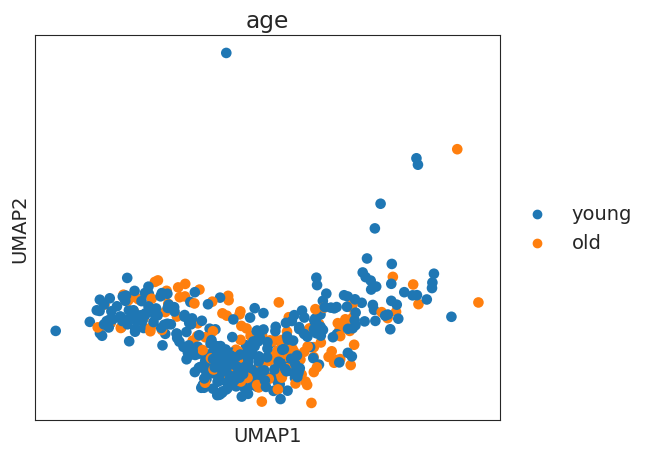

Started Diffxpy Calculation:	15-08-2024 10:53:14
training location model: True
training scale model: True
iter   0: ll=832403.351715
iter   1: ll=750740.296186, converged: 0.00% (loc: 0.00%, scale update: False), in 0.36sec
iter   2: ll=732650.005293, converged: 0.00% (loc: 0.00%, scale update: False), in 0.83sec
iter   3: ll=731722.371013, converged: 0.00% (loc: 0.00%, scale update: False), in 0.33sec
iter   4: ll=731719.021011, converged: 0.00% (loc: 0.00%, scale update: False), in 0.31sec
iter   5: ll=731719.019090, converged: 0.00% (loc: 32.89%, scale update: False), in 0.32sec
iter   6: ll=711685.562698, converged: 0.00% (loc: 0.00%, scale update: True), in 3.88sec
iter   7: ll=711647.920386, converged: 0.00% (loc: 0.19%, scale update: False), in 0.76sec
iter   8: ll=711647.783087, converged: 0.00% (loc: 8.00%, scale update: False), in 0.32sec
iter   9: ll=711647.782821, converged: 0.00% (loc: 83.52%, scale update: False), in 0.34sec
iter  10: ll=711647.782820, converged: 0.00% (l

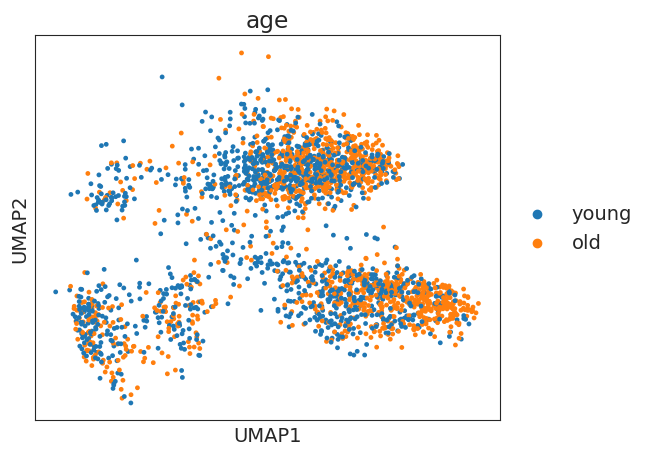

Started Diffxpy Calculation:	15-08-2024 10:53:44
training location model: True
training scale model: True
iter   0: ll=5486086.325980
iter   1: ll=4917316.612421, converged: 0.00% (loc: 0.00%, scale update: False), in 1.46sec
iter   2: ll=4795342.637316, converged: 0.00% (loc: 0.00%, scale update: False), in 1.62sec
iter   3: ll=4788789.134777, converged: 0.00% (loc: 0.00%, scale update: False), in 1.12sec
iter   4: ll=4788750.766523, converged: 0.00% (loc: 0.00%, scale update: False), in 1.05sec
iter   5: ll=4788750.712834, converged: 0.00% (loc: 2.73%, scale update: False), in 1.23sec
iter   6: ll=4731902.611301, converged: 0.00% (loc: 0.00%, scale update: True), in 11.47sec
iter   7: ll=4731519.982752, converged: 0.00% (loc: 0.05%, scale update: False), in 1.15sec
iter   8: ll=4731517.498716, converged: 0.00% (loc: 3.13%, scale update: False), in 1.14sec
iter   9: ll=4731517.486117, converged: 0.00% (loc: 21.79%, scale update: False), in 1.14sec
iter  10: ll=4731517.486046, converge

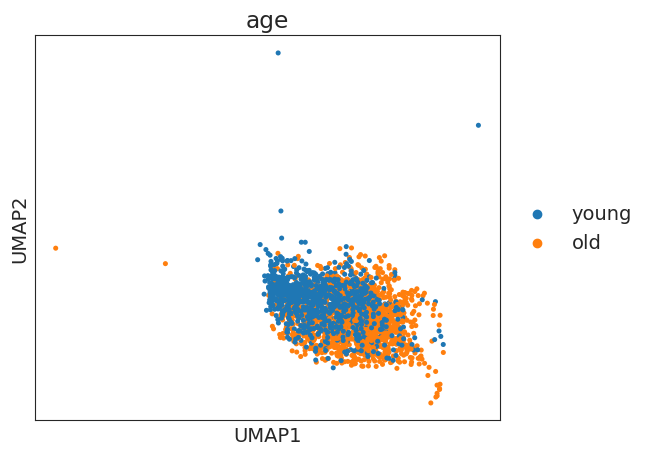

Started Diffxpy Calculation:	15-08-2024 10:55:03
training location model: True
training scale model: True
iter   0: ll=2619493.348744
iter   1: ll=2344797.338350, converged: 0.00% (loc: 0.00%, scale update: False), in 0.87sec
iter   2: ll=2272754.201620, converged: 0.00% (loc: 0.00%, scale update: False), in 0.82sec
iter   3: ll=2267866.785954, converged: 0.00% (loc: 0.00%, scale update: False), in 0.92sec
iter   4: ll=2267842.405687, converged: 0.00% (loc: 0.00%, scale update: False), in 0.94sec
iter   5: ll=2267842.402407, converged: 0.00% (loc: 10.32%, scale update: False), in 0.91sec
iter   6: ll=2200466.524440, converged: 0.00% (loc: 0.00%, scale update: True), in 6.52sec
iter   7: ll=2200383.476095, converged: 0.00% (loc: 0.00%, scale update: False), in 0.91sec
iter   8: ll=2200383.157638, converged: 0.00% (loc: 13.97%, scale update: False), in 0.97sec
iter   9: ll=2200383.156256, converged: 0.00% (loc: 90.22%, scale update: False), in 0.79sec
iter  10: ll=2200383.156203, converg

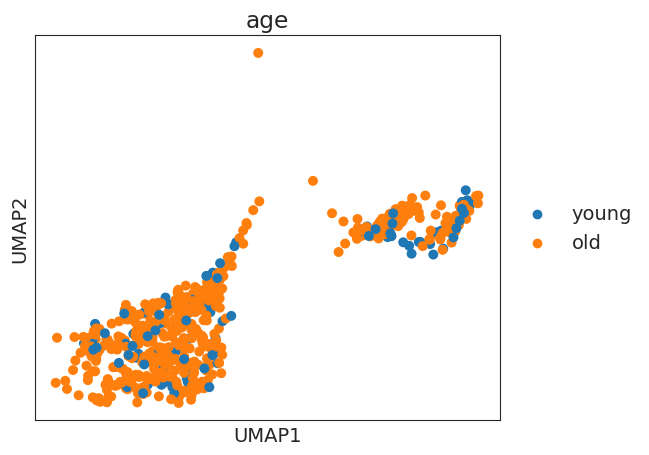

Started Diffxpy Calculation:	15-08-2024 10:55:42
training location model: True
training scale model: True
iter   0: ll=1090853.350717
caught 4 linalg singular matrix errors
iter   1: ll=1016013.185797, converged: 0.00% (loc: 3.42%, scale update: False), in 0.23sec
iter   2: ll=998560.524270, converged: 0.00% (loc: 3.42%, scale update: False), in 0.23sec
iter   3: ll=997200.904126, converged: 0.00% (loc: 3.42%, scale update: False), in 0.23sec
iter   4: ll=997168.938859, converged: 0.00% (loc: 3.42%, scale update: False), in 0.24sec
iter   5: ll=997168.075642, converged: 0.00% (loc: 4.39%, scale update: False), in 0.25sec
iter   6: ll=589637.635620, converged: 0.00% (loc: 0.00%, scale update: True), in 2.66sec
caught 4 linalg singular matrix errors
iter   7: ll=588896.500565, converged: 0.00% (loc: 0.88%, scale update: False), in 0.24sec
iter   8: ll=588789.073294, converged: 0.00% (loc: 4.21%, scale update: False), in 0.24sec
iter   9: ll=588783.599774, converged: 0.00% (loc: 24.01%, s

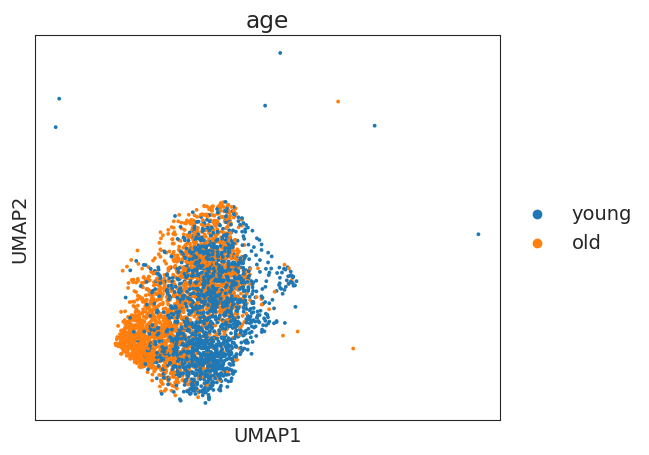

Started Diffxpy Calculation:	15-08-2024 10:56:09
training location model: True
training scale model: True
iter   0: ll=4721639.696275
iter   1: ll=4229038.337554, converged: 0.00% (loc: 0.00%, scale update: False), in 1.14sec
iter   2: ll=4104039.408773, converged: 0.00% (loc: 0.00%, scale update: False), in 1.16sec
iter   3: ll=4096137.847364, converged: 0.00% (loc: 0.00%, scale update: False), in 0.95sec
iter   4: ll=4096105.703691, converged: 0.00% (loc: 0.00%, scale update: False), in 1.30sec
iter   5: ll=4096105.701895, converged: 0.00% (loc: 19.53%, scale update: False), in 1.52sec
iter   6: ll=3987840.679542, converged: 0.00% (loc: 0.00%, scale update: True), in 11.29sec
iter   7: ll=3987751.890641, converged: 0.00% (loc: 0.00%, scale update: False), in 1.09sec
iter   8: ll=3987751.709177, converged: 0.00% (loc: 19.84%, scale update: False), in 1.23sec
iter   9: ll=3987751.708855, converged: 0.00% (loc: 95.68%, scale update: False), in 0.93sec
iter  10: ll=3987751.708854, conver

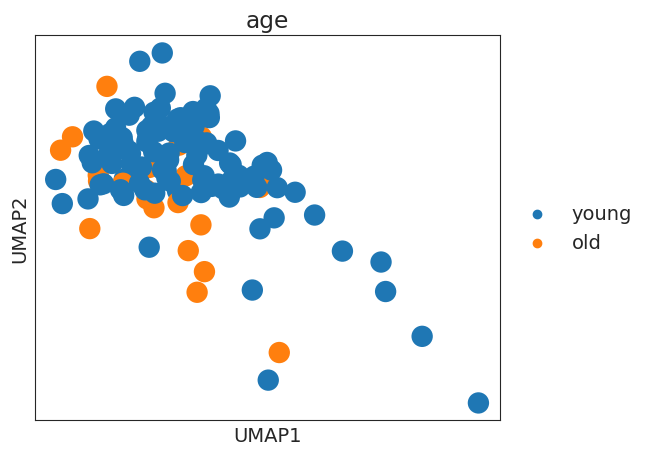

Started Diffxpy Calculation:	15-08-2024 10:57:03
training location model: True
training scale model: True
iter   0: ll=129254.162993
caught 188 linalg singular matrix errors
iter   1: ll=115647.303798, converged: 0.00% (loc: 9.13%, scale update: False), in 0.21sec
iter   2: ll=111664.560278, converged: 0.00% (loc: 9.13%, scale update: False), in 0.24sec
iter   3: ll=111312.977047, converged: 0.00% (loc: 9.13%, scale update: False), in 0.22sec
iter   4: ll=111309.115765, converged: 0.00% (loc: 9.13%, scale update: False), in 0.22sec
iter   5: ll=111309.109254, converged: 0.00% (loc: 12.72%, scale update: False), in 0.25sec
iter   6: ll=105159.281060, converged: 0.00% (loc: 0.00%, scale update: True), in 2.29sec
caught 188 linalg singular matrix errors
iter   7: ll=105131.417626, converged: 0.00% (loc: 12.52%, scale update: False), in 0.24sec
iter   8: ll=105131.145846, converged: 0.00% (loc: 17.67%, scale update: False), in 0.25sec
iter   9: ll=105131.144703, converged: 0.00% (loc: 64.1

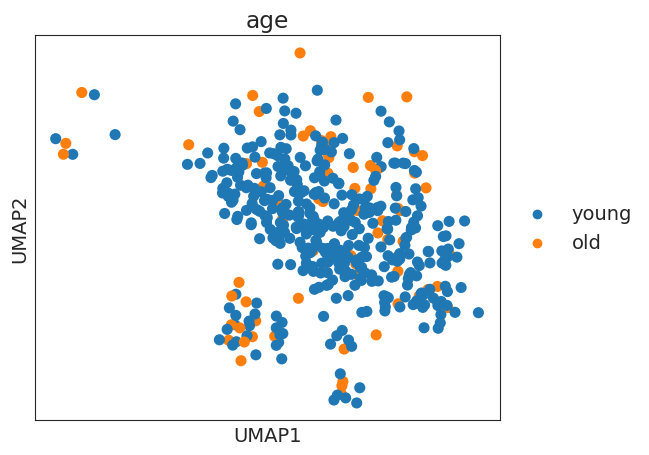

Started Diffxpy Calculation:	15-08-2024 10:57:18
training location model: True
training scale model: True
iter   0: ll=377185.153497
caught 7 linalg singular matrix errors
iter   1: ll=334198.888635, converged: 0.00% (loc: 0.39%, scale update: False), in 0.19sec
iter   2: ll=319132.869632, converged: 0.00% (loc: 0.39%, scale update: False), in 0.21sec
iter   3: ll=317357.713005, converged: 0.00% (loc: 0.39%, scale update: False), in 0.22sec
iter   4: ll=317330.477338, converged: 0.00% (loc: 0.39%, scale update: False), in 0.23sec
iter   5: ll=317330.466548, converged: 0.00% (loc: 1.86%, scale update: False), in 0.22sec
iter   6: ll=307133.614309, converged: 0.00% (loc: 0.00%, scale update: True), in 2.17sec
caught 7 linalg singular matrix errors
iter   7: ll=307115.352169, converged: 0.00% (loc: 0.85%, scale update: False), in 0.24sec
iter   8: ll=307114.900930, converged: 0.00% (loc: 8.57%, scale update: False), in 0.23sec
iter   9: ll=307114.895497, converged: 0.00% (loc: 62.85%, sca

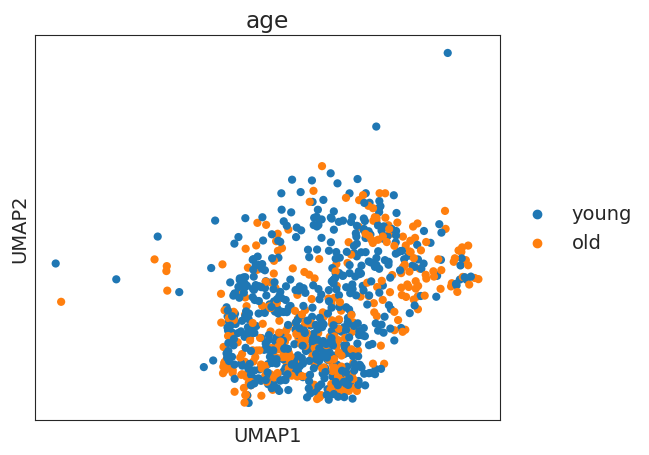

Started Diffxpy Calculation:	15-08-2024 10:57:37
training location model: True
training scale model: True
iter   0: ll=9499444.100800
iter   1: ll=9086716.835384, converged: 0.00% (loc: 4.83%, scale update: False), in 0.53sec
iter   2: ll=8940688.913597, converged: 0.00% (loc: 4.83%, scale update: False), in 0.54sec
iter   3: ll=8911599.267981, converged: 0.00% (loc: 4.83%, scale update: False), in 0.70sec
iter   4: ll=8907982.800512, converged: 0.00% (loc: 4.83%, scale update: False), in 0.54sec
iter   5: ll=8907616.336114, converged: 0.00% (loc: 4.83%, scale update: False), in 0.55sec
iter   6: ll=2883406.566054, converged: 0.00% (loc: 0.00%, scale update: True), in 8.39sec
iter   7: ll=2871554.913044, converged: 0.00% (loc: 0.00%, scale update: False), in 0.80sec
iter   8: ll=2869975.597711, converged: 0.00% (loc: 0.71%, scale update: False), in 1.39sec
iter   9: ll=2869780.838468, converged: 0.00% (loc: 2.56%, scale update: False), in 0.61sec
iter  10: ll=2869770.663275, converged:

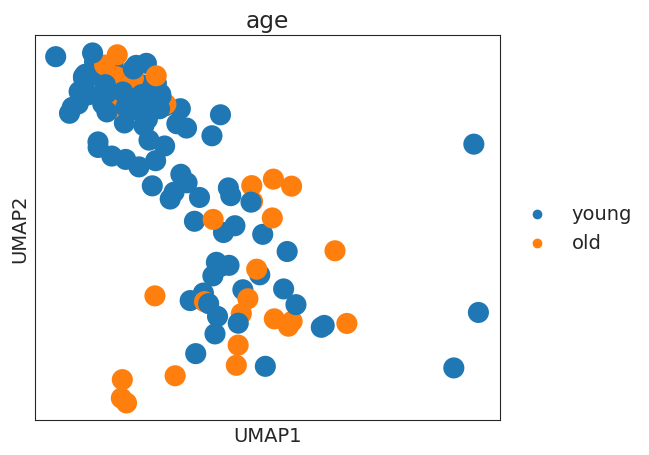

Started Diffxpy Calculation:	15-08-2024 10:59:01
training location model: True
training scale model: True
iter   0: ll=328139.713772
caught 342 linalg singular matrix errors
iter   1: ll=301553.361132, converged: 0.00% (loc: 8.21%, scale update: False), in 0.46sec
iter   2: ll=295697.298278, converged: 0.00% (loc: 8.21%, scale update: False), in 0.43sec
iter   3: ll=295329.775088, converged: 0.00% (loc: 8.21%, scale update: False), in 0.58sec
iter   4: ll=295325.096550, converged: 0.00% (loc: 8.21%, scale update: False), in 0.37sec
iter   5: ll=295325.058590, converged: 0.00% (loc: 16.05%, scale update: False), in 0.40sec
iter   6: ll=242910.119600, converged: 0.00% (loc: 0.00%, scale update: True), in 3.39sec
caught 342 linalg singular matrix errors
iter   7: ll=242779.409277, converged: 0.00% (loc: 8.46%, scale update: False), in 0.37sec
iter   8: ll=242772.565841, converged: 0.00% (loc: 11.85%, scale update: False), in 0.35sec
iter   9: ll=242772.370704, converged: 0.00% (loc: 34.35

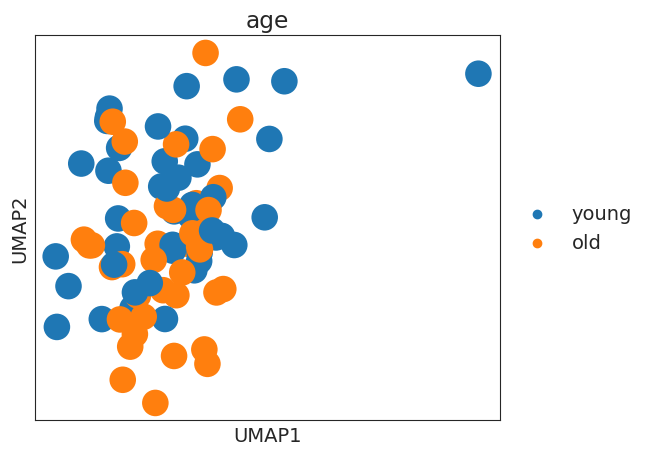

Started Diffxpy Calculation:	15-08-2024 10:59:40
training location model: True
training scale model: True
iter   0: ll=356510.484576
caught 53 linalg singular matrix errors
iter   1: ll=334641.216902, converged: 0.00% (loc: 3.78%, scale update: False), in 0.30sec
iter   2: ll=329537.348282, converged: 0.00% (loc: 3.78%, scale update: False), in 0.29sec
iter   3: ll=329123.659469, converged: 0.00% (loc: 3.78%, scale update: False), in 0.30sec
iter   4: ll=329111.211130, converged: 0.00% (loc: 3.78%, scale update: False), in 0.33sec
iter   5: ll=329110.809457, converged: 0.00% (loc: 4.40%, scale update: False), in 0.31sec
iter   6: ll=161786.796556, converged: 0.00% (loc: 0.00%, scale update: True), in 2.98sec
caught 53 linalg singular matrix errors
iter   7: ll=161414.735365, converged: 0.00% (loc: 2.02%, scale update: False), in 0.62sec
iter   8: ll=161347.232883, converged: 0.00% (loc: 4.01%, scale update: False), in 0.34sec
iter   9: ll=161342.023304, converged: 0.00% (loc: 15.36%, s

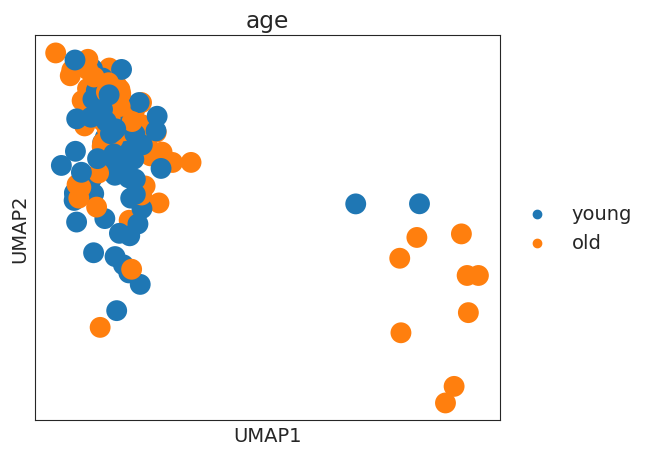

Started Diffxpy Calculation:	15-08-2024 11:00:29
training location model: True
training scale model: True
iter   0: ll=860863.739559
caught 62 linalg singular matrix errors
iter   1: ll=822896.419060, converged: 0.00% (loc: 5.54%, scale update: False), in 0.40sec
iter   2: ll=813631.661619, converged: 0.00% (loc: 5.54%, scale update: False), in 0.40sec
iter   3: ll=812745.343825, converged: 0.00% (loc: 5.54%, scale update: False), in 0.63sec
iter   4: ll=812706.239805, converged: 0.00% (loc: 5.54%, scale update: False), in 0.45sec
iter   5: ll=812704.430272, converged: 0.00% (loc: 6.12%, scale update: False), in 0.43sec
iter   6: ll=323587.630510, converged: 0.02% (loc: 0.02%, scale update: True), in 4.22sec
caught 61 linalg singular matrix errors
iter   7: ll=322353.425414, converged: 0.02% (loc: 1.87%, scale update: False), in 0.52sec
iter   8: ll=322114.498730, converged: 0.02% (loc: 3.26%, scale update: False), in 0.53sec
iter   9: ll=322086.688421, converged: 0.02% (loc: 11.33%, s

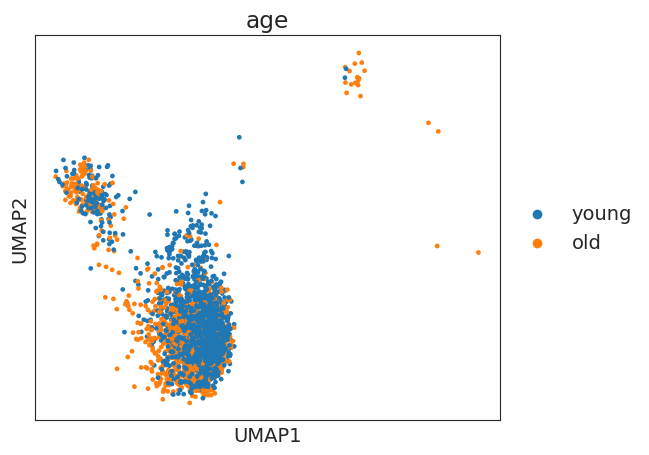

Started Diffxpy Calculation:	15-08-2024 11:01:34
training location model: True
training scale model: True
iter   0: ll=5180514.391575
iter   1: ll=4716465.195323, converged: 0.00% (loc: 0.00%, scale update: False), in 1.76sec
iter   2: ll=4609940.033177, converged: 0.00% (loc: 0.00%, scale update: False), in 1.74sec
iter   3: ll=4603907.499197, converged: 0.00% (loc: 0.00%, scale update: False), in 1.34sec
iter   4: ll=4603878.336609, converged: 0.00% (loc: 0.00%, scale update: False), in 1.37sec
iter   5: ll=4603878.321607, converged: 0.00% (loc: 7.47%, scale update: False), in 1.40sec
iter   6: ll=4488561.102476, converged: 0.00% (loc: 0.00%, scale update: True), in 15.07sec
iter   7: ll=4488172.110506, converged: 0.00% (loc: 0.03%, scale update: False), in 1.34sec
iter   8: ll=4488169.750716, converged: 0.00% (loc: 2.91%, scale update: False), in 1.27sec
iter   9: ll=4488169.739683, converged: 0.00% (loc: 25.27%, scale update: False), in 1.20sec
iter  10: ll=4488169.739623, converge

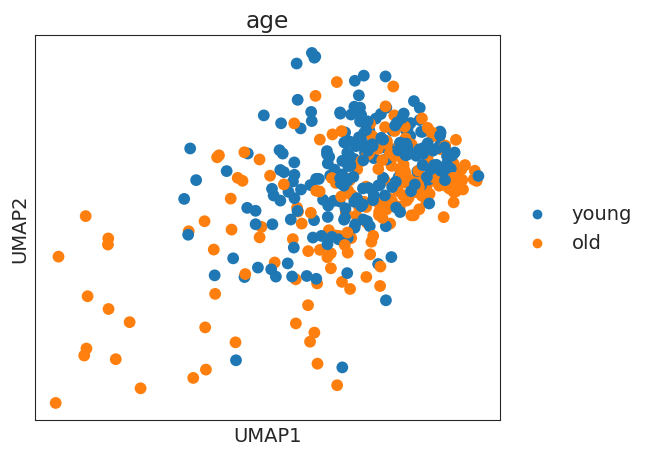

Started Diffxpy Calculation:	15-08-2024 11:02:50
training location model: True
training scale model: True
iter   0: ll=1054927.850746
caught 1 linalg singular matrix errors
iter   1: ll=957906.040935, converged: 0.00% (loc: 0.20%, scale update: False), in 0.46sec
iter   2: ll=936152.068098, converged: 0.00% (loc: 0.20%, scale update: False), in 0.49sec
iter   3: ll=934790.611862, converged: 0.00% (loc: 0.20%, scale update: False), in 0.43sec
iter   4: ll=934776.198169, converged: 0.00% (loc: 0.20%, scale update: False), in 0.42sec
iter   5: ll=934776.114530, converged: 0.00% (loc: 2.40%, scale update: False), in 0.38sec
iter   6: ll=867189.191753, converged: 0.00% (loc: 0.00%, scale update: True), in 4.53sec
caught 1 linalg singular matrix errors
iter   7: ll=866962.374391, converged: 0.00% (loc: 0.02%, scale update: False), in 0.48sec
iter   8: ll=866951.853451, converged: 0.00% (loc: 1.97%, scale update: False), in 0.44sec
iter   9: ll=866951.570607, converged: 0.00% (loc: 14.62%, sc

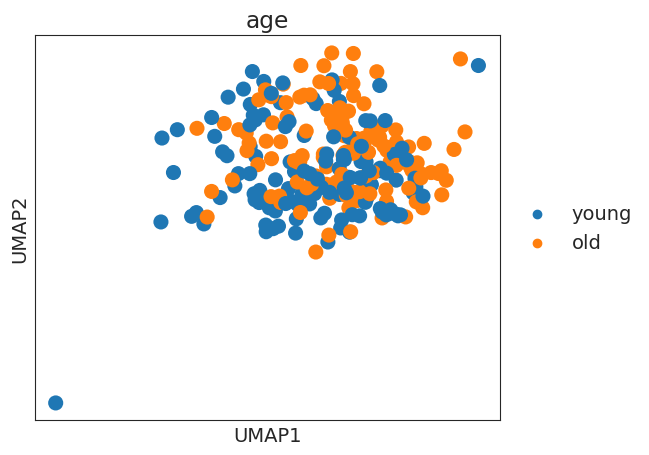

Started Diffxpy Calculation:	15-08-2024 11:03:29
training location model: True
training scale model: True
iter   0: ll=995486.083121
caught 13 linalg singular matrix errors
iter   1: ll=905342.034665, converged: 0.00% (loc: 1.06%, scale update: False), in 1.19sec
iter   2: ll=883803.208729, converged: 0.00% (loc: 1.06%, scale update: False), in 0.92sec
iter   3: ll=881999.458396, converged: 0.00% (loc: 1.06%, scale update: False), in 0.91sec
iter   4: ll=881953.550731, converged: 0.00% (loc: 1.06%, scale update: False), in 1.54sec
iter   5: ll=881952.690522, converged: 0.00% (loc: 1.22%, scale update: False), in 1.42sec
iter   6: ll=691105.753834, converged: 0.00% (loc: 0.00%, scale update: True), in 6.01sec
caught 13 linalg singular matrix errors
iter   7: ll=690681.710600, converged: 0.00% (loc: 0.40%, scale update: False), in 0.62sec
iter   8: ll=690643.668892, converged: 0.00% (loc: 1.80%, scale update: False), in 0.60sec
iter   9: ll=690639.310523, converged: 0.00% (loc: 10.96%, s

iter  87: ll=684717.259786, converged: 99.98% (loc: 100.00%, scale update: False), in 0.09sec
iter  88: ll=684717.259786, converged: 99.98% (loc: 99.98%, scale update: True), in 0.09sec
iter  89: ll=684717.259786, converged: 99.98% (loc: 99.98%, scale update: False), in 0.09sec
iter  90: ll=684717.259786, converged: 99.98% (loc: 100.00%, scale update: False), in 0.09sec
iter  91: ll=684717.259786, converged: 99.98% (loc: 99.98%, scale update: True), in 0.08sec
iter  92: ll=684717.259786, converged: 99.98% (loc: 100.00%, scale update: False), in 0.09sec
iter  93: ll=684717.259786, converged: 99.98% (loc: 99.98%, scale update: True), in 0.09sec
iter  94: ll=684717.259786, converged: 99.98% (loc: 100.00%, scale update: False), in 0.10sec
iter  95: ll=684717.259786, converged: 100.00% (loc: 100.00%, scale update: True), in 0.09sec
Finished Diffxpy Calculation:	18-01-2023 13:00:20
(5486, 10)
(5486, 4)
Saving to diffxpy_young_vs_old_Lymphatic_ECs_d20.txt



In [15]:
subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d20"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")
    

## d30

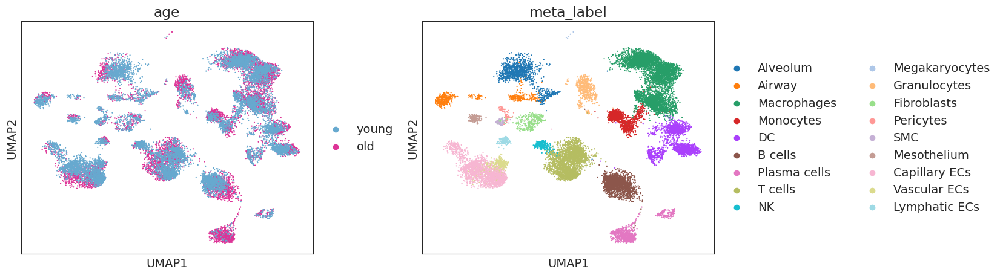

Alveolum - d30
(1171, 5100)


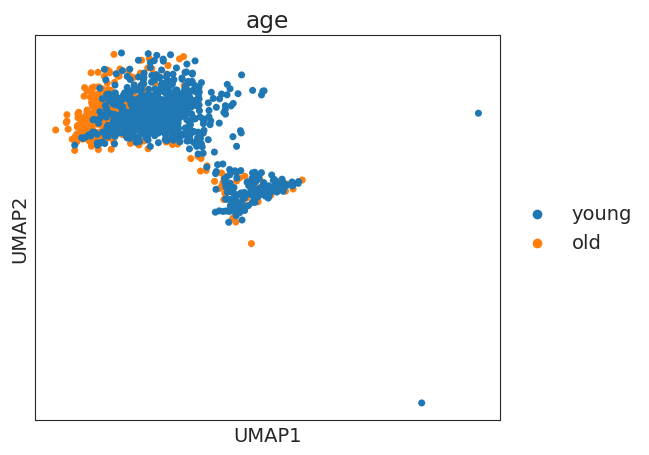

Started Diffxpy Calculation:	15-08-2024 11:04:40
training location model: True
training scale model: True
iter   0: ll=48220188.136949
iter   1: ll=47366199.725522, converged: 0.00% (loc: 21.51%, scale update: False), in 1.14sec
iter   2: ll=47020901.708388, converged: 0.00% (loc: 21.51%, scale update: False), in 1.62sec
iter   3: ll=46924583.788490, converged: 0.00% (loc: 21.51%, scale update: False), in 1.05sec
iter   4: ll=46905905.279889, converged: 0.00% (loc: 21.51%, scale update: False), in 0.59sec
iter   5: ll=46903433.106365, converged: 0.00% (loc: 21.51%, scale update: False), in 1.21sec
iter   6: ll=3548246.539125, converged: 0.00% (loc: 0.00%, scale update: True), in 9.47sec
iter   7: ll=3494506.081045, converged: 0.00% (loc: 0.02%, scale update: False), in 1.13sec
iter   8: ll=3484129.966266, converged: 0.00% (loc: 0.41%, scale update: False), in 1.15sec
iter   9: ll=3482688.976446, converged: 0.00% (loc: 1.47%, scale update: False), in 1.34sec
iter  10: ll=3482613.324005,

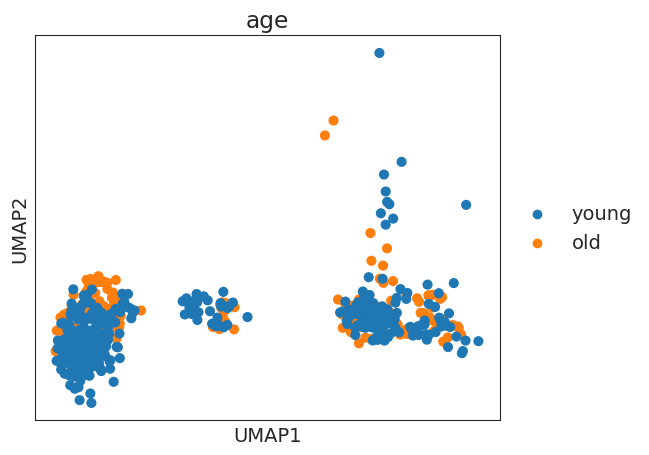

Started Diffxpy Calculation:	15-08-2024 11:06:25
training location model: True
training scale model: True
iter   0: ll=70494590.715025
caught 1 linalg singular matrix errors
iter   1: ll=69780696.549452, converged: 0.00% (loc: 38.79%, scale update: False), in 0.63sec
iter   2: ll=69461806.608153, converged: 0.00% (loc: 38.79%, scale update: False), in 0.59sec
iter   3: ll=69356306.984575, converged: 0.00% (loc: 38.79%, scale update: False), in 0.76sec
iter   4: ll=69331486.503060, converged: 0.00% (loc: 38.79%, scale update: False), in 0.63sec
iter   5: ll=69327578.372111, converged: 0.00% (loc: 38.79%, scale update: False), in 0.62sec
iter   6: ll=2676510.081501, converged: 0.00% (loc: 0.00%, scale update: True), in 8.92sec
caught 1 linalg singular matrix errors
iter   7: ll=2610323.665186, converged: 0.00% (loc: 0.22%, scale update: False), in 1.01sec
iter   8: ll=2595064.348249, converged: 0.00% (loc: 0.54%, scale update: False), in 1.40sec
iter   9: ll=2592589.608580, converged: 0.

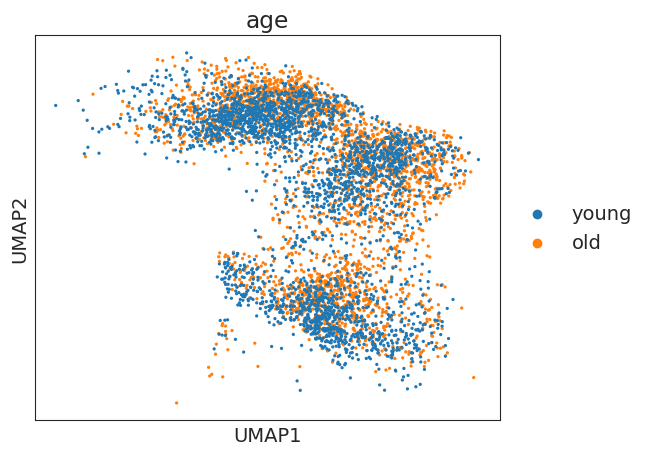

Started Diffxpy Calculation:	15-08-2024 11:08:12
training location model: True
training scale model: True
iter   0: ll=38880247.704377
iter   1: ll=35140633.128430, converged: 0.00% (loc: 2.14%, scale update: False), in 3.46sec
iter   2: ll=33833249.568038, converged: 0.00% (loc: 2.14%, scale update: False), in 3.51sec
iter   3: ll=33560297.846586, converged: 0.00% (loc: 2.14%, scale update: False), in 3.07sec
iter   4: ll=33525089.867827, converged: 0.00% (loc: 2.14%, scale update: False), in 2.49sec
iter   5: ll=33521816.651572, converged: 0.00% (loc: 2.14%, scale update: False), in 2.28sec
iter   6: ll=17492981.996303, converged: 0.00% (loc: 0.00%, scale update: True), in 30.72sec
iter   7: ll=17433552.393868, converged: 0.00% (loc: 0.02%, scale update: False), in 3.71sec
iter   8: ll=17429370.723293, converged: 0.00% (loc: 0.45%, scale update: False), in 3.48sec
iter   9: ll=17428878.530991, converged: 0.00% (loc: 1.58%, scale update: False), in 3.40sec
iter  10: ll=17428857.668012

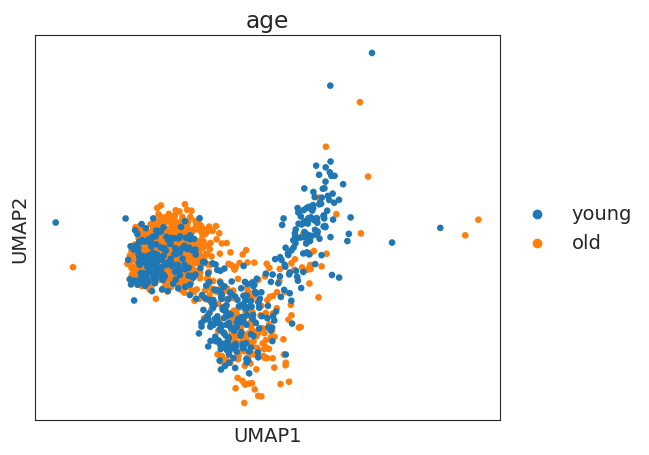

Started Diffxpy Calculation:	15-08-2024 11:12:51
training location model: True
training scale model: True
iter   0: ll=2926722.906896
caught 1 linalg singular matrix errors
iter   1: ll=2643001.900220, converged: 0.00% (loc: 0.03%, scale update: False), in 2.38sec
iter   2: ll=2582370.013569, converged: 0.00% (loc: 0.03%, scale update: False), in 2.43sec
iter   3: ll=2579208.988158, converged: 0.00% (loc: 0.03%, scale update: False), in 1.85sec
iter   4: ll=2579192.060344, converged: 0.00% (loc: 0.03%, scale update: False), in 2.65sec
iter   5: ll=2579192.034678, converged: 0.00% (loc: 7.05%, scale update: False), in 1.49sec
iter   6: ll=2542633.190417, converged: 0.00% (loc: 0.00%, scale update: True), in 11.02sec
caught 1 linalg singular matrix errors
iter   7: ll=2542453.357070, converged: 0.00% (loc: 0.05%, scale update: False), in 0.97sec
iter   8: ll=2542452.212438, converged: 0.00% (loc: 2.36%, scale update: False), in 0.92sec
iter   9: ll=2542452.206522, converged: 0.00% (loc: 

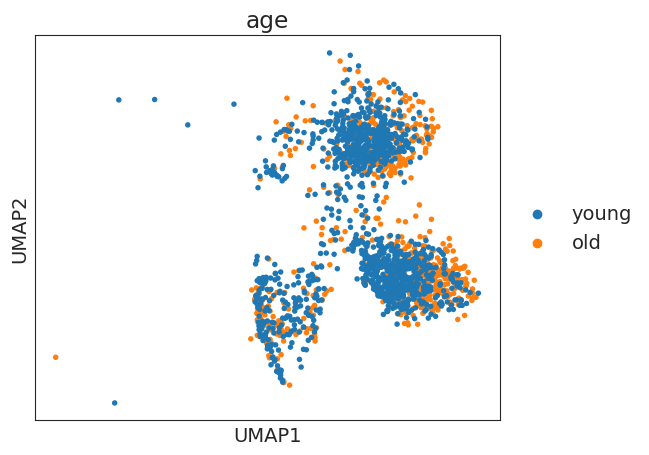

Started Diffxpy Calculation:	15-08-2024 11:13:57
training location model: True
training scale model: True
iter   0: ll=6834957.382898
iter   1: ll=5981287.638650, converged: 0.00% (loc: 0.40%, scale update: False), in 1.28sec
iter   2: ll=5761221.808829, converged: 0.00% (loc: 0.40%, scale update: False), in 1.33sec
iter   3: ll=5738881.929070, converged: 0.00% (loc: 0.40%, scale update: False), in 1.32sec
iter   4: ll=5738091.435161, converged: 0.00% (loc: 0.40%, scale update: False), in 1.24sec
iter   5: ll=5738074.753644, converged: 0.00% (loc: 0.55%, scale update: False), in 1.52sec
iter   6: ll=5054630.710342, converged: 0.00% (loc: 0.00%, scale update: True), in 16.63sec
iter   7: ll=5052796.805952, converged: 0.00% (loc: 0.00%, scale update: False), in 1.24sec
iter   8: ll=5052643.497023, converged: 0.00% (loc: 1.40%, scale update: False), in 1.28sec
iter   9: ll=5052635.671646, converged: 0.00% (loc: 9.73%, scale update: False), in 1.23sec
iter  10: ll=5052635.554866, converged

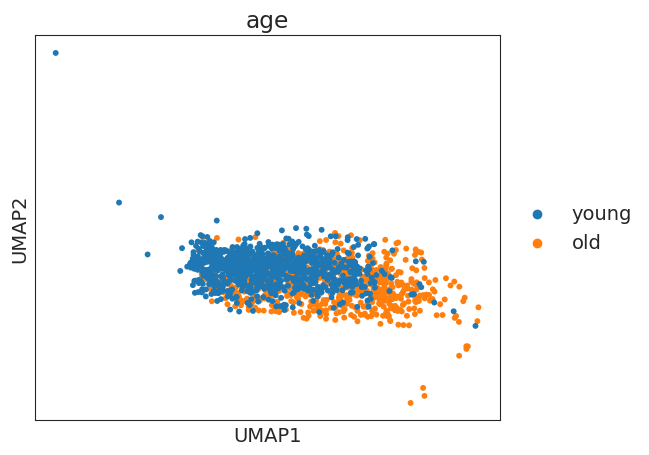

Started Diffxpy Calculation:	15-08-2024 11:15:27
training location model: True
training scale model: True
iter   0: ll=2666145.577256
iter   1: ll=2403736.613115, converged: 0.00% (loc: 0.00%, scale update: False), in 1.01sec
iter   2: ll=2344197.305901, converged: 0.00% (loc: 0.00%, scale update: False), in 1.15sec
iter   3: ll=2340949.784142, converged: 0.00% (loc: 0.00%, scale update: False), in 0.83sec
iter   4: ll=2340935.208357, converged: 0.00% (loc: 0.00%, scale update: False), in 1.12sec
iter   5: ll=2340935.198316, converged: 0.00% (loc: 13.68%, scale update: False), in 0.93sec
iter   6: ll=2305176.116431, converged: 0.00% (loc: 0.00%, scale update: True), in 6.87sec
iter   7: ll=2305102.645687, converged: 0.00% (loc: 0.00%, scale update: False), in 0.87sec
iter   8: ll=2305102.311947, converged: 0.00% (loc: 4.95%, scale update: False), in 1.10sec
iter   9: ll=2305102.310512, converged: 0.00% (loc: 58.24%, scale update: False), in 1.26sec
iter  10: ll=2305102.310501, converge

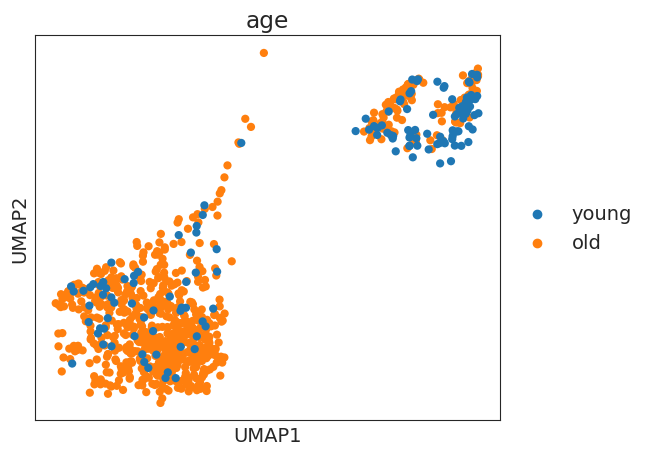

Started Diffxpy Calculation:	15-08-2024 11:16:10
training location model: True
training scale model: True
iter   0: ll=2240534.146770
iter   1: ll=2096888.248089, converged: 0.00% (loc: 4.87%, scale update: False), in 0.27sec
iter   2: ll=2055315.979399, converged: 0.00% (loc: 4.87%, scale update: False), in 0.28sec
iter   3: ll=2049266.572269, converged: 0.00% (loc: 4.87%, scale update: False), in 0.27sec
iter   4: ll=2048747.012168, converged: 0.00% (loc: 4.87%, scale update: False), in 0.27sec
iter   5: ll=2048706.313002, converged: 0.00% (loc: 5.06%, scale update: False), in 0.28sec
iter   6: ll=811396.568905, converged: 0.00% (loc: 0.00%, scale update: True), in 4.62sec
iter   7: ll=808400.856862, converged: 0.00% (loc: 0.00%, scale update: False), in 0.44sec
iter   8: ll=807807.024735, converged: 0.00% (loc: 1.34%, scale update: False), in 0.35sec
iter   9: ll=807725.020944, converged: 0.00% (loc: 4.82%, scale update: False), in 0.43sec
iter  10: ll=807724.421642, converged: 0.00

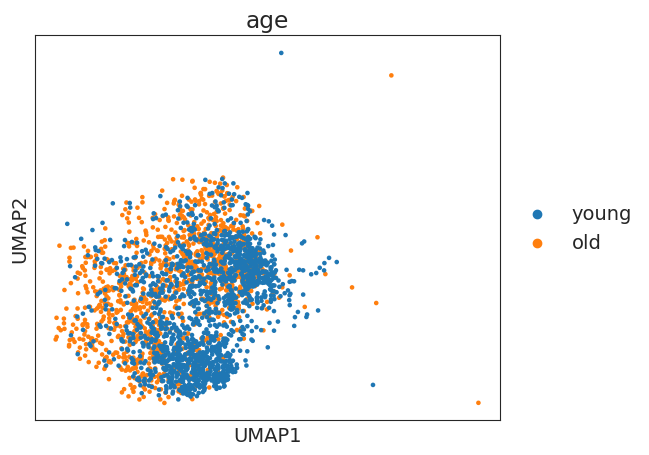

Started Diffxpy Calculation:	15-08-2024 11:16:44
training location model: True
training scale model: True
iter   0: ll=4343093.608233
iter   1: ll=3930502.088007, converged: 0.00% (loc: 0.00%, scale update: False), in 1.32sec
iter   2: ll=3842469.191249, converged: 0.00% (loc: 0.00%, scale update: False), in 1.22sec
iter   3: ll=3838322.137678, converged: 0.00% (loc: 0.00%, scale update: False), in 1.12sec
iter   4: ll=3838310.754206, converged: 0.00% (loc: 0.00%, scale update: False), in 1.16sec
iter   5: ll=3838310.752487, converged: 0.00% (loc: 43.41%, scale update: False), in 1.16sec
iter   6: ll=3783683.369224, converged: 0.00% (loc: 0.00%, scale update: True), in 10.73sec
iter   7: ll=3783641.579618, converged: 0.00% (loc: 0.10%, scale update: False), in 1.12sec
iter   8: ll=3783641.472028, converged: 0.00% (loc: 19.48%, scale update: False), in 1.15sec
iter   9: ll=3783641.471555, converged: 0.00% (loc: 93.68%, scale update: False), in 0.93sec
iter  10: ll=3783641.471550, conver

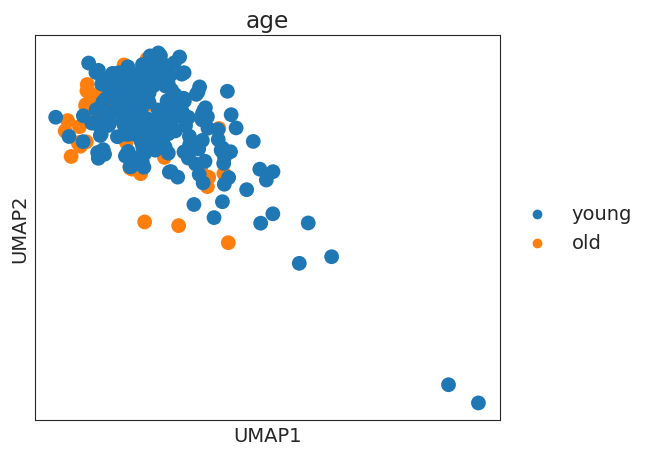

Started Diffxpy Calculation:	15-08-2024 11:17:36
training location model: True
training scale model: True
iter   0: ll=403700.061645
caught 89 linalg singular matrix errors
iter   1: ll=366419.075086, converged: 0.00% (loc: 2.85%, scale update: False), in 0.33sec
iter   2: ll=358305.614693, converged: 0.00% (loc: 2.85%, scale update: False), in 0.40sec
iter   3: ll=357895.959575, converged: 0.00% (loc: 2.85%, scale update: False), in 0.40sec
iter   4: ll=357894.078847, converged: 0.00% (loc: 2.85%, scale update: False), in 0.38sec
iter   5: ll=357894.072740, converged: 0.00% (loc: 28.64%, scale update: False), in 0.35sec
iter   6: ll=349253.219651, converged: 0.00% (loc: 0.00%, scale update: True), in 2.98sec
caught 89 linalg singular matrix errors
iter   7: ll=349221.747551, converged: 0.00% (loc: 4.00%, scale update: False), in 0.36sec
iter   8: ll=349221.375398, converged: 0.00% (loc: 10.33%, scale update: False), in 0.33sec
iter   9: ll=349221.373748, converged: 0.00% (loc: 68.67%,

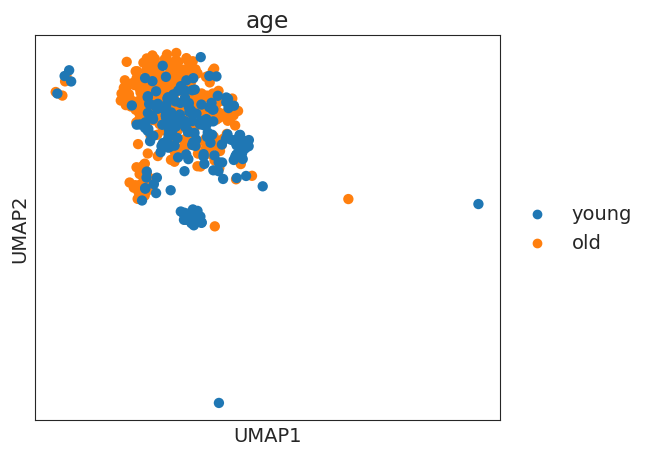

Started Diffxpy Calculation:	15-08-2024 11:17:57
training location model: True
training scale model: True
iter   0: ll=559199.605744
caught 5 linalg singular matrix errors
iter   1: ll=500810.690628, converged: 0.00% (loc: 0.27%, scale update: False), in 0.24sec
iter   2: ll=485162.859011, converged: 0.00% (loc: 0.27%, scale update: False), in 0.27sec
iter   3: ll=484048.964683, converged: 0.00% (loc: 0.27%, scale update: False), in 0.26sec
iter   4: ll=484042.119612, converged: 0.00% (loc: 0.27%, scale update: False), in 0.26sec
iter   5: ll=484042.117338, converged: 0.00% (loc: 8.41%, scale update: False), in 0.24sec
iter   6: ll=472905.239930, converged: 0.00% (loc: 0.00%, scale update: True), in 2.46sec
caught 5 linalg singular matrix errors
iter   7: ll=472891.972367, converged: 0.00% (loc: 0.54%, scale update: False), in 0.28sec
iter   8: ll=472891.934733, converged: 0.00% (loc: 14.39%, scale update: False), in 0.29sec
iter   9: ll=472891.934472, converged: 0.00% (loc: 88.89%, sc

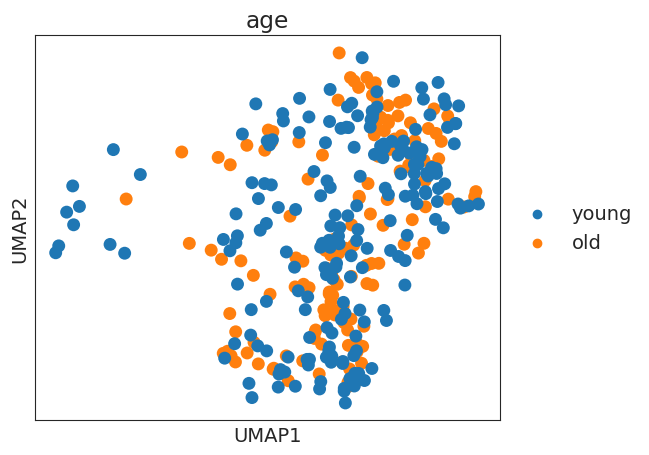

Started Diffxpy Calculation:	15-08-2024 11:18:11
training location model: True
training scale model: True
iter   0: ll=23974701.481278
caught 4 linalg singular matrix errors
iter   1: ll=23645101.220245, converged: 0.00% (loc: 26.50%, scale update: False), in 0.76sec
iter   2: ll=23503287.177864, converged: 0.00% (loc: 26.50%, scale update: False), in 0.57sec
iter   3: ll=23458888.008447, converged: 0.00% (loc: 26.50%, scale update: False), in 0.60sec
iter   4: ll=23448628.148977, converged: 0.00% (loc: 26.50%, scale update: False), in 0.64sec
iter   5: ll=23446911.422494, converged: 0.00% (loc: 26.50%, scale update: False), in 0.84sec
iter   6: ll=1610198.235510, converged: 0.00% (loc: 0.00%, scale update: True), in 6.00sec
caught 3 linalg singular matrix errors
iter   7: ll=1584971.285829, converged: 0.00% (loc: 0.62%, scale update: False), in 0.65sec
iter   8: ll=1579195.829597, converged: 0.00% (loc: 1.03%, scale update: False), in 0.67sec
iter   9: ll=1578225.979874, converged: 0.

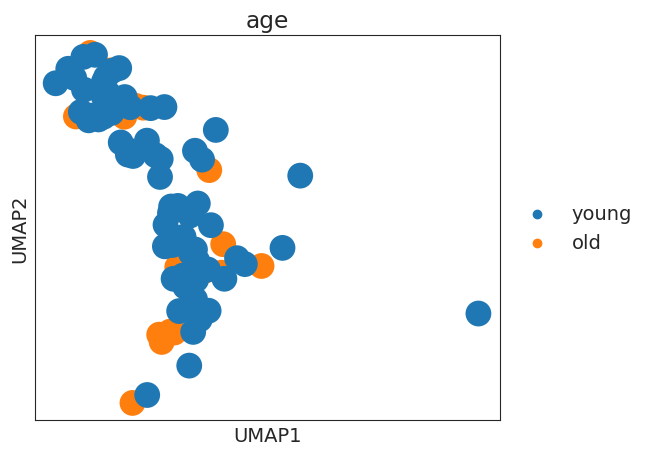

Started Diffxpy Calculation:	15-08-2024 11:19:41
training location model: True
training scale model: True
iter   0: ll=624983.341297
caught 548 linalg singular matrix errors
iter   1: ll=601904.448536, converged: 0.00% (loc: 16.37%, scale update: False), in 0.36sec
iter   2: ll=596820.365372, converged: 0.00% (loc: 16.37%, scale update: False), in 0.46sec
iter   3: ll=596451.617910, converged: 0.00% (loc: 16.37%, scale update: False), in 0.48sec
iter   4: ll=596443.814732, converged: 0.00% (loc: 16.37%, scale update: False), in 0.67sec
iter   5: ll=596443.701101, converged: 0.00% (loc: 17.95%, scale update: False), in 0.34sec
iter   6: ll=200753.246356, converged: 0.00% (loc: 0.00%, scale update: True), in 2.92sec
caught 547 linalg singular matrix errors
iter   7: ll=200374.378238, converged: 0.00% (loc: 14.43%, scale update: False), in 0.38sec
iter   8: ll=200335.923218, converged: 0.00% (loc: 17.43%, scale update: False), in 0.38sec
iter   9: ll=200331.907526, converged: 0.00% (loc: 

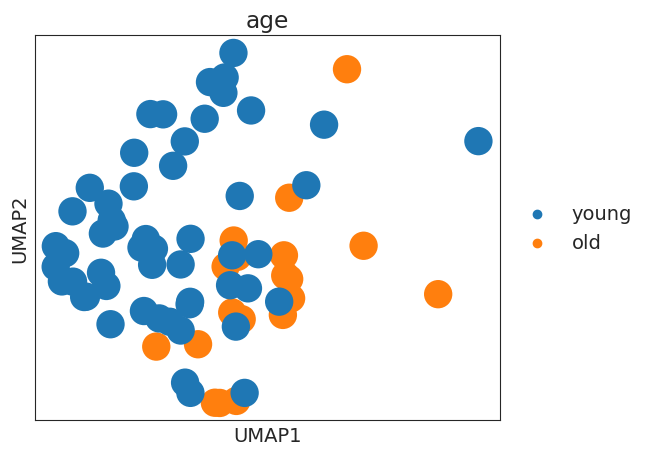

Started Diffxpy Calculation:	15-08-2024 11:20:22
training location model: True
training scale model: True
iter   0: ll=1931440.195743
caught 374 linalg singular matrix errors
iter   1: ll=1904445.904337, converged: 0.00% (loc: 24.02%, scale update: False), in 0.37sec
iter   2: ll=1898679.667136, converged: 0.00% (loc: 24.02%, scale update: False), in 0.40sec
iter   3: ll=1898278.375644, converged: 0.00% (loc: 24.02%, scale update: False), in 0.40sec
iter   4: ll=1898270.914732, converged: 0.00% (loc: 24.02%, scale update: False), in 0.38sec
iter   5: ll=1898270.820027, converged: 0.00% (loc: 26.12%, scale update: False), in 0.50sec
iter   6: ll=214765.771332, converged: 0.00% (loc: 0.00%, scale update: True), in 3.14sec
caught 367 linalg singular matrix errors
iter   7: ll=213371.477464, converged: 0.00% (loc: 14.23%, scale update: False), in 0.39sec
iter   8: ll=213153.504799, converged: 0.00% (loc: 18.54%, scale update: False), in 0.35sec
iter   9: ll=213142.851885, converged: 0.00% 

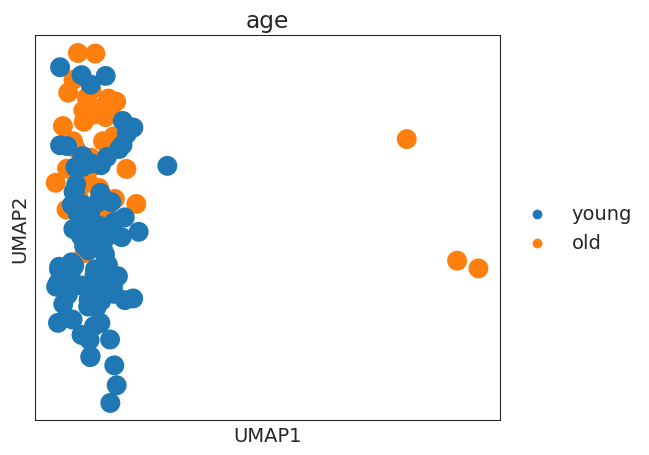

Started Diffxpy Calculation:	15-08-2024 11:20:55
training location model: True
training scale model: True
iter   0: ll=6093702.081304
caught 103 linalg singular matrix errors
iter   1: ll=6007928.304842, converged: 0.00% (loc: 25.40%, scale update: False), in 0.62sec
iter   2: ll=5981854.541829, converged: 0.00% (loc: 25.40%, scale update: False), in 0.45sec
iter   3: ll=5977363.920236, converged: 0.00% (loc: 25.40%, scale update: False), in 0.49sec
iter   4: ll=5976888.146662, converged: 0.00% (loc: 25.40%, scale update: False), in 0.50sec
iter   5: ll=5976850.626383, converged: 0.00% (loc: 25.40%, scale update: False), in 0.50sec
iter   6: ll=620905.244507, converged: 0.00% (loc: 0.00%, scale update: True), in 3.89sec
caught 101 linalg singular matrix errors
iter   7: ll=604078.255117, converged: 0.00% (loc: 3.76%, scale update: False), in 0.70sec
iter   8: ll=599796.744287, converged: 0.00% (loc: 4.81%, scale update: False), in 0.60sec
iter   9: ll=599252.854597, converged: 0.00% (l

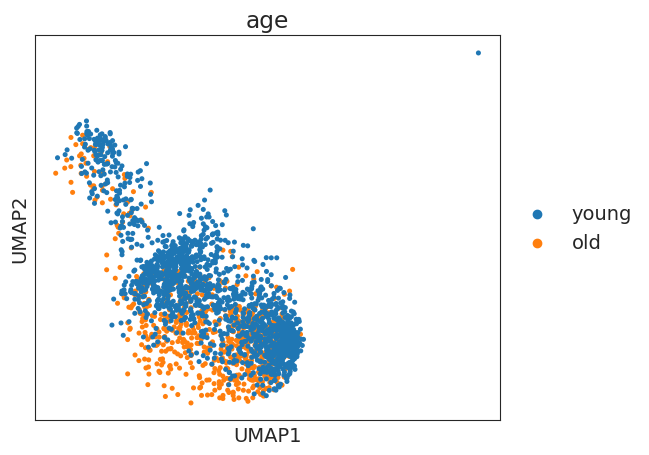

Started Diffxpy Calculation:	15-08-2024 11:22:00
training location model: True
training scale model: True
iter   0: ll=5949919.858728
iter   1: ll=5366609.254058, converged: 0.00% (loc: 0.00%, scale update: False), in 1.87sec
iter   2: ll=5235001.203717, converged: 0.00% (loc: 0.00%, scale update: False), in 1.63sec
iter   3: ll=5226571.266569, converged: 0.00% (loc: 0.00%, scale update: False), in 1.25sec
iter   4: ll=5226480.286779, converged: 0.00% (loc: 0.00%, scale update: False), in 1.28sec
iter   5: ll=5226479.904069, converged: 0.00% (loc: 0.63%, scale update: False), in 1.20sec
iter   6: ll=5188823.370763, converged: 0.00% (loc: 0.00%, scale update: True), in 12.49sec
iter   7: ll=5188383.336694, converged: 0.00% (loc: 0.04%, scale update: False), in 1.30sec
iter   8: ll=5188377.938070, converged: 0.00% (loc: 2.31%, scale update: False), in 1.44sec
iter   9: ll=5188377.877865, converged: 0.00% (loc: 13.06%, scale update: False), in 1.46sec
iter  10: ll=5188377.877046, converge

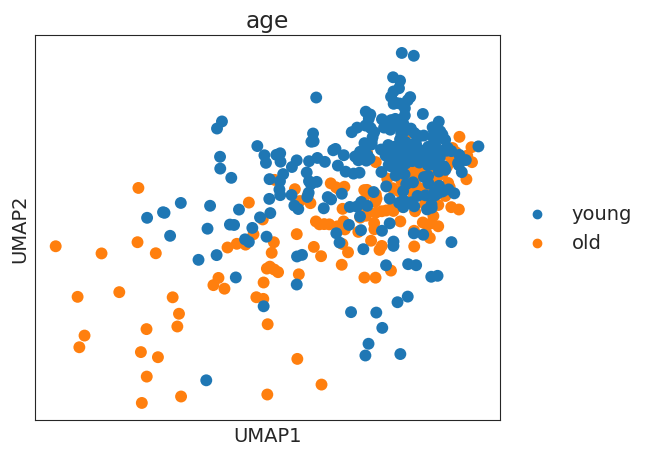

Started Diffxpy Calculation:	15-08-2024 11:23:26
training location model: True
training scale model: True
iter   0: ll=2699997.392915
caught 1 linalg singular matrix errors
iter   1: ll=2534402.375598, converged: 0.00% (loc: 3.32%, scale update: False), in 0.82sec
iter   2: ll=2492102.767334, converged: 0.00% (loc: 3.32%, scale update: False), in 0.54sec
iter   3: ll=2487651.965453, converged: 0.00% (loc: 3.32%, scale update: False), in 0.56sec
iter   4: ll=2487444.194795, converged: 0.00% (loc: 3.32%, scale update: False), in 0.61sec
iter   5: ll=2487435.860170, converged: 0.00% (loc: 3.42%, scale update: False), in 0.54sec
iter   6: ll=1140987.183396, converged: 0.00% (loc: 0.00%, scale update: True), in 5.63sec
caught 1 linalg singular matrix errors
iter   7: ll=1134553.085343, converged: 0.00% (loc: 0.07%, scale update: False), in 0.64sec
iter   8: ll=1133178.439858, converged: 0.00% (loc: 1.33%, scale update: False), in 0.55sec
iter   9: ll=1132977.488651, converged: 0.00% (loc: 1

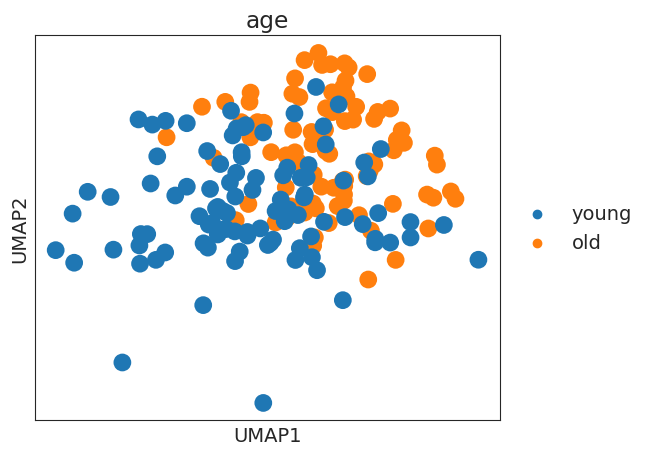

Started Diffxpy Calculation:	15-08-2024 11:24:14
training location model: True
training scale model: True
iter   0: ll=2472116.956190
caught 74 linalg singular matrix errors
iter   1: ll=2371114.466674, converged: 0.00% (loc: 8.25%, scale update: False), in 0.64sec
iter   2: ll=2340854.720881, converged: 0.00% (loc: 8.25%, scale update: False), in 0.81sec
iter   3: ll=2335090.388706, converged: 0.00% (loc: 8.25%, scale update: False), in 0.66sec
iter   4: ll=2334030.305608, converged: 0.00% (loc: 8.25%, scale update: False), in 0.64sec
iter   5: ll=2333822.764088, converged: 0.00% (loc: 8.25%, scale update: False), in 0.69sec
iter   6: ll=635496.083412, converged: 0.02% (loc: 0.02%, scale update: True), in 4.63sec
caught 71 linalg singular matrix errors
iter   7: ll=631741.544429, converged: 0.02% (loc: 1.48%, scale update: False), in 0.74sec
iter   8: ll=631020.075331, converged: 0.02% (loc: 1.83%, scale update: False), in 0.73sec
iter   9: ll=630899.399940, converged: 0.02% (loc: 3.9

iter  85: ll=598884.444670, converged: 99.88% (loc: 99.98%, scale update: False), in 0.13sec
iter  86: ll=598884.444670, converged: 99.88% (loc: 100.00%, scale update: False), in 0.11sec
iter  87: ll=598884.444670, converged: 99.93% (loc: 99.93%, scale update: True), in 0.84sec
iter  88: ll=598884.444670, converged: 99.93% (loc: 99.95%, scale update: False), in 0.14sec
iter  89: ll=598884.444670, converged: 99.93% (loc: 100.00%, scale update: False), in 0.12sec
iter  90: ll=598884.444670, converged: 99.95% (loc: 99.95%, scale update: True), in 0.78sec
iter  91: ll=598884.444670, converged: 99.95% (loc: 99.97%, scale update: False), in 0.12sec
iter  92: ll=598884.444670, converged: 99.95% (loc: 100.00%, scale update: False), in 0.12sec
iter  93: ll=598884.444670, converged: 99.97% (loc: 99.97%, scale update: True), in 0.12sec
iter  94: ll=598884.444670, converged: 99.97% (loc: 99.98%, scale update: False), in 0.11sec
iter  95: ll=598884.444670, converged: 99.97% (loc: 100.00%, scale upd

In [16]:
subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d30"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")
    

## d37

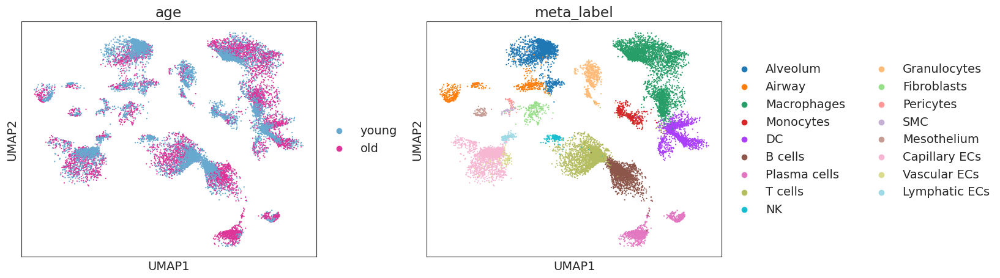

Alveolum - d37
(1671, 3775)


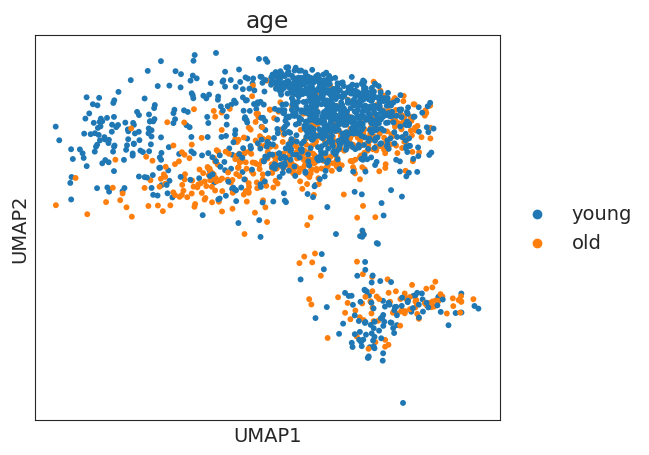

Started Diffxpy Calculation:	15-08-2024 11:25:23
training location model: True
training scale model: True
iter   0: ll=3974915.271056
iter   1: ll=3687741.560823, converged: 0.00% (loc: 0.87%, scale update: False), in 1.03sec
iter   2: ll=3612402.478823, converged: 0.00% (loc: 0.87%, scale update: False), in 1.05sec
iter   3: ll=3605748.329977, converged: 0.00% (loc: 0.87%, scale update: False), in 1.02sec
iter   4: ll=3605585.313792, converged: 0.00% (loc: 0.87%, scale update: False), in 1.14sec
iter   5: ll=3605582.052037, converged: 0.00% (loc: 1.03%, scale update: False), in 0.93sec
iter   6: ll=2773724.097118, converged: 0.00% (loc: 0.00%, scale update: True), in 8.20sec
iter   7: ll=2772122.306241, converged: 0.00% (loc: 0.03%, scale update: False), in 1.23sec
iter   8: ll=2771886.276192, converged: 0.00% (loc: 0.74%, scale update: False), in 1.08sec
iter   9: ll=2771861.585493, converged: 0.00% (loc: 6.52%, scale update: False), in 1.07sec
iter  10: ll=2771861.383806, converged:

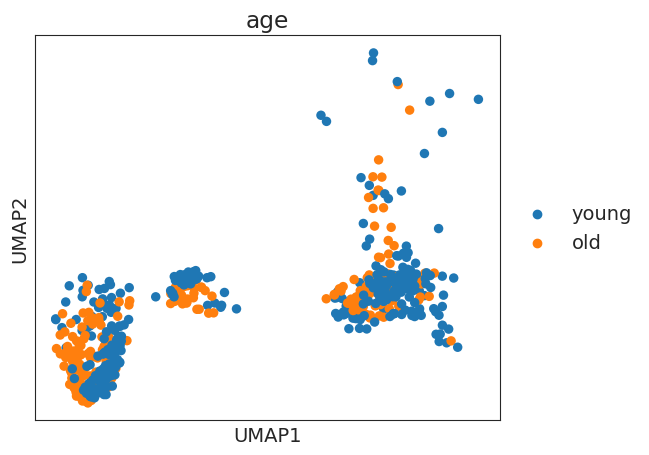

Started Diffxpy Calculation:	15-08-2024 11:26:32
training location model: True
training scale model: True
iter   0: ll=9364128.259996
iter   1: ll=9065213.473295, converged: 0.00% (loc: 8.27%, scale update: False), in 0.53sec
iter   2: ll=8960008.080997, converged: 0.00% (loc: 8.27%, scale update: False), in 0.52sec
iter   3: ll=8938178.709788, converged: 0.00% (loc: 8.27%, scale update: False), in 0.53sec
iter   4: ll=8935080.123750, converged: 0.00% (loc: 8.27%, scale update: False), in 0.75sec
iter   5: ll=8934711.905055, converged: 0.00% (loc: 8.28%, scale update: False), in 0.90sec
iter   6: ll=2088758.718124, converged: 0.00% (loc: 0.00%, scale update: True), in 7.68sec
iter   7: ll=2075970.483242, converged: 0.00% (loc: 0.08%, scale update: False), in 0.62sec
iter   8: ll=2074398.911334, converged: 0.00% (loc: 0.62%, scale update: False), in 0.62sec
iter   9: ll=2074203.517796, converged: 0.00% (loc: 2.30%, scale update: False), in 0.63sec
iter  10: ll=2074193.494153, converged:

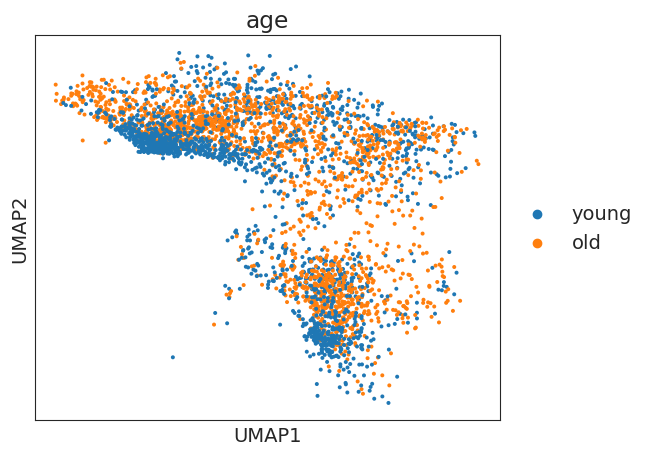

Started Diffxpy Calculation:	15-08-2024 11:27:45
training location model: True
training scale model: True
iter   0: ll=8222647.313177
iter   1: ll=7471250.958029, converged: 0.00% (loc: 0.00%, scale update: False), in 1.50sec
iter   2: ll=7294539.755468, converged: 0.00% (loc: 0.00%, scale update: False), in 1.59sec
iter   3: ll=7282346.007461, converged: 0.00% (loc: 0.00%, scale update: False), in 2.01sec
iter   4: ll=7282194.438425, converged: 0.00% (loc: 0.00%, scale update: False), in 2.57sec
iter   5: ll=7282193.633035, converged: 0.00% (loc: 0.35%, scale update: False), in 2.20sec
iter   6: ll=7225692.410055, converged: 0.00% (loc: 0.00%, scale update: True), in 17.60sec
iter   7: ll=7224891.335796, converged: 0.00% (loc: 0.10%, scale update: False), in 1.89sec
iter   8: ll=7224878.802482, converged: 0.00% (loc: 1.84%, scale update: False), in 1.75sec
iter   9: ll=7224878.632150, converged: 0.00% (loc: 10.58%, scale update: False), in 1.36sec
iter  10: ll=7224878.629520, converge

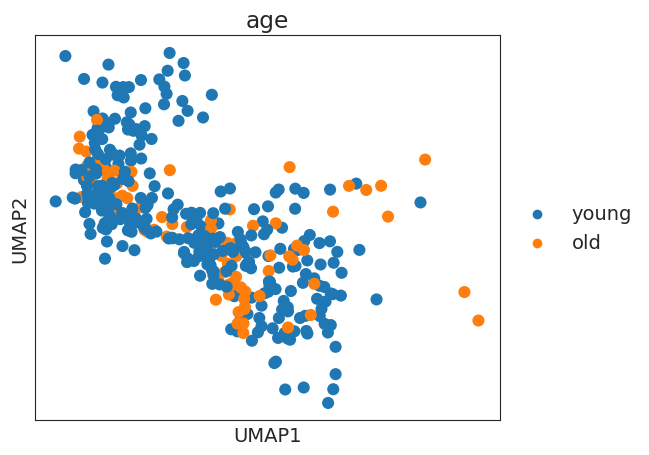

Started Diffxpy Calculation:	15-08-2024 11:29:34
training location model: True
training scale model: True
iter   0: ll=654131.702760
caught 5 linalg singular matrix errors
iter   1: ll=594925.464822, converged: 0.00% (loc: 0.21%, scale update: False), in 0.45sec
iter   2: ll=581453.995763, converged: 0.00% (loc: 0.21%, scale update: False), in 0.43sec
iter   3: ll=580701.592513, converged: 0.00% (loc: 0.21%, scale update: False), in 0.37sec
iter   4: ll=580697.610250, converged: 0.00% (loc: 0.21%, scale update: False), in 0.57sec
iter   5: ll=580697.605059, converged: 0.00% (loc: 15.07%, scale update: False), in 0.53sec
iter   6: ll=560170.134874, converged: 0.00% (loc: 0.00%, scale update: True), in 3.96sec
caught 5 linalg singular matrix errors
iter   7: ll=560095.031569, converged: 0.00% (loc: 0.46%, scale update: False), in 0.46sec
iter   8: ll=560094.269592, converged: 0.00% (loc: 3.74%, scale update: False), in 0.44sec
iter   9: ll=560094.264340, converged: 0.00% (loc: 43.85%, sc

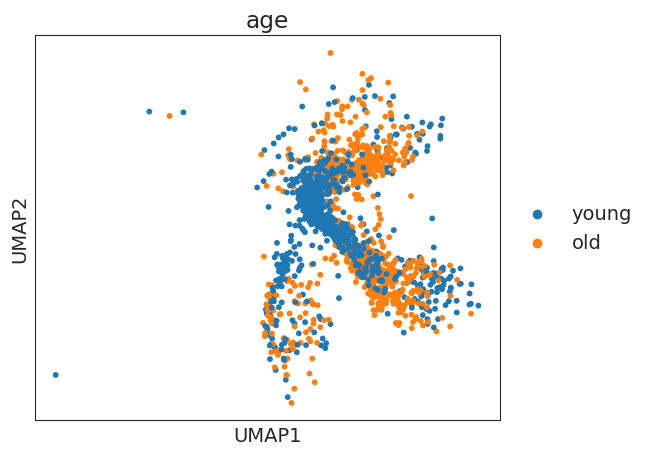

Started Diffxpy Calculation:	15-08-2024 11:30:03
training location model: True
training scale model: True
iter   0: ll=3711794.495203
iter   1: ll=3366498.375929, converged: 0.00% (loc: 0.03%, scale update: False), in 0.99sec
iter   2: ll=3286965.209176, converged: 0.00% (loc: 0.03%, scale update: False), in 0.99sec
iter   3: ll=3281980.152204, converged: 0.00% (loc: 0.03%, scale update: False), in 1.05sec
iter   4: ll=3281934.380271, converged: 0.00% (loc: 0.03%, scale update: False), in 1.09sec
iter   5: ll=3281934.204768, converged: 0.00% (loc: 1.01%, scale update: False), in 0.96sec
iter   6: ll=3226614.400047, converged: 0.00% (loc: 0.00%, scale update: True), in 8.85sec
iter   7: ll=3226253.527796, converged: 0.00% (loc: 0.05%, scale update: False), in 1.03sec
iter   8: ll=3226245.538934, converged: 0.00% (loc: 1.74%, scale update: False), in 1.24sec
iter   9: ll=3226245.329308, converged: 0.00% (loc: 13.04%, scale update: False), in 1.13sec
iter  10: ll=3226245.327440, converged

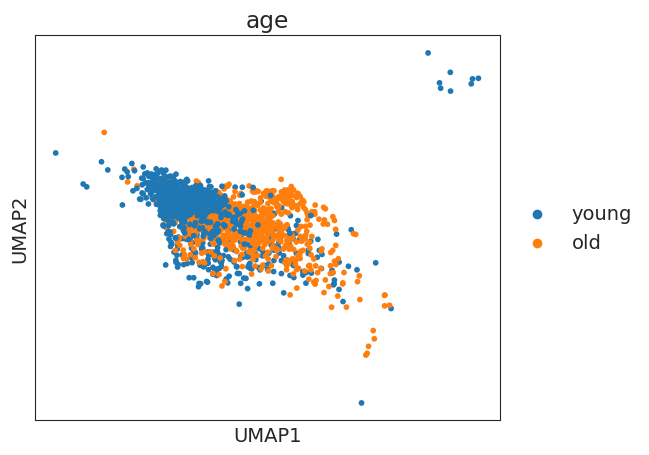

Started Diffxpy Calculation:	15-08-2024 11:31:02
training location model: True
training scale model: True
iter   0: ll=2795285.197731
iter   1: ll=2555415.577931, converged: 0.00% (loc: 0.00%, scale update: False), in 0.88sec
iter   2: ll=2495314.479078, converged: 0.00% (loc: 0.00%, scale update: False), in 1.09sec
iter   3: ll=2491289.326662, converged: 0.00% (loc: 0.00%, scale update: False), in 0.99sec
iter   4: ll=2491262.018440, converged: 0.00% (loc: 0.00%, scale update: False), in 0.91sec
iter   5: ll=2491261.972346, converged: 0.00% (loc: 2.40%, scale update: False), in 0.92sec
iter   6: ll=2440879.255217, converged: 0.00% (loc: 0.00%, scale update: True), in 7.24sec
iter   7: ll=2440617.522864, converged: 0.00% (loc: 0.03%, scale update: False), in 0.85sec
iter   8: ll=2440611.983096, converged: 0.00% (loc: 1.02%, scale update: False), in 0.87sec
iter   9: ll=2440611.907881, converged: 0.00% (loc: 14.33%, scale update: False), in 0.88sec
iter  10: ll=2440611.901052, converged

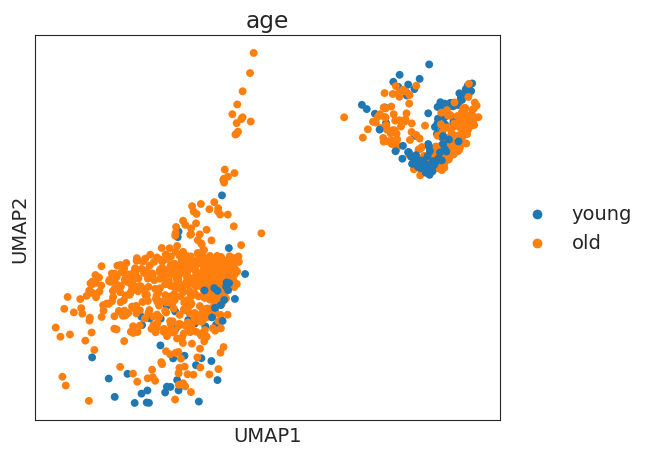

Started Diffxpy Calculation:	15-08-2024 11:31:50
training location model: True
training scale model: True
iter   0: ll=1281580.951084
caught 4 linalg singular matrix errors
iter   1: ll=1156192.008503, converged: 0.00% (loc: 0.76%, scale update: False), in 0.26sec
iter   2: ll=1122045.300974, converged: 0.00% (loc: 0.76%, scale update: False), in 0.27sec
iter   3: ll=1118152.162599, converged: 0.00% (loc: 0.76%, scale update: False), in 0.27sec
iter   4: ll=1117968.289923, converged: 0.00% (loc: 0.76%, scale update: False), in 0.29sec
iter   5: ll=1117962.134317, converged: 0.00% (loc: 1.41%, scale update: False), in 0.29sec
iter   6: ll=898755.351334, converged: 0.00% (loc: 0.00%, scale update: True), in 3.00sec
caught 4 linalg singular matrix errors
iter   7: ll=898284.162482, converged: 0.00% (loc: 0.29%, scale update: False), in 0.32sec
iter   8: ll=898240.280092, converged: 0.00% (loc: 1.47%, scale update: False), in 0.26sec
iter   9: ll=898237.005489, converged: 0.00% (loc: 6.29%

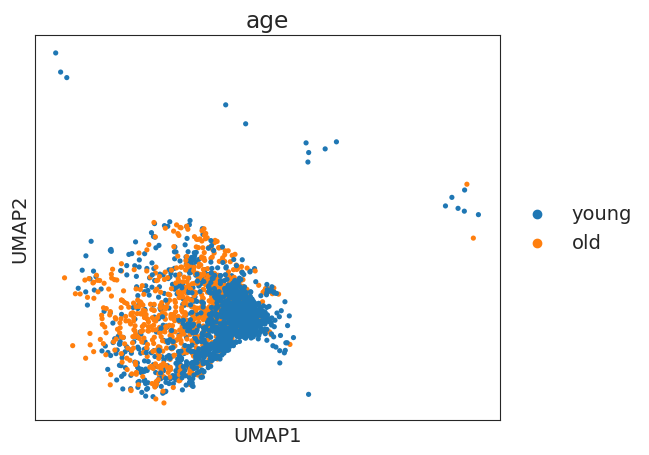

Started Diffxpy Calculation:	15-08-2024 11:32:13
training location model: True
training scale model: True
iter   0: ll=2887089.782773
iter   1: ll=2637131.467476, converged: 0.00% (loc: 0.00%, scale update: False), in 0.90sec
iter   2: ll=2574816.030823, converged: 0.00% (loc: 0.00%, scale update: False), in 0.96sec
iter   3: ll=2570802.037278, converged: 0.00% (loc: 0.00%, scale update: False), in 0.87sec
iter   4: ll=2570780.063369, converged: 0.00% (loc: 0.00%, scale update: False), in 0.92sec
iter   5: ll=2570780.057435, converged: 0.00% (loc: 12.38%, scale update: False), in 0.91sec
iter   6: ll=2515834.415419, converged: 0.00% (loc: 0.00%, scale update: True), in 7.39sec
iter   7: ll=2515746.896384, converged: 0.00% (loc: 0.00%, scale update: False), in 1.00sec
iter   8: ll=2515746.087288, converged: 0.00% (loc: 4.32%, scale update: False), in 0.98sec
iter   9: ll=2515746.079390, converged: 0.00% (loc: 69.32%, scale update: False), in 0.91sec
iter  10: ll=2515746.079202, converge

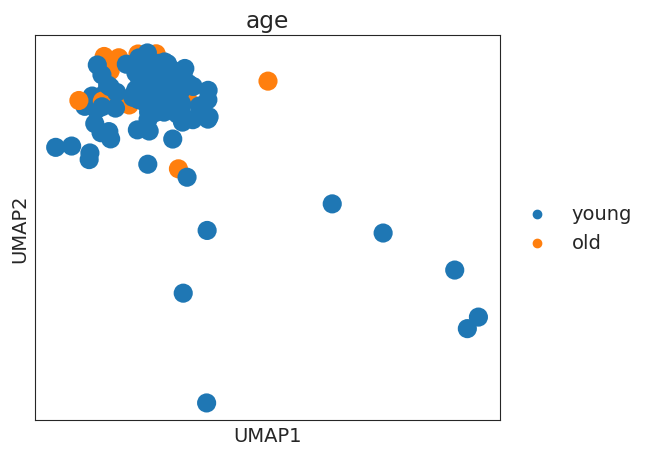

Started Diffxpy Calculation:	15-08-2024 11:32:54
training location model: True
training scale model: True
iter   0: ll=175169.367901
caught 191 linalg singular matrix errors
iter   1: ll=158436.069543, converged: 0.00% (loc: 8.08%, scale update: False), in 0.25sec
iter   2: ll=153859.200173, converged: 0.00% (loc: 8.08%, scale update: False), in 0.27sec
iter   3: ll=153509.011661, converged: 0.00% (loc: 8.08%, scale update: False), in 0.33sec
iter   4: ll=153506.258857, converged: 0.00% (loc: 8.08%, scale update: False), in 0.33sec
iter   5: ll=153506.256601, converged: 0.00% (loc: 15.02%, scale update: False), in 0.35sec
iter   6: ll=148121.217248, converged: 0.00% (loc: 0.00%, scale update: True), in 2.14sec
caught 191 linalg singular matrix errors
iter   7: ll=148093.408512, converged: 0.00% (loc: 10.24%, scale update: False), in 0.33sec
iter   8: ll=148091.986748, converged: 0.00% (loc: 14.89%, scale update: False), in 0.34sec
iter   9: ll=148091.974036, converged: 0.00% (loc: 56.5

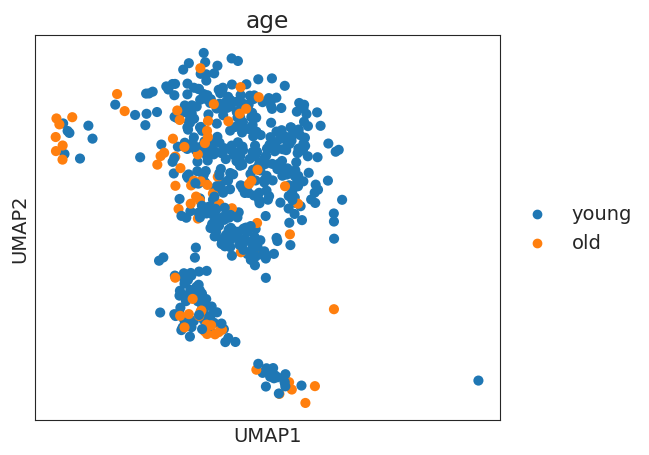

Started Diffxpy Calculation:	15-08-2024 11:33:12
training location model: True
training scale model: True
iter   0: ll=584120.712192
caught 7 linalg singular matrix errors
iter   1: ll=522638.977798, converged: 0.00% (loc: 0.36%, scale update: False), in 0.23sec
iter   2: ll=506420.515298, converged: 0.00% (loc: 0.36%, scale update: False), in 0.29sec
iter   3: ll=505275.896356, converged: 0.00% (loc: 0.36%, scale update: False), in 0.30sec
iter   4: ll=505269.027356, converged: 0.00% (loc: 0.36%, scale update: False), in 0.31sec
iter   5: ll=505269.026268, converged: 0.00% (loc: 15.11%, scale update: False), in 0.32sec
iter   6: ll=494693.507739, converged: 0.00% (loc: 0.00%, scale update: True), in 2.47sec
caught 7 linalg singular matrix errors
iter   7: ll=494681.098535, converged: 0.00% (loc: 0.67%, scale update: False), in 0.31sec
iter   8: ll=494681.022463, converged: 0.00% (loc: 11.14%, scale update: False), in 0.31sec
iter   9: ll=494681.022095, converged: 0.00% (loc: 79.63%, s

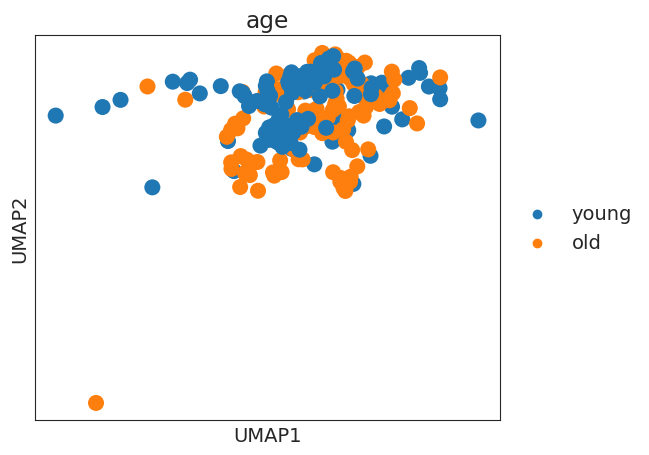

Started Diffxpy Calculation:	15-08-2024 11:33:28
training location model: True
training scale model: True
iter   0: ll=2352819.754946
caught 105 linalg singular matrix errors
iter   1: ll=2284532.248140, converged: 0.00% (loc: 8.54%, scale update: False), in 0.57sec
iter   2: ll=2263535.220225, converged: 0.00% (loc: 8.54%, scale update: False), in 0.67sec
iter   3: ll=2260135.559923, converged: 0.00% (loc: 8.54%, scale update: False), in 0.69sec
iter   4: ll=2259725.215231, converged: 0.00% (loc: 8.54%, scale update: False), in 0.67sec
iter   5: ll=2259669.057757, converged: 0.00% (loc: 8.56%, scale update: False), in 0.70sec
iter   6: ll=658425.973232, converged: 0.02% (loc: 0.02%, scale update: True), in 4.17sec
caught 98 linalg singular matrix errors
iter   7: ll=655940.911044, converged: 0.02% (loc: 2.21%, scale update: False), in 0.71sec
iter   8: ll=655415.833819, converged: 0.02% (loc: 2.82%, scale update: False), in 0.68sec
iter   9: ll=655332.438626, converged: 0.02% (loc: 6.

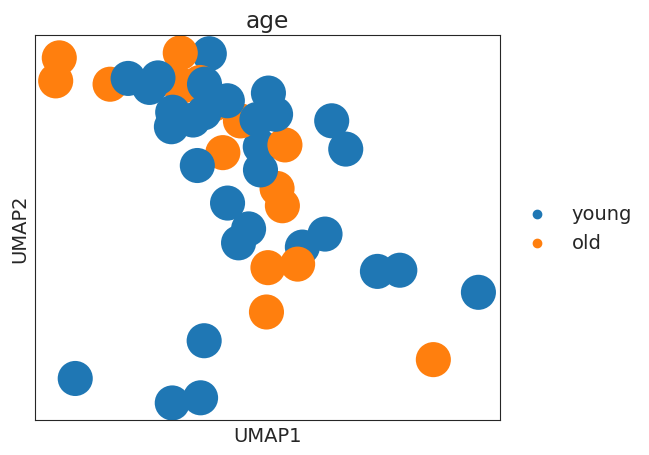

Started Diffxpy Calculation:	15-08-2024 11:34:37
training location model: True
training scale model: True
iter   0: ll=58041.892908
caught 44 linalg singular matrix errors
iter   1: ll=52096.839013, converged: 0.00% (loc: 3.00%, scale update: False), in 0.17sec
iter   2: ll=50736.779233, converged: 0.00% (loc: 3.00%, scale update: False), in 0.19sec
iter   3: ll=50647.258793, converged: 0.00% (loc: 3.00%, scale update: False), in 0.21sec
iter   4: ll=50646.163203, converged: 0.00% (loc: 3.00%, scale update: False), in 0.20sec
iter   5: ll=50646.157771, converged: 0.00% (loc: 10.52%, scale update: False), in 0.20sec
iter   6: ll=45830.716858, converged: 0.00% (loc: 0.00%, scale update: True), in 1.48sec
caught 44 linalg singular matrix errors
iter   7: ll=45799.020957, converged: 0.00% (loc: 5.29%, scale update: False), in 0.22sec
iter   8: ll=45796.808129, converged: 0.00% (loc: 10.06%, scale update: False), in 0.22sec
iter   9: ll=45796.800033, converged: 0.00% (loc: 39.65%, scale upd

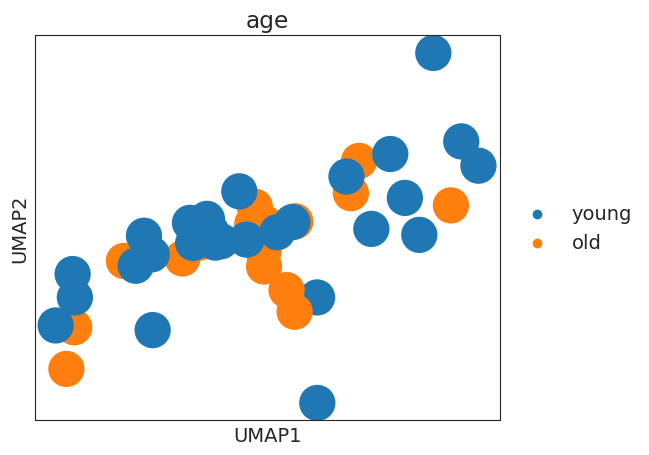

Started Diffxpy Calculation:	15-08-2024 11:34:52
training location model: True
training scale model: True
iter   0: ll=47949.776516
caught 25 linalg singular matrix errors
iter   1: ll=42794.808177, converged: 0.00% (loc: 2.10%, scale update: False), in 0.13sec
iter   2: ll=41546.639775, converged: 0.00% (loc: 2.10%, scale update: False), in 0.14sec
iter   3: ll=41453.786848, converged: 0.00% (loc: 2.10%, scale update: False), in 0.15sec
iter   4: ll=41452.257741, converged: 0.00% (loc: 2.10%, scale update: False), in 0.15sec
iter   5: ll=41452.246919, converged: 0.00% (loc: 8.97%, scale update: False), in 0.15sec
iter   6: ll=37350.778661, converged: 0.00% (loc: 0.00%, scale update: True), in 1.48sec
caught 25 linalg singular matrix errors
iter   7: ll=37322.852170, converged: 0.00% (loc: 5.01%, scale update: False), in 0.17sec
iter   8: ll=37321.386898, converged: 0.00% (loc: 8.32%, scale update: False), in 0.17sec
iter   9: ll=37321.343373, converged: 0.00% (loc: 37.64%, scale updat

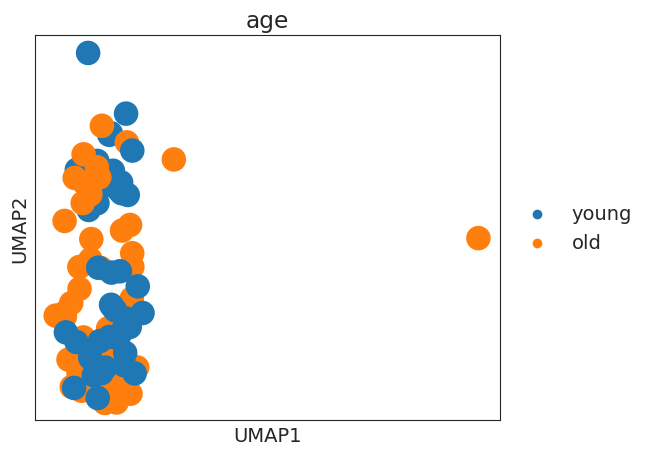

Started Diffxpy Calculation:	15-08-2024 11:35:03
training location model: True
training scale model: True
iter   0: ll=1877665.252773
caught 92 linalg singular matrix errors
iter   1: ll=1843714.482871, converged: 0.00% (loc: 16.20%, scale update: False), in 0.40sec
iter   2: ll=1834124.195498, converged: 0.00% (loc: 16.20%, scale update: False), in 0.49sec
iter   3: ll=1832801.277170, converged: 0.00% (loc: 16.20%, scale update: False), in 0.51sec
iter   4: ll=1832691.305807, converged: 0.00% (loc: 16.20%, scale update: False), in 0.48sec
iter   5: ll=1832682.811434, converged: 0.00% (loc: 16.22%, scale update: False), in 0.63sec
iter   6: ll=290227.309457, converged: 0.02% (loc: 0.02%, scale update: True), in 2.82sec
caught 88 linalg singular matrix errors
iter   7: ll=286705.127392, converged: 0.02% (loc: 3.03%, scale update: False), in 0.52sec
iter   8: ll=285869.978866, converged: 0.02% (loc: 3.84%, scale update: False), in 0.49sec
iter   9: ll=285784.790654, converged: 0.02% (loc

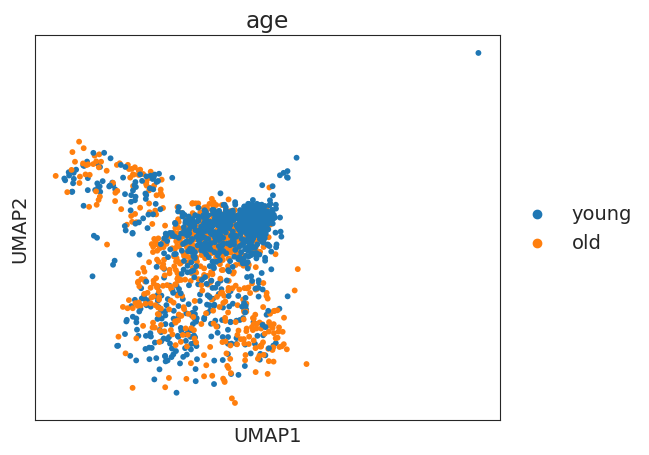

Started Diffxpy Calculation:	15-08-2024 11:35:56
training location model: True
training scale model: True
iter   0: ll=2891907.438960
caught 1 linalg singular matrix errors
iter   1: ll=2648043.258152, converged: 0.00% (loc: 0.03%, scale update: False), in 0.89sec
iter   2: ll=2589454.530116, converged: 0.00% (loc: 0.03%, scale update: False), in 0.99sec
iter   3: ll=2585858.800376, converged: 0.00% (loc: 0.03%, scale update: False), in 0.92sec
iter   4: ll=2585839.510195, converged: 0.00% (loc: 0.03%, scale update: False), in 0.96sec
iter   5: ll=2585839.500381, converged: 0.00% (loc: 5.76%, scale update: False), in 0.84sec
iter   6: ll=2520892.237100, converged: 0.00% (loc: 0.00%, scale update: True), in 7.11sec
caught 1 linalg singular matrix errors
iter   7: ll=2520702.631993, converged: 0.00% (loc: 0.03%, scale update: False), in 0.89sec
iter   8: ll=2520701.362009, converged: 0.00% (loc: 1.74%, scale update: False), in 0.88sec
iter   9: ll=2520701.354785, converged: 0.00% (loc: 2

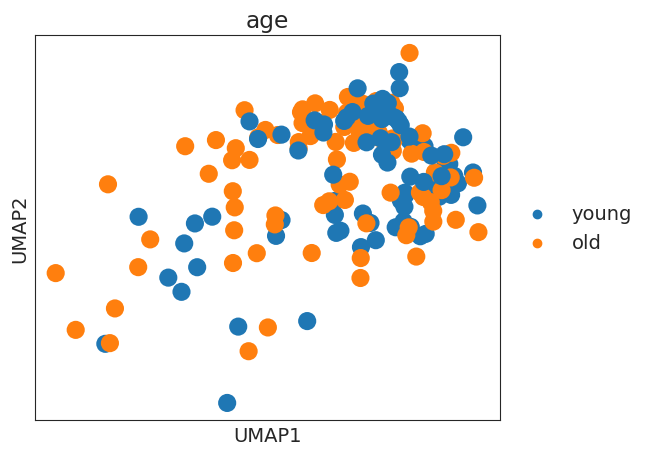

Started Diffxpy Calculation:	15-08-2024 11:36:40
training location model: True
training scale model: True
iter   0: ll=1453569.063510
caught 85 linalg singular matrix errors
iter   1: ll=1399750.324243, converged: 0.00% (loc: 7.57%, scale update: False), in 0.53sec
iter   2: ll=1385870.056913, converged: 0.00% (loc: 7.57%, scale update: False), in 0.61sec
iter   3: ll=1384370.556855, converged: 0.00% (loc: 7.57%, scale update: False), in 0.62sec
iter   4: ll=1384282.455302, converged: 0.00% (loc: 7.57%, scale update: False), in 0.63sec
iter   5: ll=1384276.820174, converged: 0.00% (loc: 7.71%, scale update: False), in 0.63sec
iter   6: ll=456591.218188, converged: 0.02% (loc: 0.02%, scale update: True), in 3.64sec
caught 83 linalg singular matrix errors
iter   7: ll=453735.927261, converged: 0.02% (loc: 2.15%, scale update: False), in 0.62sec
iter   8: ll=453117.295570, converged: 0.02% (loc: 3.40%, scale update: False), in 0.63sec
iter   9: ll=453022.814934, converged: 0.02% (loc: 11.

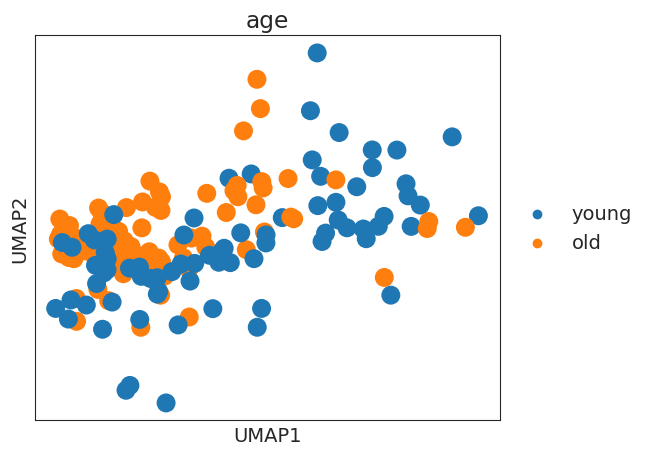

Started Diffxpy Calculation:	15-08-2024 11:37:37
training location model: True
training scale model: True
iter   0: ll=1574872.155435
caught 107 linalg singular matrix errors
iter   1: ll=1529232.273404, converged: 0.00% (loc: 8.97%, scale update: False), in 0.54sec
iter   2: ll=1518260.191184, converged: 0.00% (loc: 8.97%, scale update: False), in 0.59sec
iter   3: ll=1517320.849193, converged: 0.00% (loc: 8.97%, scale update: False), in 0.78sec
iter   4: ll=1517293.375099, converged: 0.00% (loc: 8.97%, scale update: False), in 0.64sec
iter   5: ll=1517292.674086, converged: 0.00% (loc: 9.29%, scale update: False), in 0.64sec
iter   6: ll=423618.877126, converged: 0.00% (loc: 0.00%, scale update: True), in 3.64sec
caught 104 linalg singular matrix errors
iter   7: ll=421687.152198, converged: 0.00% (loc: 2.99%, scale update: False), in 0.65sec
iter   8: ll=421430.721752, converged: 0.00% (loc: 4.61%, scale update: False), in 0.65sec
iter   9: ll=421413.473308, converged: 0.00% (loc: 1

iter  86: ll=378630.272569, converged: 99.80% (loc: 99.80%, scale update: True), in 0.87sec
iter  87: ll=378630.272547, converged: 99.80% (loc: 99.86%, scale update: False), in 0.17sec
iter  88: ll=378630.272547, converged: 99.80% (loc: 99.90%, scale update: False), in 0.16sec
iter  89: ll=378630.272547, converged: 99.80% (loc: 100.00%, scale update: False), in 0.15sec
iter  90: ll=378630.272528, converged: 99.82% (loc: 99.82%, scale update: True), in 0.86sec
iter  91: ll=378630.272512, converged: 99.82% (loc: 99.88%, scale update: False), in 0.17sec
iter  92: ll=378630.272512, converged: 99.82% (loc: 99.90%, scale update: False), in 0.15sec
iter  93: ll=378630.272512, converged: 99.82% (loc: 100.00%, scale update: False), in 0.14sec
iter  94: ll=378630.272499, converged: 99.88% (loc: 99.88%, scale update: True), in 0.82sec
iter  95: ll=378630.272487, converged: 99.88% (loc: 99.88%, scale update: False), in 0.14sec
iter  96: ll=378630.272487, converged: 99.88% (loc: 99.94%, scale updat

In [17]:
subset = ["young", "old"]
condition = "age"
ct_label = "meta_label"
min_cells = 10

time = "d37"
time_subset = adata[adata.obs.day == time].copy()
sc.pl.umap(time_subset, color = ["age", "meta_label"], size = 10, wspace = 0.25)

for ct in cell_types:
    
    print("%s - %s" %(ct, time))
    dge(time_subset, ct = ct, ct_label = ct_label, condition = condition, ref = "young", pct_thresh = 0.05,
        subset = subset, min_cells = min_cells, do_return = False, suffix = "")